In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
import warnings, joblib, gc, re, time
warnings.filterwarnings('ignore')
from scipy.stats import probplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from mlxtend.plotting import plot_decision_regions
from feature_engine.outliers import Winsorizer
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures
from sklearn.impute import SimpleImputer
from yellowbrick.regressor import PredictionError, ResidualsPlot

# Milestone 1: Data Collection, Exploration, and Preprocessing 

## 1- Data Collecting

In [2]:
df = pd.read_csv(r"Dataset\superstore_dataset2011-2015.csv", encoding = "ISO-8859-1")
df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,42433,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,...,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.300,2,0.0,106.1400,35.46,Medium
1,22253,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.1,36.0360,9.72,Medium
2,48883,HU-2011-1220,1/1/2011,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,...,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.120,4,0.0,29.6400,8.17,High
3,11731,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,...,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.865,3,0.5,-26.0550,4.82,High
4,22255,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.670,5,0.1,37.7700,4.70,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,32593,CA-2014-115427,31-12-2014,4/1/2015,Standard Class,EB-13975,Erica Bern,Corporate,Fairfield,California,...,OFF-BI-10002103,Office Supplies,Binders,"Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl",13.904,2,0.2,4.5188,0.89,Medium
51286,47594,MO-2014-2560,31-12-2014,5/1/2015,Standard Class,LP-7095,Liz Preis,Consumer,Agadir,Souss-Massa-Draâ,...,OFF-WIL-10001069,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",3.990,1,0.0,0.4200,0.49,Medium
51287,8857,MX-2014-110527,31-12-2014,2/1/2015,Second Class,CM-12190,Charlotte Melton,Consumer,Managua,Managua,...,OFF-LA-10004182,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",26.400,3,0.0,12.3600,0.35,Medium
51288,6852,MX-2014-114783,31-12-2014,6/1/2015,Standard Class,TD-20995,Tamara Dahlen,Consumer,Juárez,Chihuahua,...,OFF-LA-10000413,Office Supplies,Labels,"Hon Legal Exhibit Labels, Alphabetical",7.120,1,0.0,0.5600,0.20,Medium


## 2- Data Exploration

In [3]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'City', 'State', 'Country',
       'Postal Code', 'Market', 'Region', 'Product ID', 'Category',
       'Sub-Category', 'Product Name', 'Sales', 'Quantity', 'Discount',
       'Profit', 'Shipping Cost', 'Order Priority'],
      dtype='object')

In [4]:
df.drop(['Postal Code','Row ID','Order ID','Customer ID','Customer Name','Product ID'], axis=1, inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Order Date      51290 non-null  object 
 1   Ship Date       51290 non-null  object 
 2   Ship Mode       51290 non-null  object 
 3   Segment         51290 non-null  object 
 4   City            51290 non-null  object 
 5   State           51290 non-null  object 
 6   Country         51290 non-null  object 
 7   Market          51290 non-null  object 
 8   Region          51290 non-null  object 
 9   Category        51290 non-null  object 
 10  Sub-Category    51290 non-null  object 
 11  Product Name    51290 non-null  object 
 12  Sales           51290 non-null  float64
 13  Quantity        51290 non-null  int64  
 14  Discount        51290 non-null  float64
 15  Profit          51290 non-null  float64
 16  Shipping Cost   51290 non-null  float64
 17  Order Priority  51290 non-null 

In [6]:
df.describe()

,Sales,Quantity,Discount,Profit,Shipping Cost
count,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,246.490581,3.476545,0.142908,28.610982,26.375915
std,487.565361,2.278766,0.212280,174.340972,57.296804
min,0.444000,1.000000,0.000000,-6599.978000,0.000000
25%,30.758625,2.000000,0.000000,0.000000,2.610000
50%,85.053000,3.000000,0.000000,9.240000,7.790000
75%,251.053200,5.000000,0.200000,36.810000,24.450000
max,22638.480000,14.000000,0.850000,8399.976000,933.570000


In [7]:
df.nunique() / len(df)

Order Date        0.027881
Ship Date         0.028544
Ship Mode         0.000078
Segment           0.000058
City              0.070891
State             0.021330
Country           0.002866
Market            0.000136
Region            0.000253
Category          0.000058
Sub-Category      0.000331
Product Name      0.073855
Sales             0.448333
Quantity          0.000273
Discount          0.000526
Profit            0.479138
Shipping Cost     0.195691
Order Priority    0.000078
dtype: float64

In [8]:
df.isna().sum()

Order Date        0
Ship Date         0
Ship Mode         0
Segment           0
City              0
State             0
Country           0
Market            0
Region            0
Category          0
Sub-Category      0
Product Name      0
Sales             0
Quantity          0
Discount          0
Profit            0
Shipping Cost     0
Order Priority    0
dtype: int64

In [9]:
df.duplicated().sum()

0

## 3- Exploratory Data Analysis

### Univariate Analysis

Skewness of Sales: 8.13808002122054
Kurtosis of Sales: 176.7311999336456


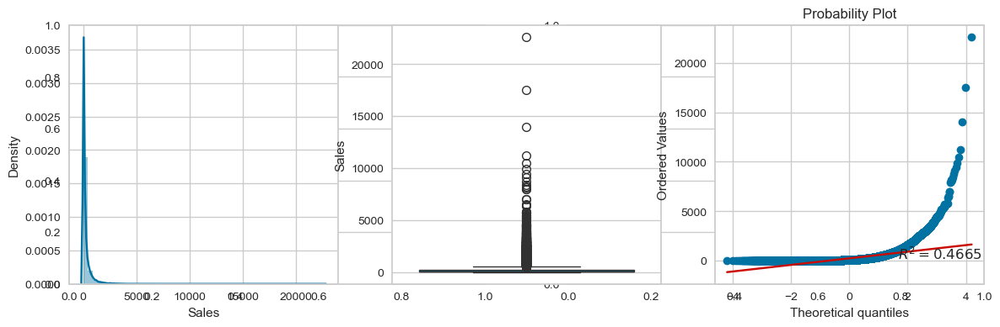

Skewness of Quantity: 1.3603677307024207
Kurtosis of Quantity: 2.2758887299856605


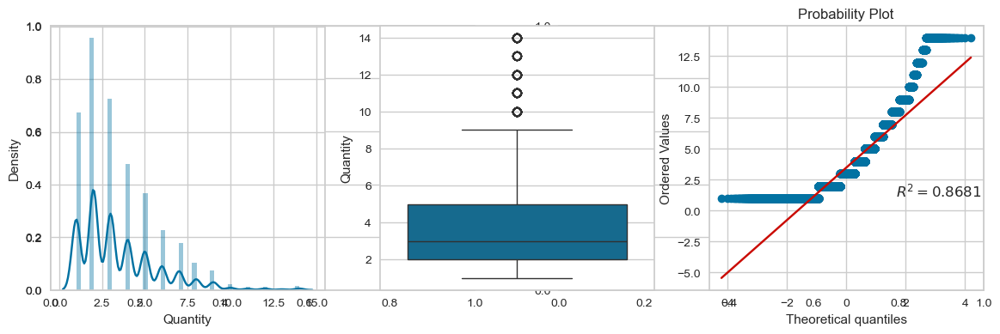

Skewness of Discount: 1.387774552133839
Kurtosis of Discount: 0.7166824084745791


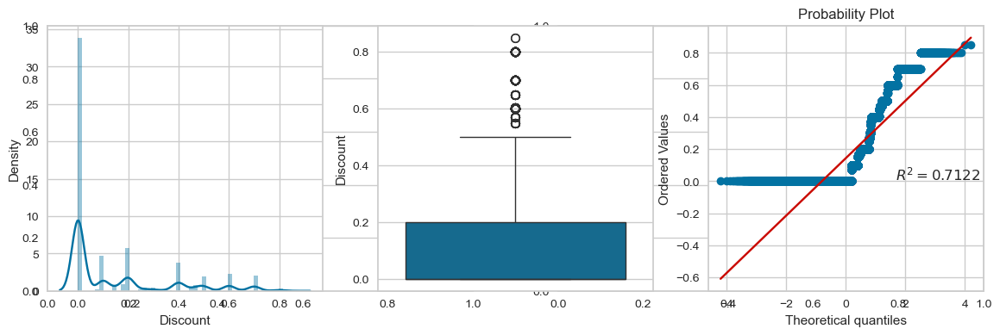

Skewness of Profit: 4.157188532777367
Kurtosis of Profit: 291.4110895698068


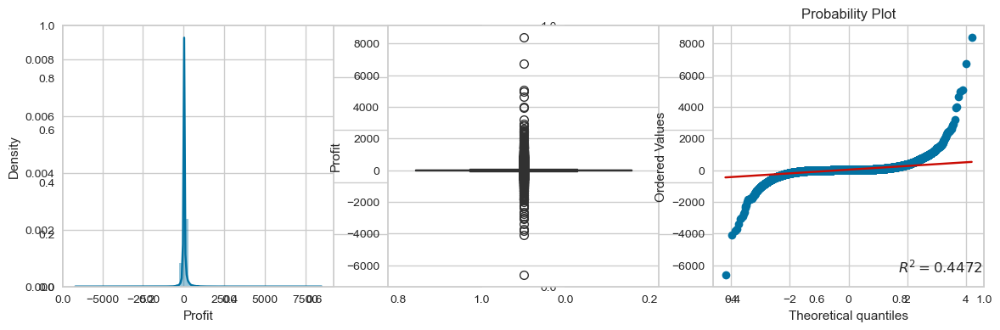

Skewness of Shipping Cost: 5.863226425710676
Kurtosis of Shipping Cost: 50.02015773872411


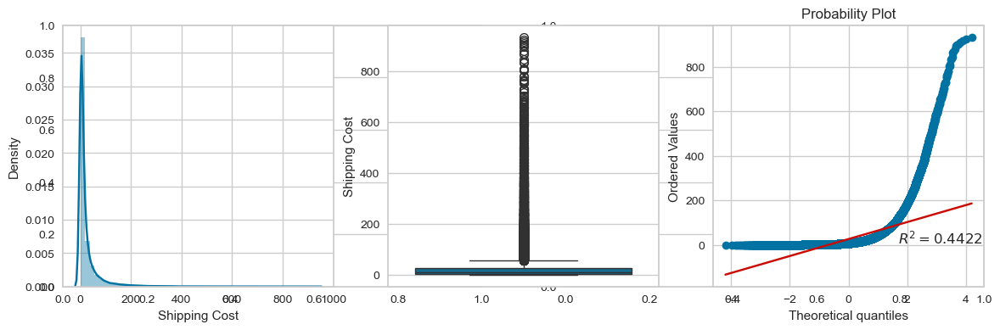

In [10]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [11]:
skewed_cols = ['Quantity','Discount','Profit']

In [12]:
df.drop('Country', axis=1, inplace=True)

In [13]:
subcategory_counts = df.groupby(["Category", "Sub-Category"]).size().reset_index(name="Count")
category_sales = df.groupby("Category")["Sales"].sum().reset_index()

fig_sunburst = px.sunburst(subcategory_counts, path=["Category", "Sub-Category"], values="Count", 
                           title="Category and Subcategory Distribution", color="Category")
fig_sunburst.update_traces(textinfo="label+percent entry")
fig_sunburst.update_layout(title_font=dict(size=20, family="Arial", color="black"),
                            legend_title="Categories",
                            legend=dict(font=dict(size=10)),
                            paper_bgcolor="white")

fig_sunburst.update_traces(marker=dict(line=dict(width=2, color="white")))
fig_sunburst.update_layout(title_text="Category and Subcategory Distribution", title_x=0.5, height=600, width=800)
fig_sunburst.update_traces(textinfo="label+percent entry")
fig_sunburst.update_layout(title_font=dict(size=20, family="Arial", color="black"),
                            legend_title="Categories",
                            legend=dict(font=dict(size=10)),
                            paper_bgcolor="white")

fig_sunburst.show()

Majority of the products are in Office Supplies category whereas the least number of products are in Technology category.

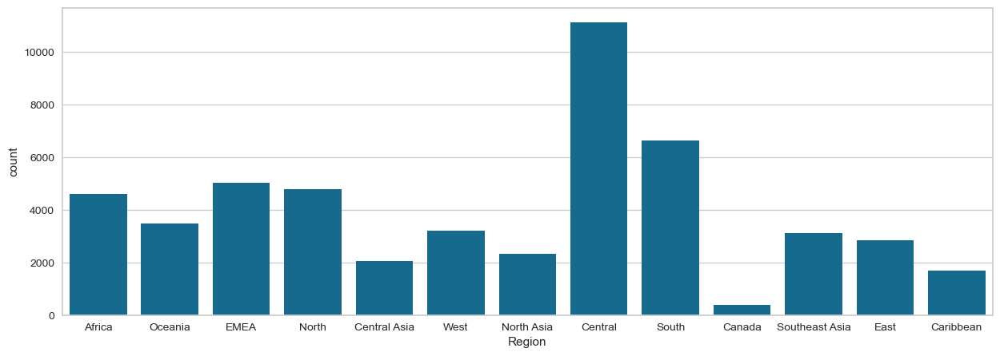

In [14]:
plt.figure(figsize=(15,5))
sns.countplot(x='Region',data=df)
plt.show()

In [15]:
region_sales = df.groupby("Region", as_index=False)["Sales"].sum().sort_values(by="Sales", ascending=False)

fig = px.pie(region_sales, 
             values="Sales", 
             names="Region", 
             title="Sales Percentage by Region", 
             hole=0.4,  # Converts it to a ring (donut) chart
             color_discrete_sequence=px.colors.qualitative.Set3  # Sets color theme
            )

# Update layout for better aesthetics
fig.update_traces(textposition='inside', textinfo='percent+label')  # Pulls the first four slices out for emphasis
fig.update_layout(
    title_text="Sales Percentage by Region",
    title_x=0.5,  # Center the title
    height=600,  # Set height of the figure
    width=800,  # Set width of the figure
    legend_title_text="Regions",  # Legend title
    legend=dict(font=dict(size=10)),  # Font size for legend
    paper_bgcolor="white"  # Background color
)


# Set the pie chart to display in clockwise direction
fig.update_traces(direction="clockwise")

fig.update_layout(
    title_font=dict(size=20, family="Arial", color="black"),
    legend_title="Regions",
    legend=dict(font=dict(size=9)),
    paper_bgcolor="white"  # Background color
)

fig.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

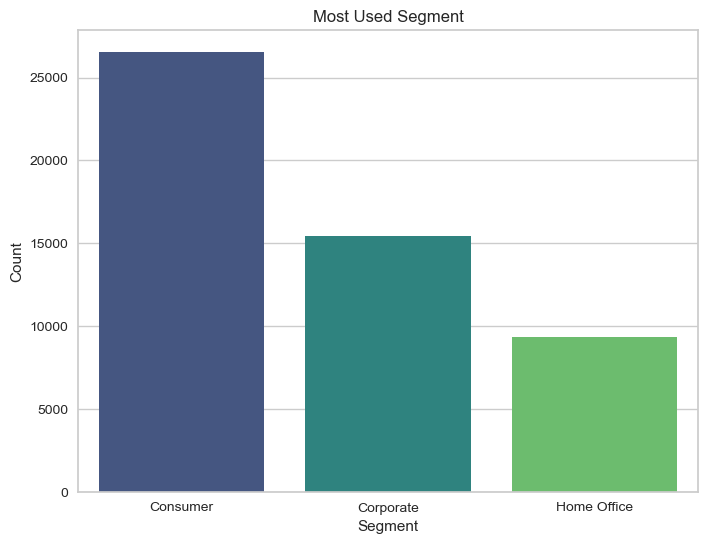

In [16]:
segment_counts = df['Segment'].value_counts()

plt.figure(figsize=(8,6))
sns.barplot(x=segment_counts.index, y=segment_counts.values, palette="viridis")
plt.title("Most Used Segment")
plt.xlabel("Segment")
plt.ylabel("Count")
plt.show()

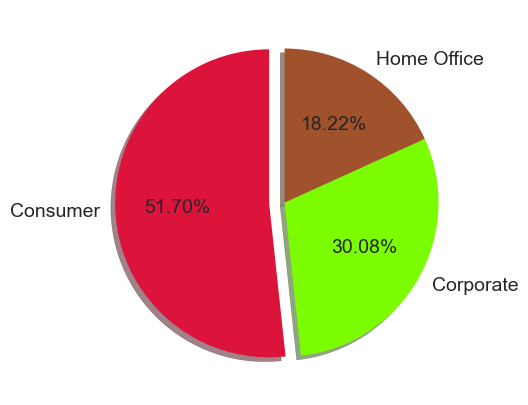

In [17]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna'])
plt.show()

More than half of the entire population belongs to the Consumer segment.

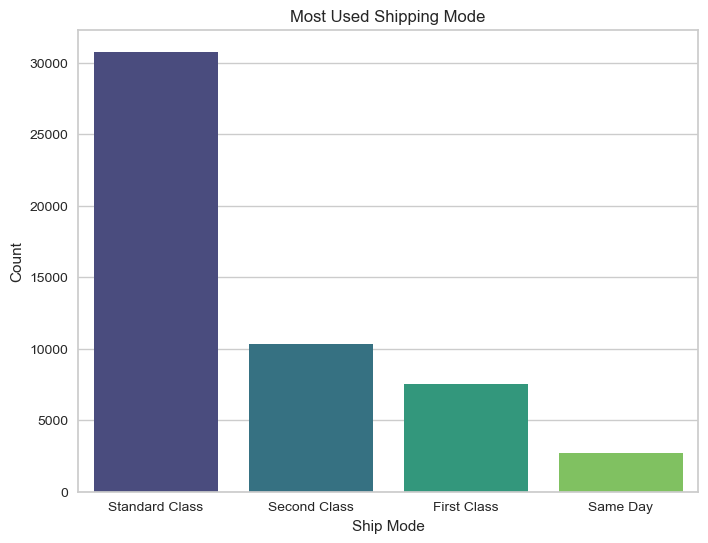

In [18]:
shipping_counts = df['Ship Mode'].value_counts()

plt.figure(figsize=(8, 6))
sns.barplot(x=shipping_counts.index, y=shipping_counts.values, palette="viridis")
plt.title("Most Used Shipping Mode")
plt.xlabel("Ship Mode")
plt.ylabel("Count")
plt.show()

In [19]:
shipping_counts

Ship Mode
Standard Class    30775
Second Class      10309
First Class        7505
Same Day           2701
Name: count, dtype: int64

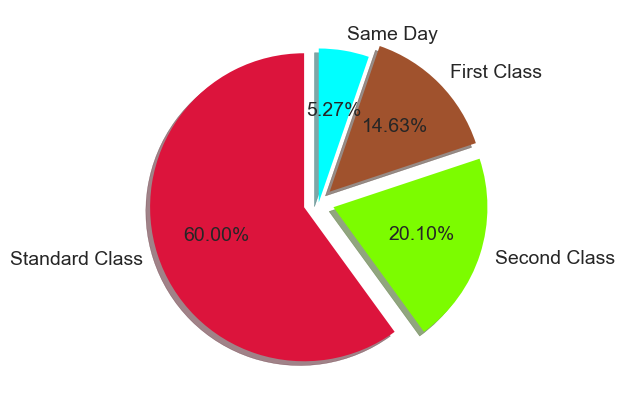

In [20]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna','cyan'])
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

### Bivariate Analysis

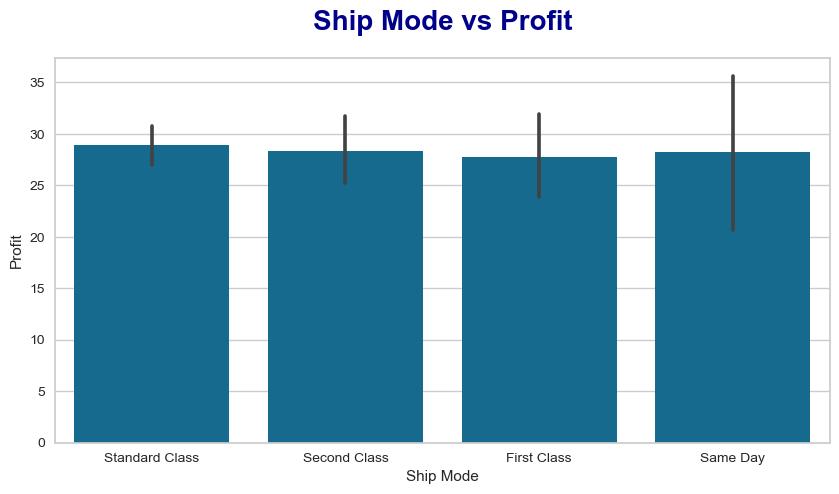

In [21]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20,color='darkblue',fontweight='bold')
plt.show()

The First Class was the most profitable shipping mode while the Standard shipping mode was the least profitable.

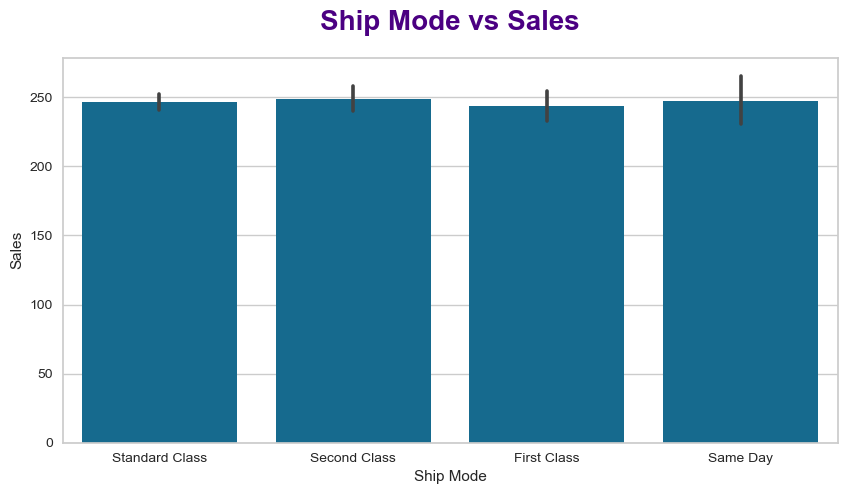

In [22]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

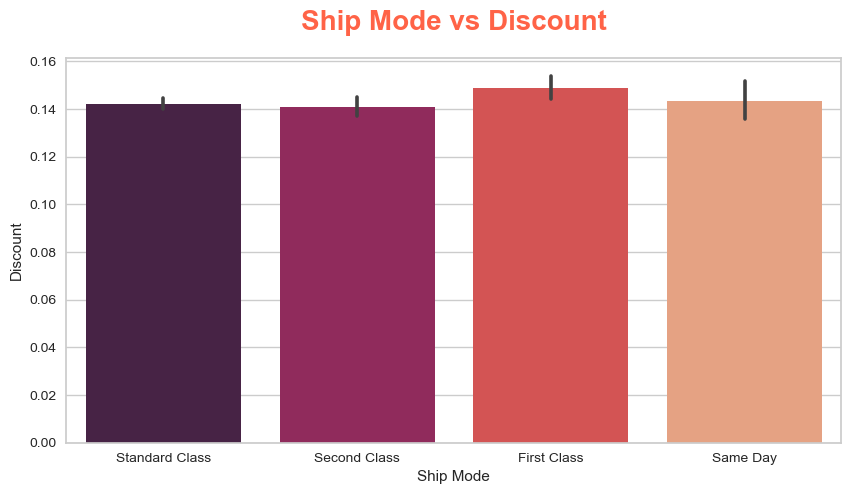

In [23]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the First Class shipping mode whereas the minimum discount was given on products that were shipped via the Second Class.

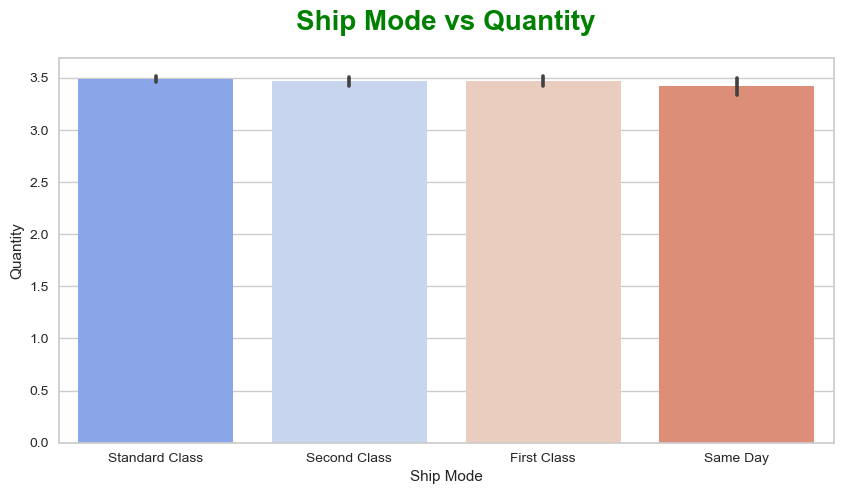

In [24]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Second Class and Standard Class shipping modes whereas the least quantities were shipped through the Same Day shipping mode.

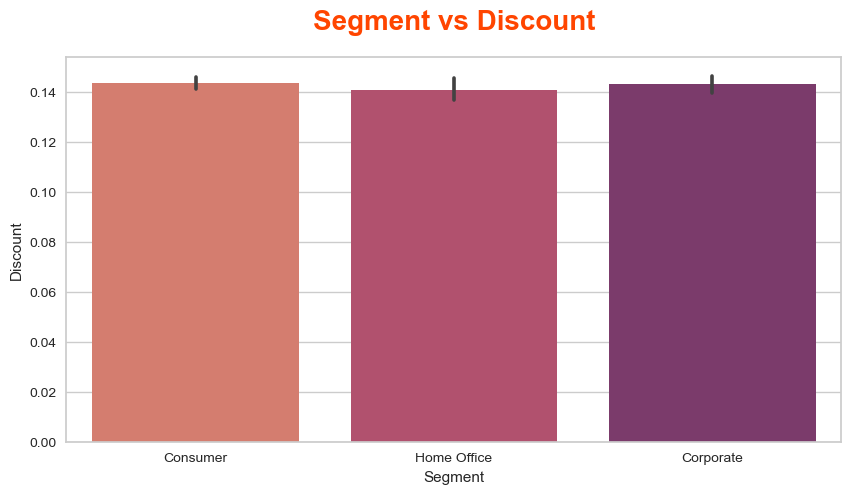

In [25]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

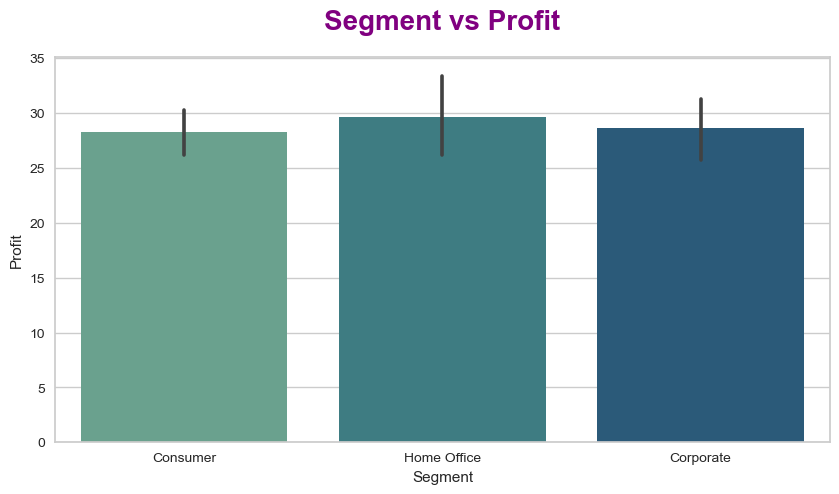

In [26]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

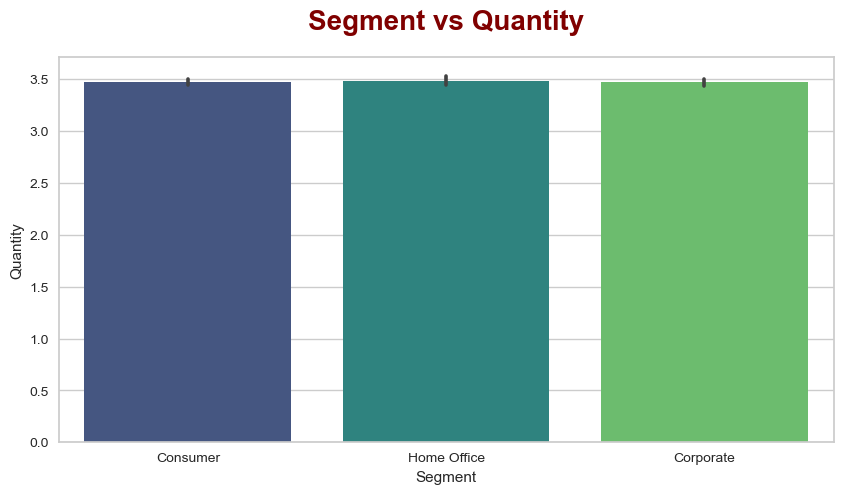

In [27]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

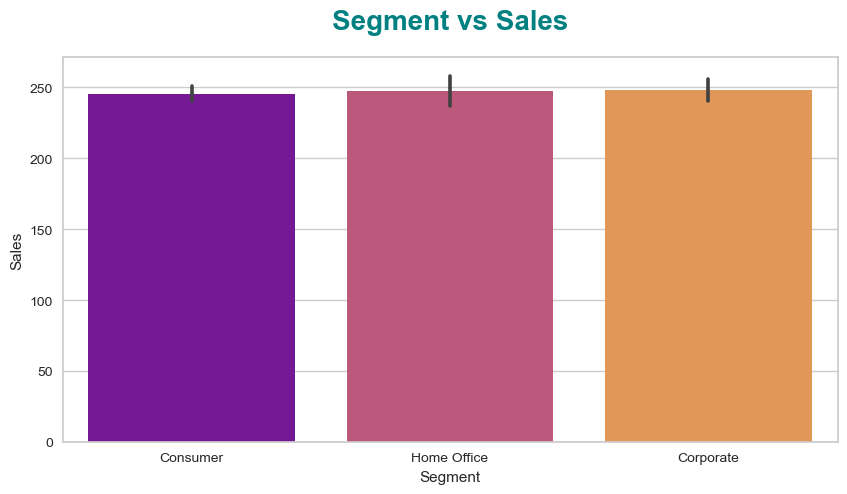

In [28]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Home Office segment generated the maximum sales whereas those made by the Consumer segment generated the minimum sales.

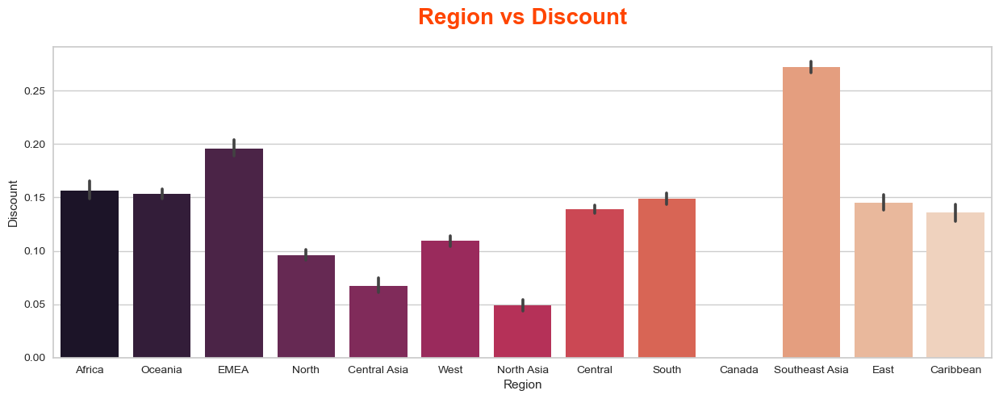

In [29]:
plt.figure(figsize=(15,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the Western region.

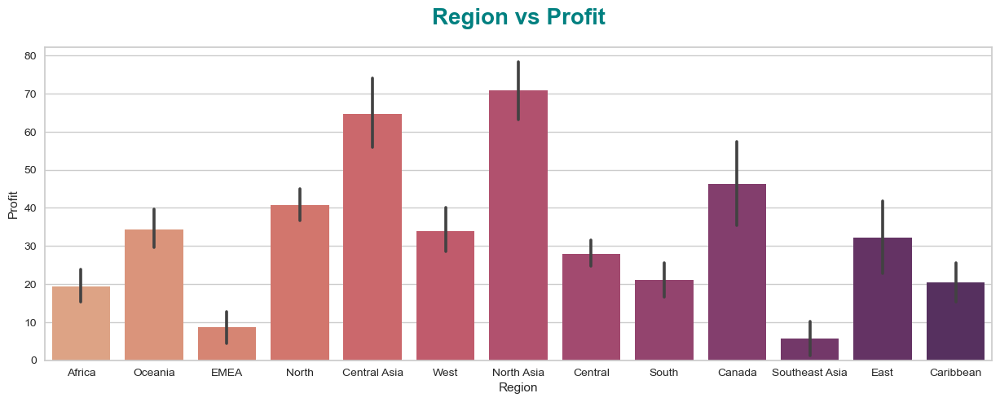

In [30]:
plt.figure(figsize=(15,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the Western region while the lowest profit was obtained in the Central region.

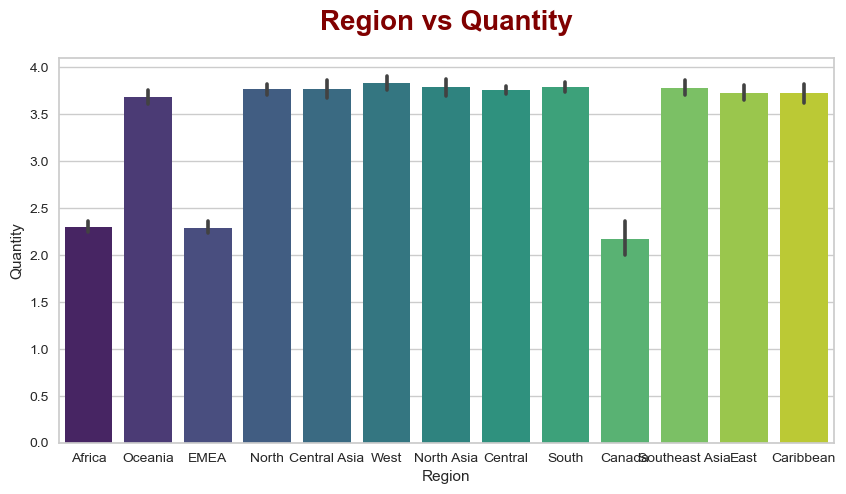

In [31]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

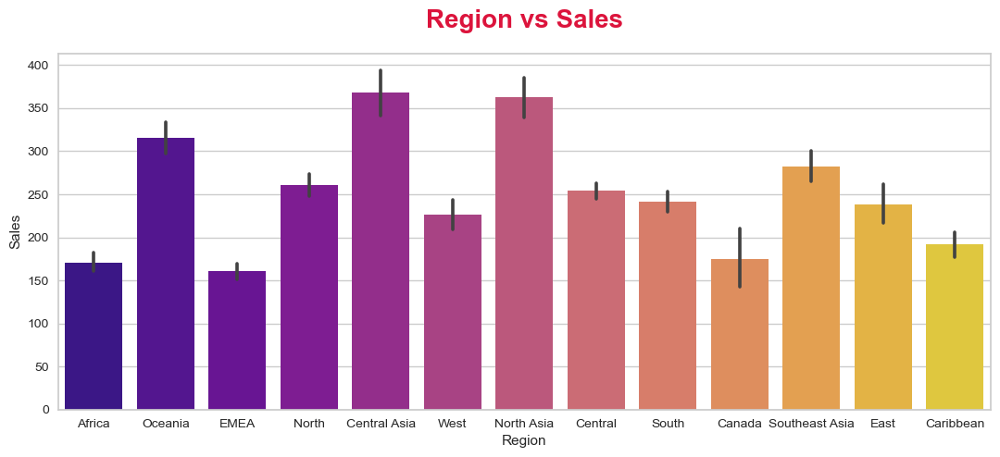

In [32]:
plt.figure(figsize=(13,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

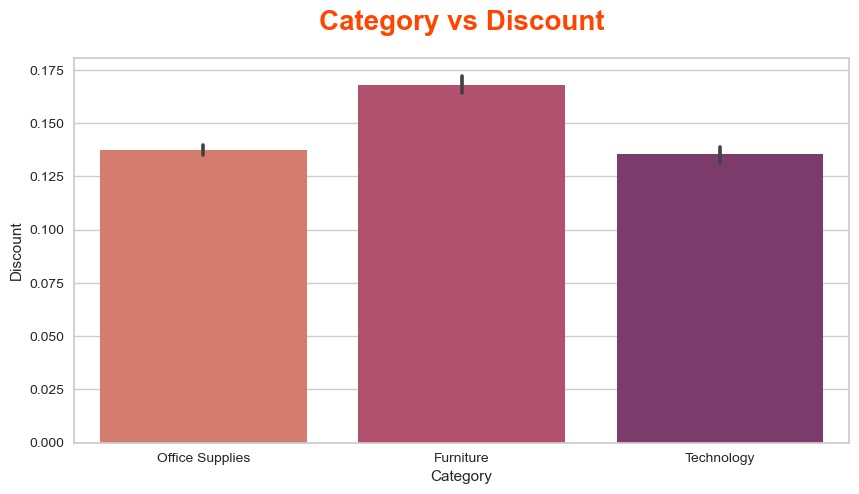

In [33]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Discount',data=df,palette='flare')
plt.title('Category vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A significant discount was provided on furniture products whereas the least discount was given on technology products.

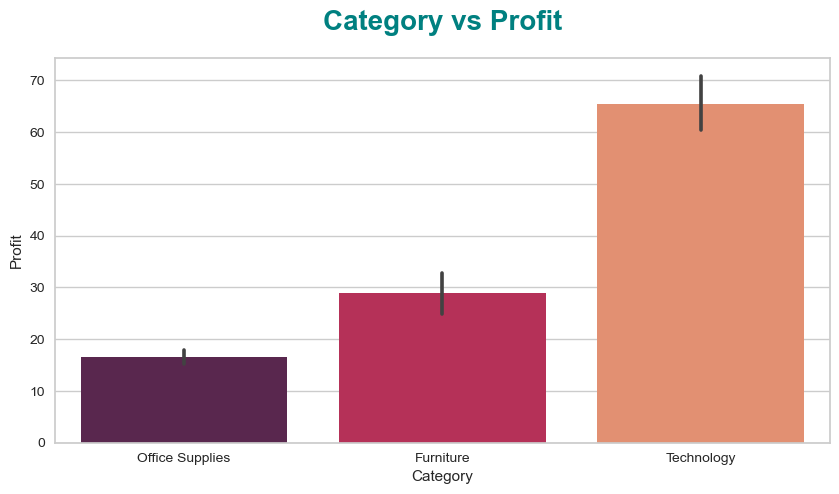

In [34]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Profit',data=df,palette='rocket')
plt.title('Category vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The products belonging to the Technology category are the most profitable while the products belonging to the Furniture category are the least profitable.

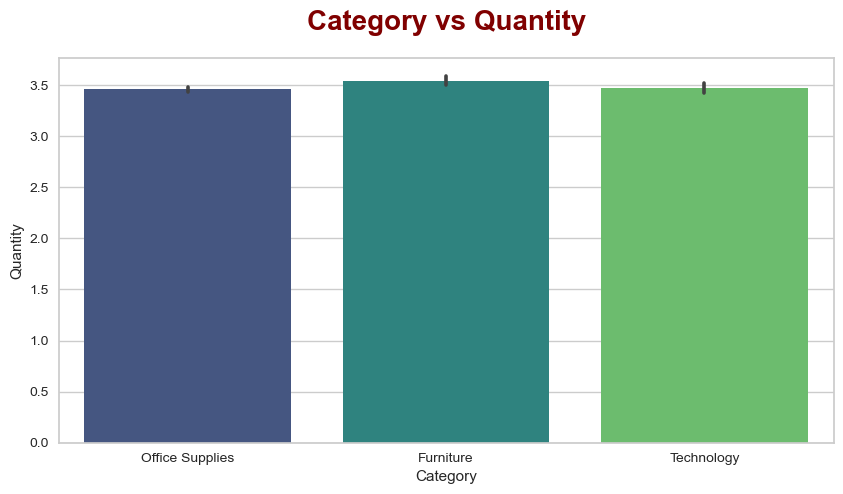

In [35]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Quantity',data=df,palette='viridis')
plt.title('Category vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

All categories have almost similar quantities of products ordered.

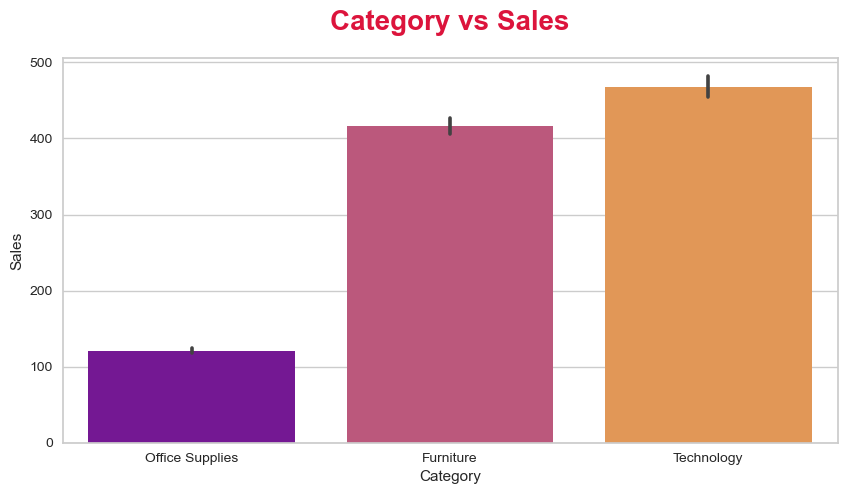

In [36]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Sales',data=df,palette='plasma')
plt.title('Category vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The maximum sales were recorded in the Technology category while the lowest sales were obtained in the Office Supplies category.

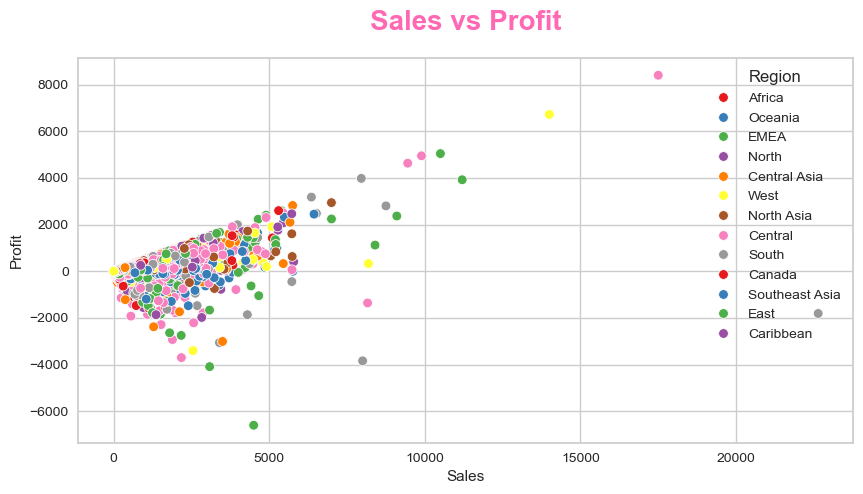

31499

In [37]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Region',palette='Set1')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The Western region recorded the lowest sales and profit among all regions whereas the Eastern region generated a considerable profit in general across all regions.

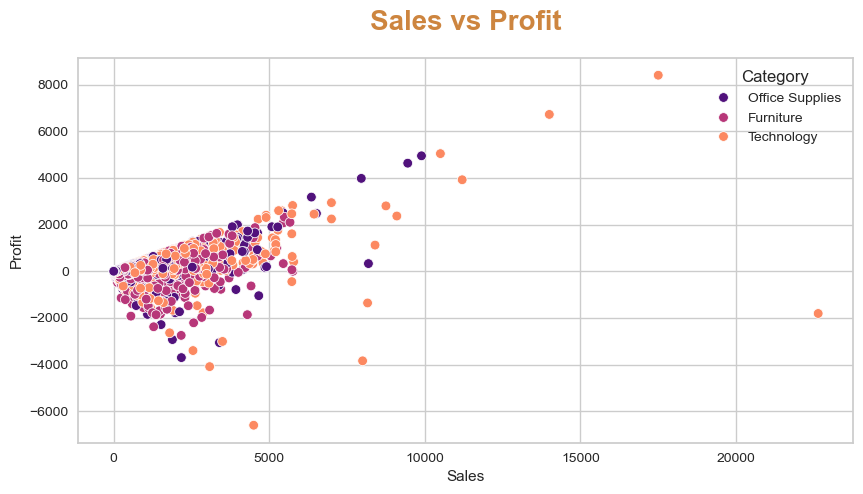

39897

In [38]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Category',palette='magma')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='peru')
plt.show()
plt.close('all')
del fig
gc.collect()

It is clearly evident from the above plot that the highest profit was obtained in the Technology category whereas the lowest profit was obtained in the Office Supplies category.

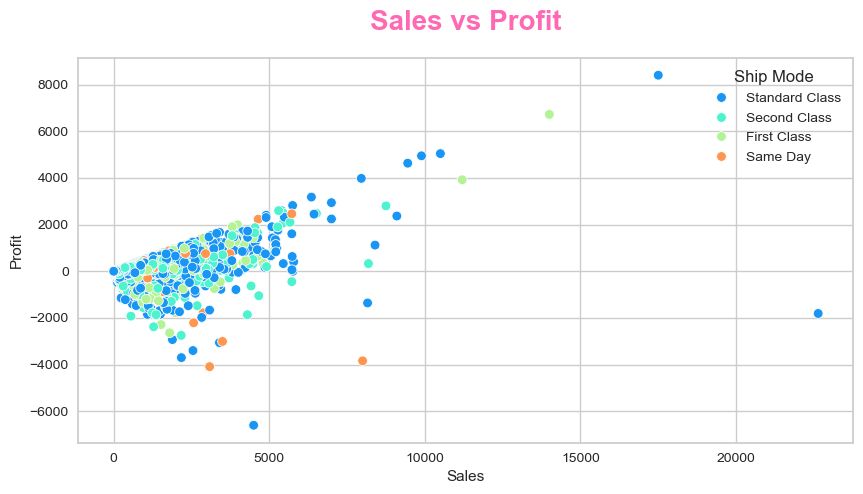

3759

In [39]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The highest sales and profit were recorded in the orders delivered via the Standard Class shipping mode while the Second Class shipping mode was the least profitable.

### Multivariate Analysis

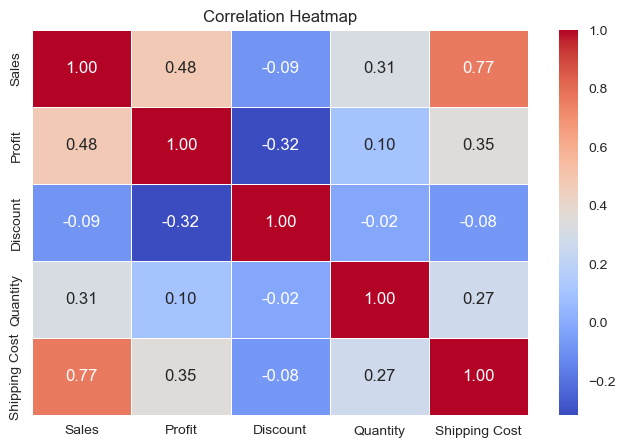

In [40]:
correlation_matrix = df[["Sales", "Profit", "Discount", "Quantity", "Shipping Cost"]].corr()

plt.figure(figsize=(8, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

<Figure size 1000x500 with 0 Axes>

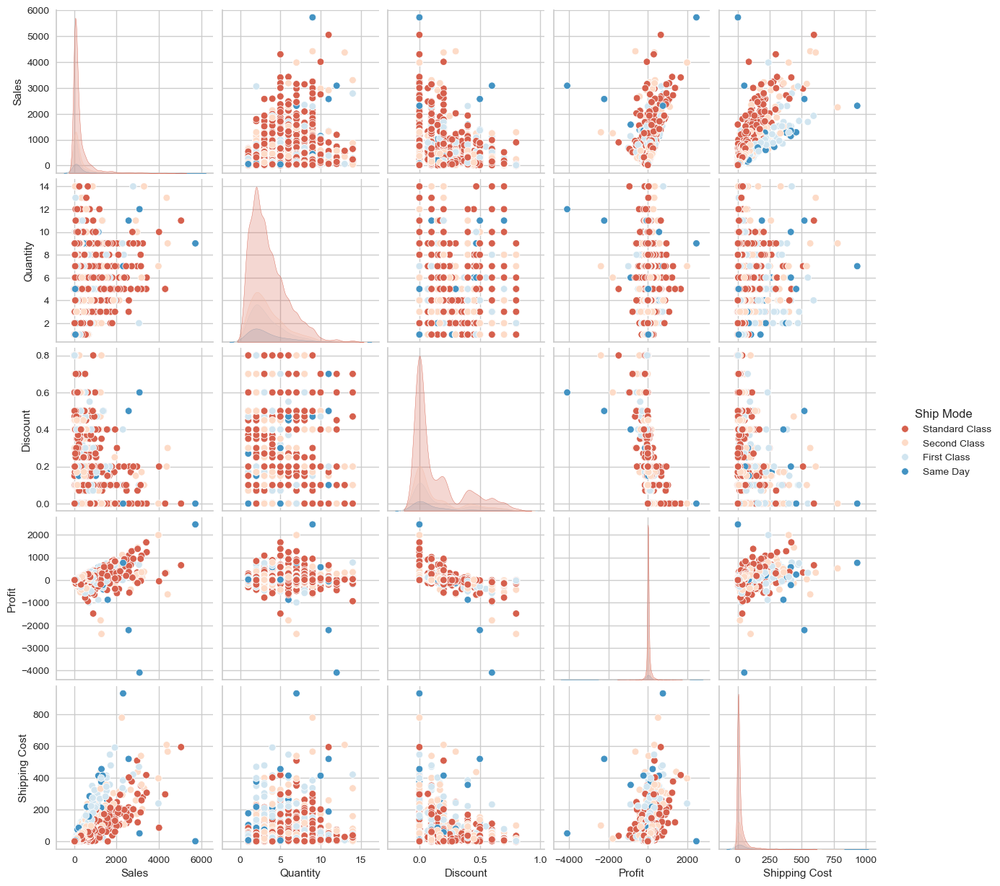

84148

In [41]:
plt.figure(figsize=(10,5))
fig = sns.pairplot(df.sample(n=5000),hue='Ship Mode',palette='RdBu')
plt.show()
plt.close('all')
del fig
gc.collect()

## 4- Data Preprocessing and Feature Engineering

### Feature Extraction

In [42]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [43]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [44]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            51290 non-null  object 
 1   Segment              51290 non-null  object 
 2   City                 51290 non-null  object 
 3   State                51290 non-null  object 
 4   Market               51290 non-null  object 
 5   Region               51290 non-null  object 
 6   Category             51290 non-null  object 
 7   Sub-Category         51290 non-null  object 
 8   Product Name         51290 non-null  object 
 9   Sales                51290 non-null  float64
 10  Quantity             51290 non-null  int64  
 11  Discount             51290 non-null  float64
 12  Profit               51290 non-null  float64
 13  Shipping Cost        51290 non-null  float64
 14  Order Priority       51290 non-null  object 
 15  Profit Margin        51290 non-null 

### Categorical Encoding

In [45]:
df['Ship Mode'].unique()

array(['Standard Class', 'Second Class', 'First Class', 'Same Day'],
      dtype=object)

In [46]:
df['Segment'].unique()

array(['Consumer', 'Home Office', 'Corporate'], dtype=object)

In [47]:
df['Category'].unique()

array(['Office Supplies', 'Furniture', 'Technology'], dtype=object)

In [48]:
df['Sub-Category'].unique()

array(['Storage', 'Supplies', 'Paper', 'Furnishings', 'Copiers',
       'Bookcases', 'Appliances', 'Art', 'Accessories', 'Binders',
       'Labels', 'Envelopes', 'Chairs', 'Machines', 'Tables', 'Phones',
       'Fasteners'], dtype=object)

In [49]:
df['Product Name'].nunique()

3788

In [50]:
df['City'].nunique()

3636

In [51]:
df['State'].nunique()

1094

In [52]:
df['Region'].unique()

array(['Africa', 'Oceania', 'EMEA', 'North', 'Central Asia', 'West',
       'North Asia', 'Central', 'South', 'Canada', 'Southeast Asia',
       'East', 'Caribbean'], dtype=object)

In [53]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [54]:
for col in ['Ship Mode','Segment','State','City','Region','Category','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [55]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [56]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.3603677307024207
Kurtosis of Quantity: 2.2758887299856605


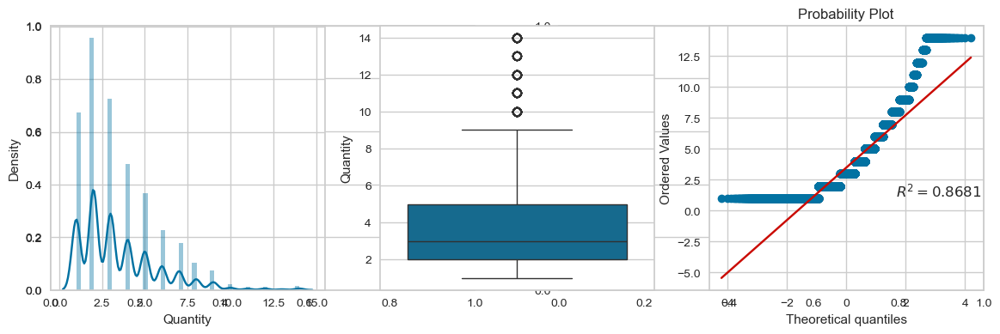

Skewness of Discount: 1.387774552133839
Kurtosis of Discount: 0.7166824084745791


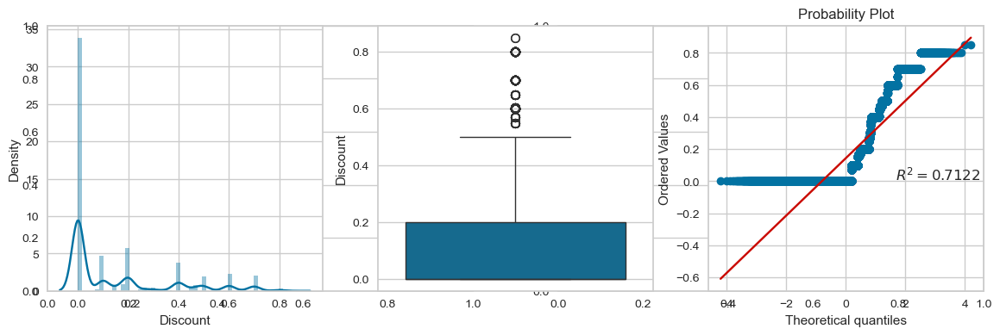

Skewness of Profit: 4.157188532777367
Kurtosis of Profit: 291.4110895698068


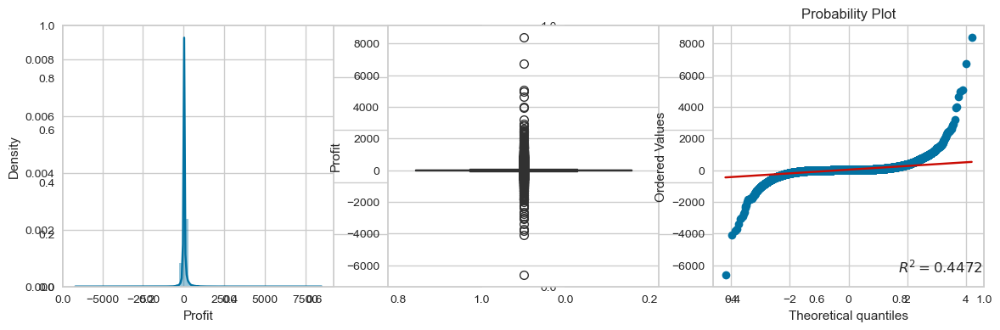

Skewness of Profit Margin: -2.370298465553514
Kurtosis of Profit Margin: 6.99118397712103


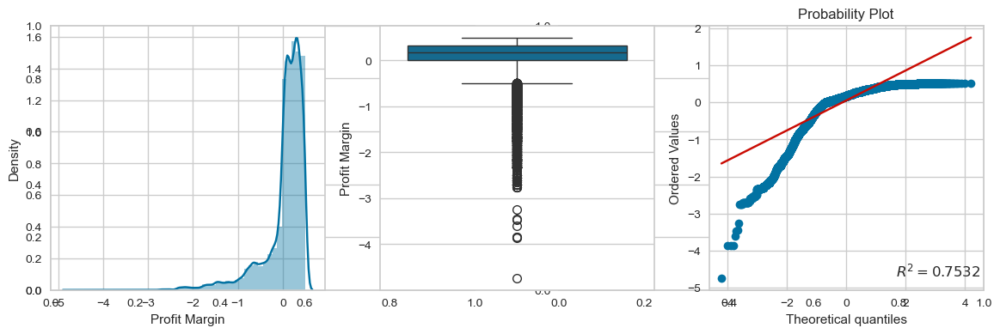

Skewness of Discounted Profit: 12.676777621144394
Kurtosis of Discounted Profit: 448.2863286301047


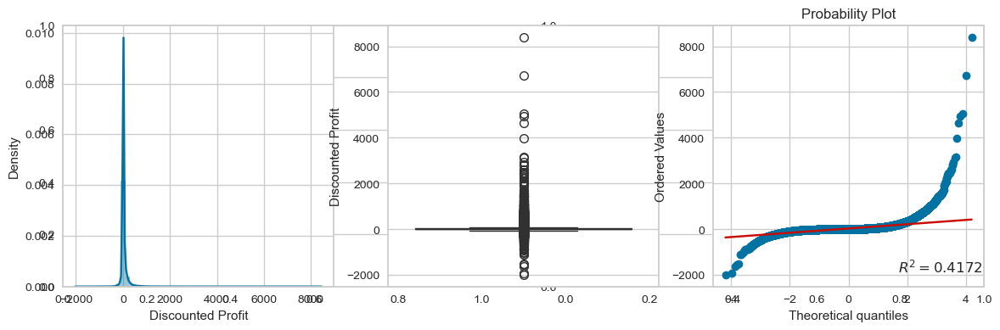

Skewness of Discount Percentage: 13.855421399667808
Kurtosis of Discount Percentage: 363.5798016284588


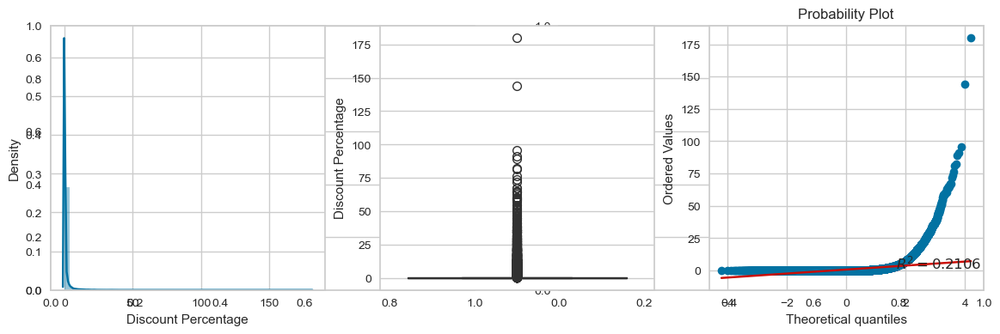

Skewness of Operating Expenses: 8.859361707124737
Kurtosis of Operating Expenses: 254.43260092488717


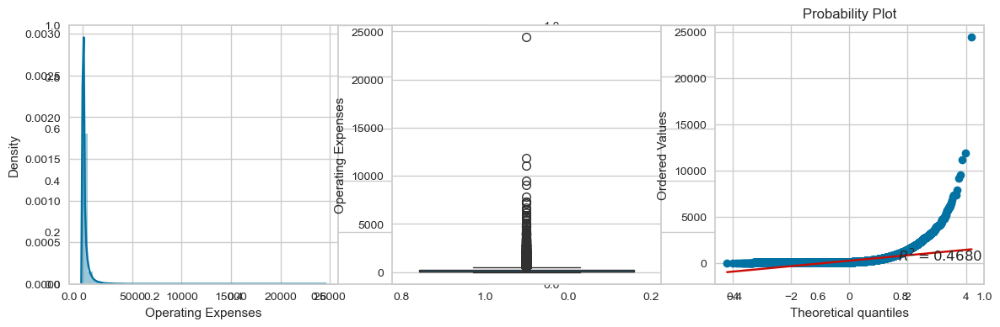

Skewness of Net Profit: 4.150931936245444
Kurtosis of Net Profit: 291.0222014725164


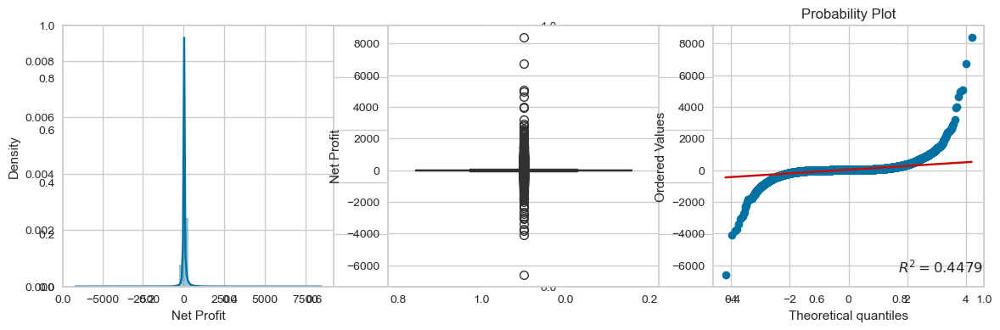

Skewness of Order Day: -0.3526160023973776
Kurtosis of Order Day: -0.97069853761661


posx and posy should be finite values
posx and posy should be finite values


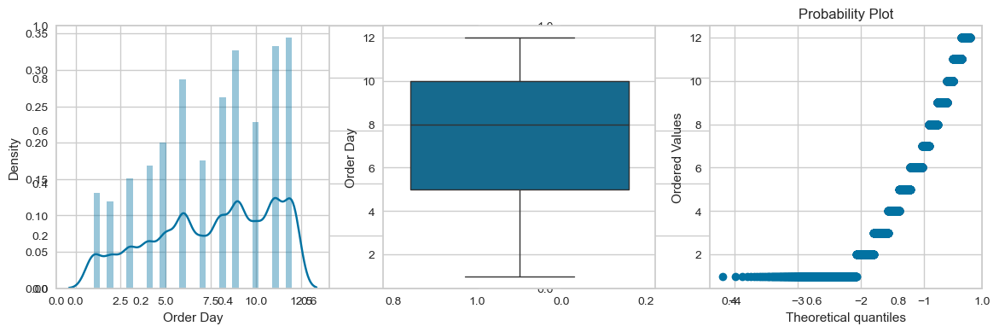

Skewness of Order Weekday: 0.010770786843308514
Kurtosis of Order Weekday: -1.2474768634981115


posx and posy should be finite values
posx and posy should be finite values


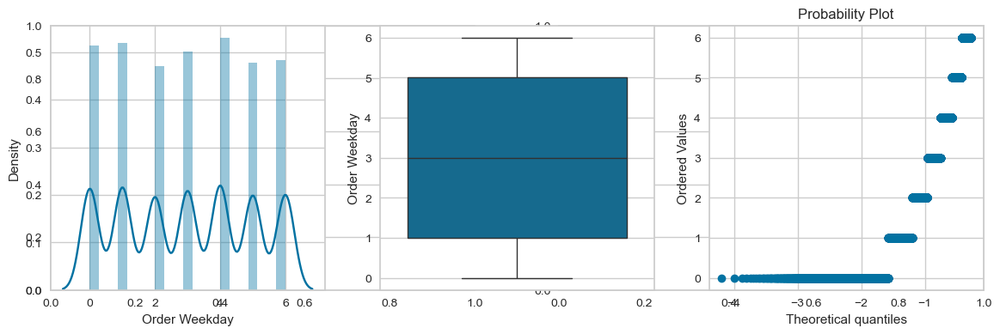

Skewness of Order Month: 0.0002613394256578971
Kurtosis of Order Month: -1.2269190070890565


posx and posy should be finite values
posx and posy should be finite values


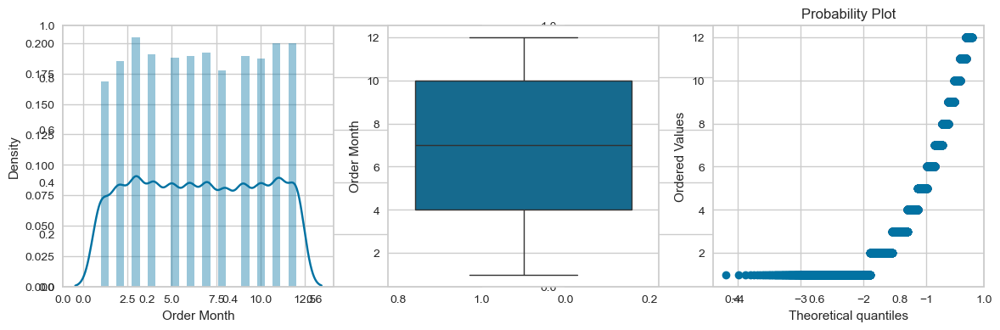

Skewness of Ship Day: -0.34763081258885303
Kurtosis of Ship Day: -1.0221924448978186


posx and posy should be finite values
posx and posy should be finite values


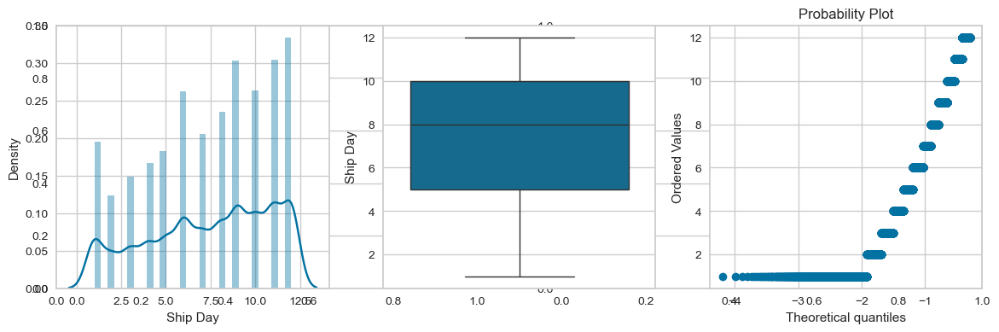

In [57]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [58]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect()

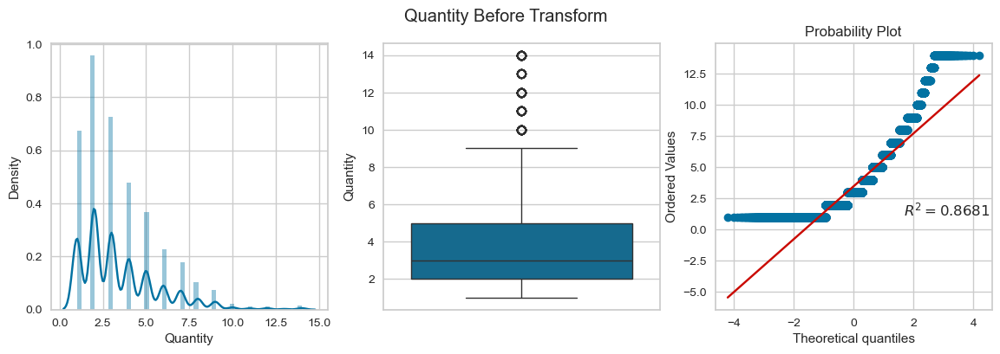

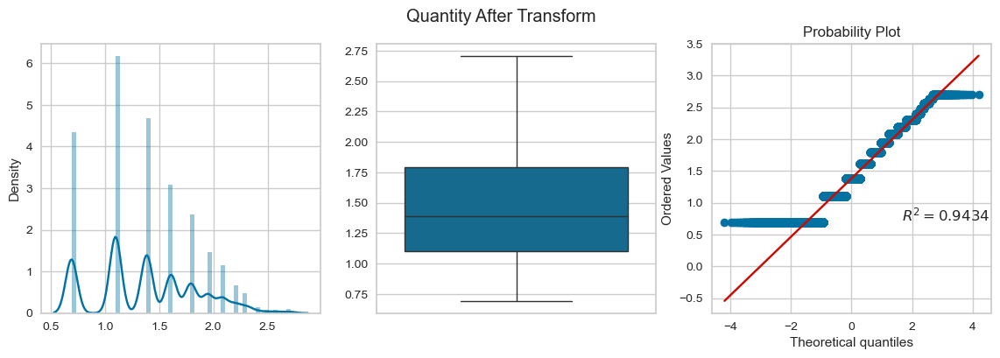

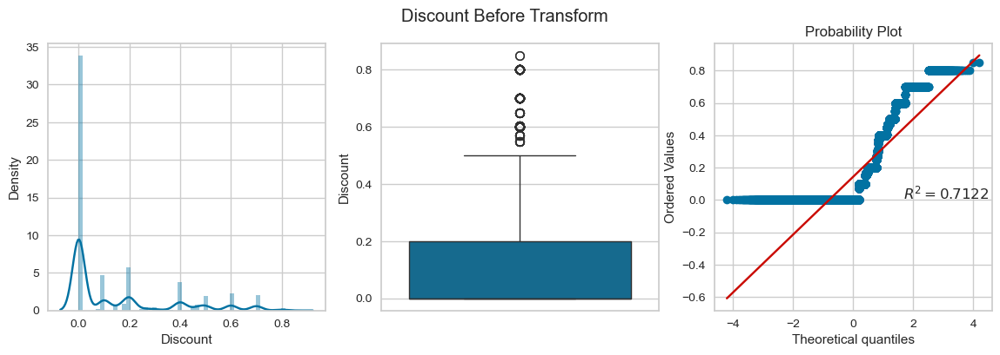

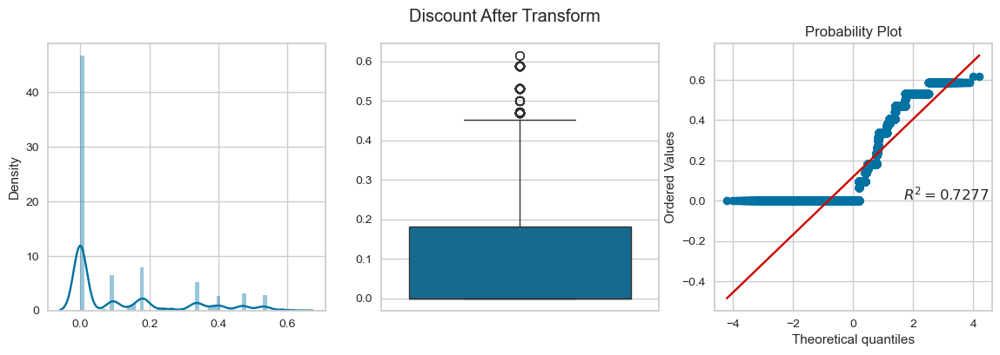

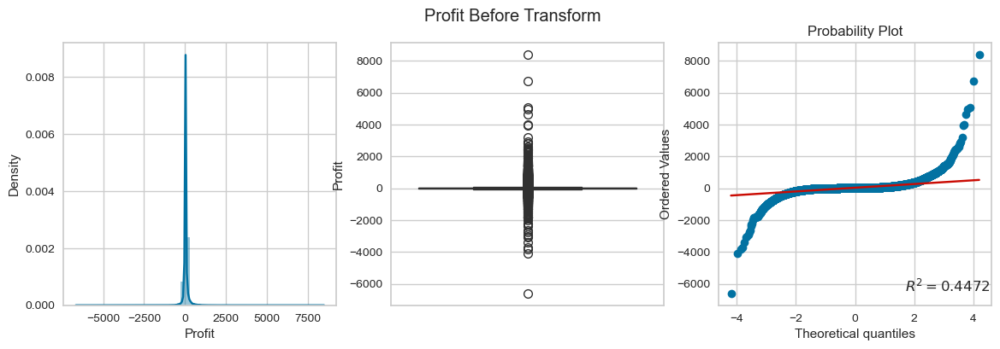

...

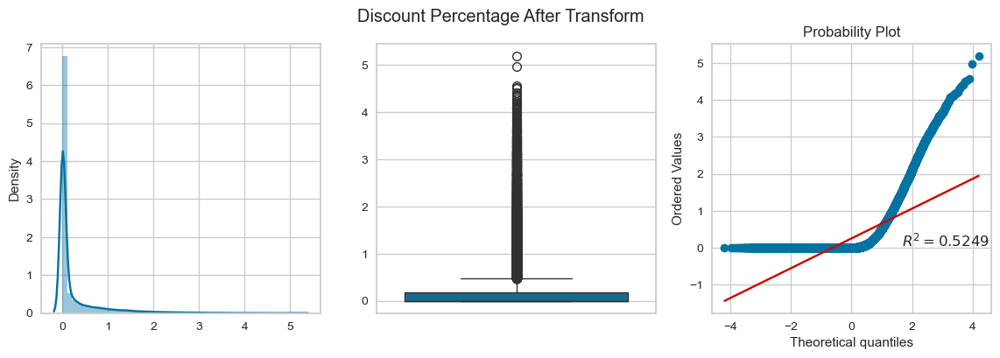

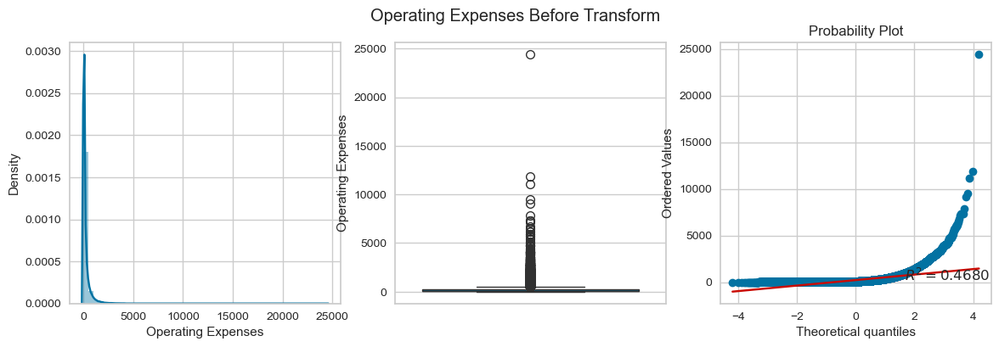

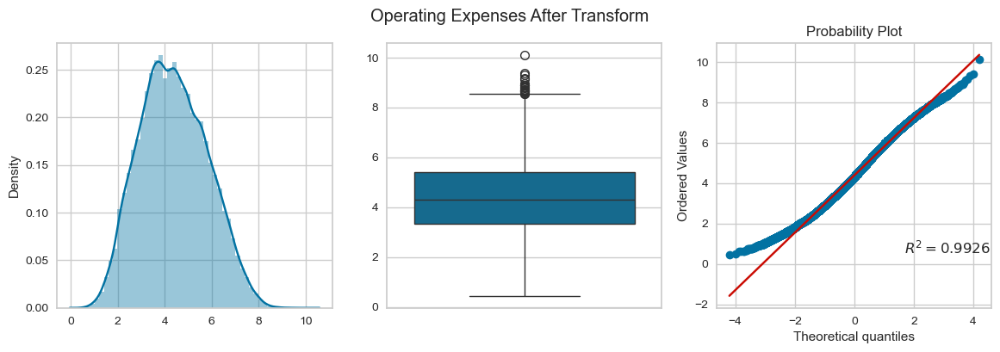

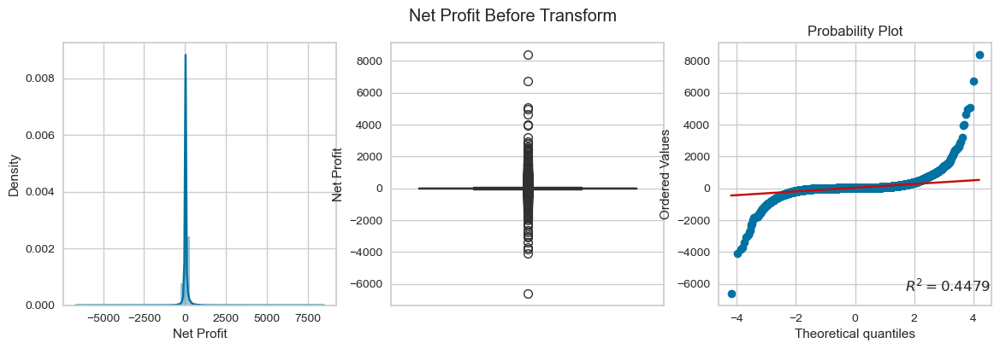

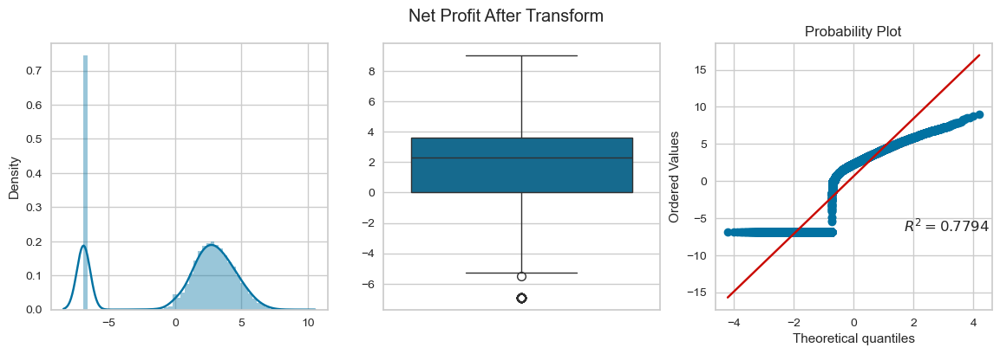

posx and posy should be finite values
posx and posy should be finite values


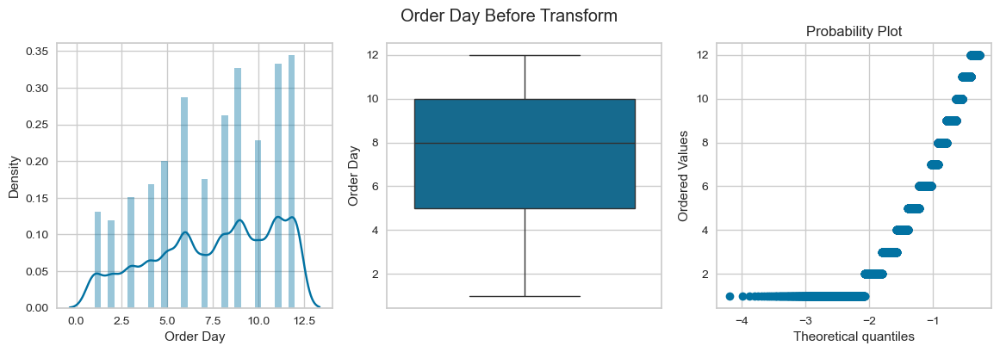

posx and posy should be finite values
posx and posy should be finite values


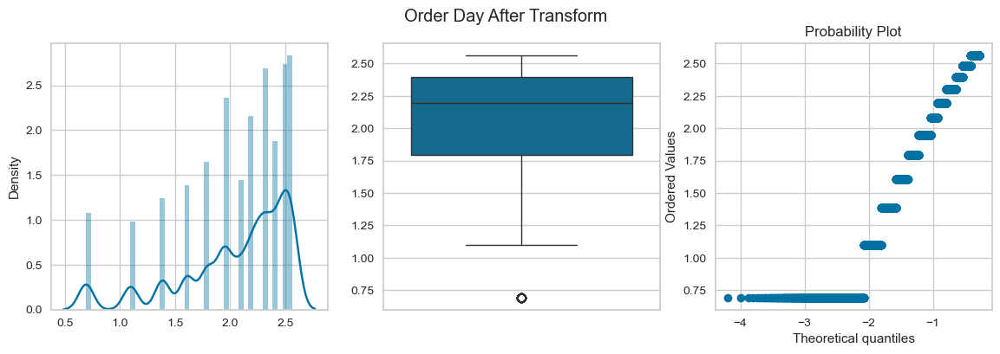

posx and posy should be finite values
posx and posy should be finite values


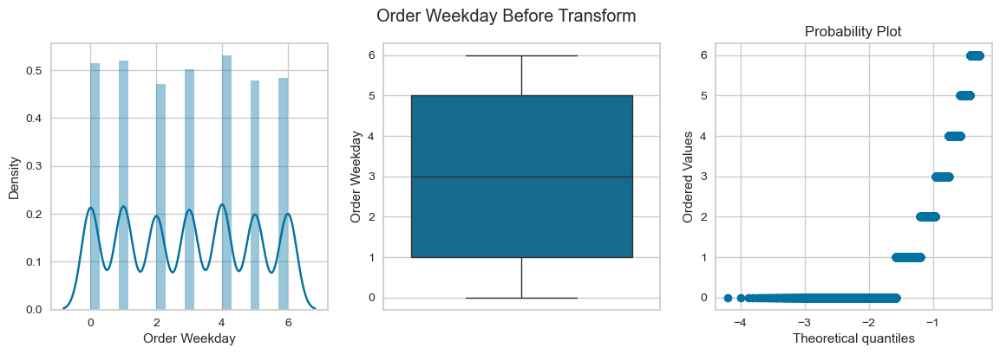

posx and posy should be finite values
posx and posy should be finite values


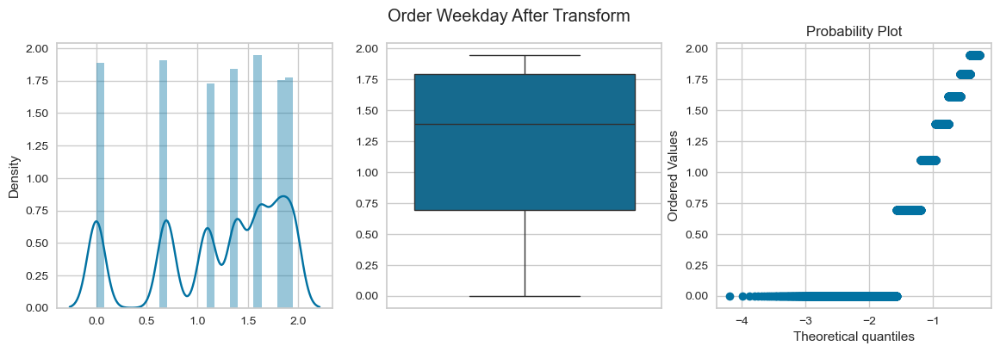

posx and posy should be finite values
posx and posy should be finite values


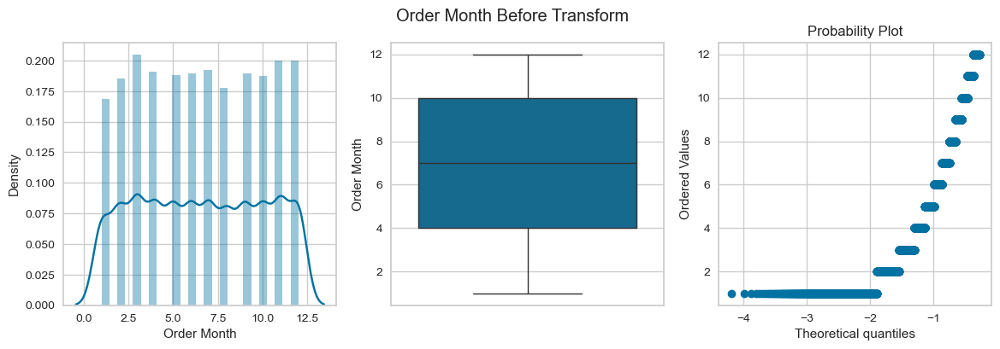

posx and posy should be finite values
posx and posy should be finite values


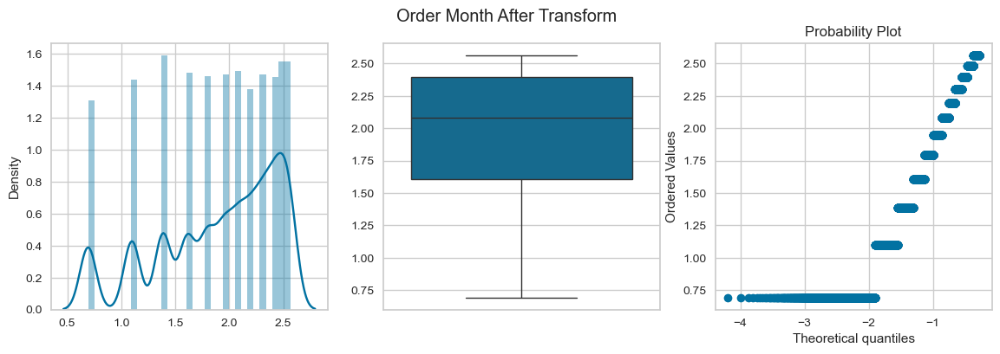

posx and posy should be finite values
posx and posy should be finite values


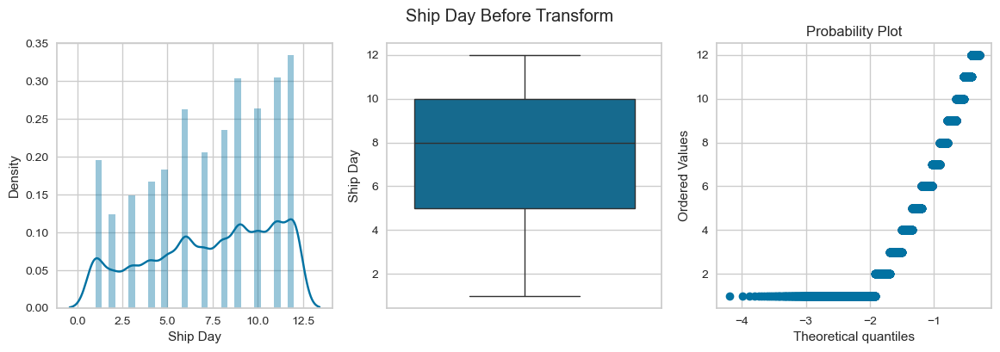

posx and posy should be finite values
posx and posy should be finite values


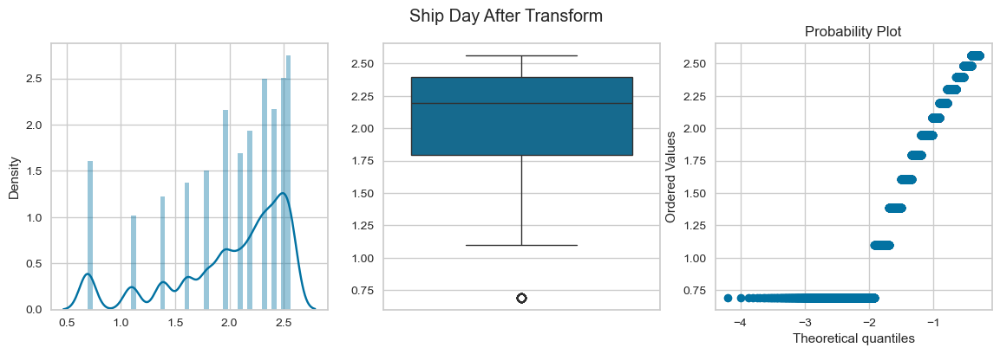

In [59]:
for col in skewed_cols:
    apply_transform(df, col, FunctionTransformer(lambda x: np.log1p(np.clip(x, a_min=-0.999, a_max=None))))

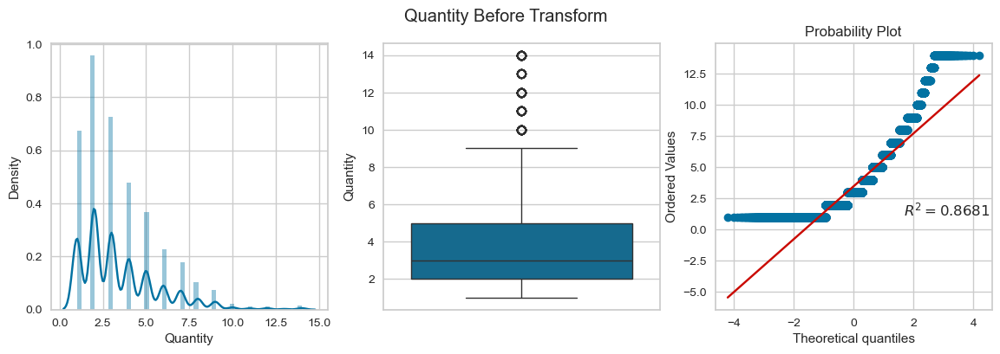

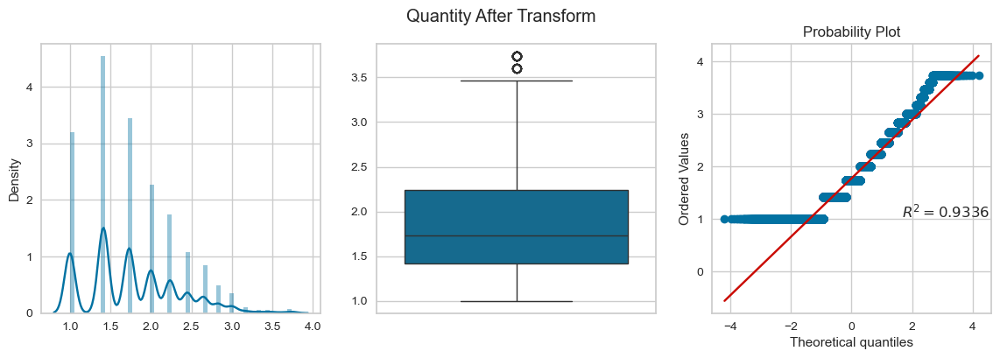

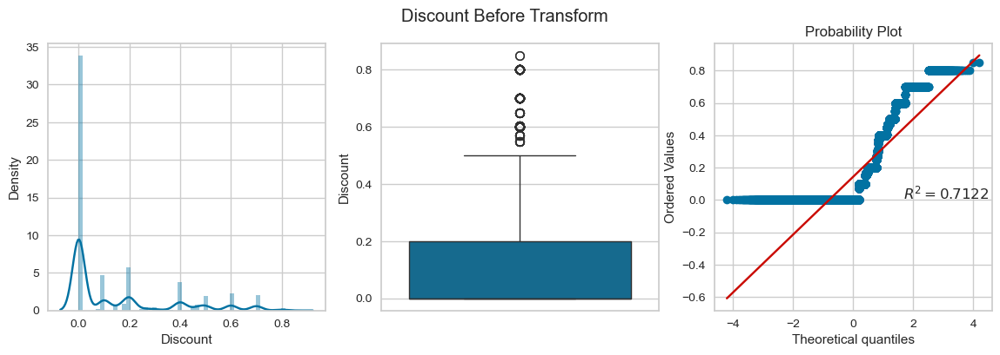

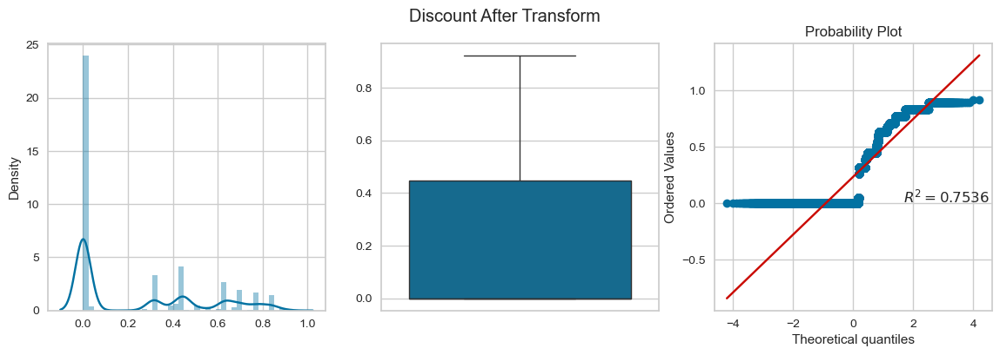

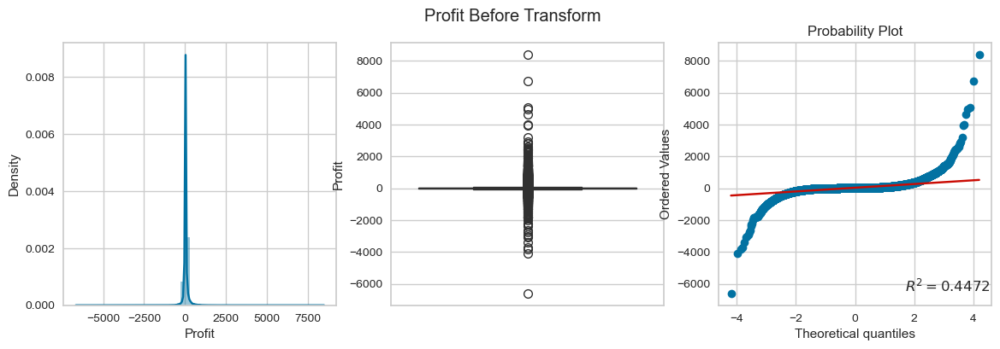

posx and posy should be finite values
posx and posy should be finite values


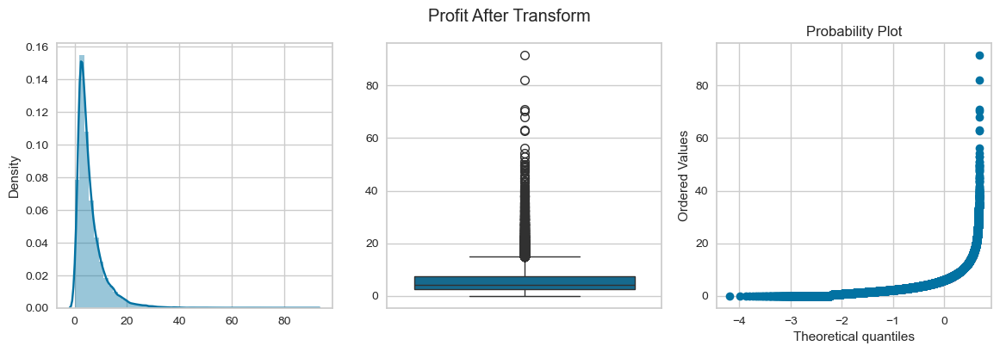

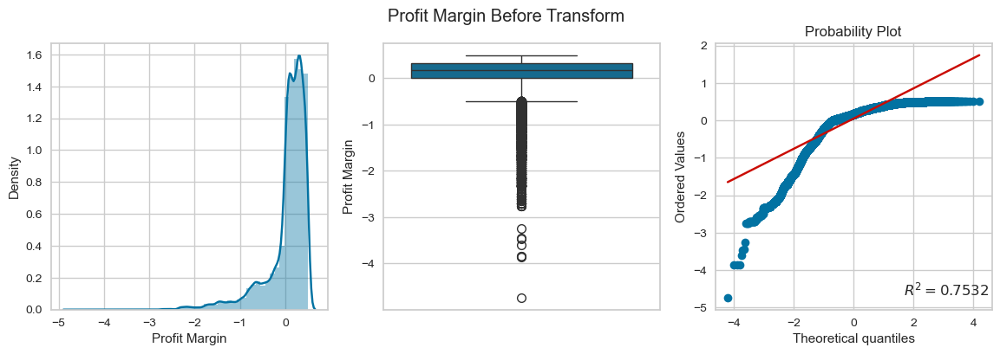

posx and posy should be finite values
posx and posy should be finite values


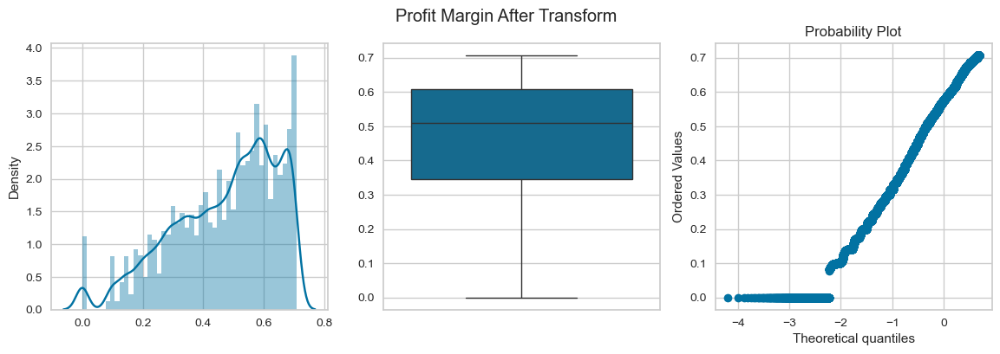

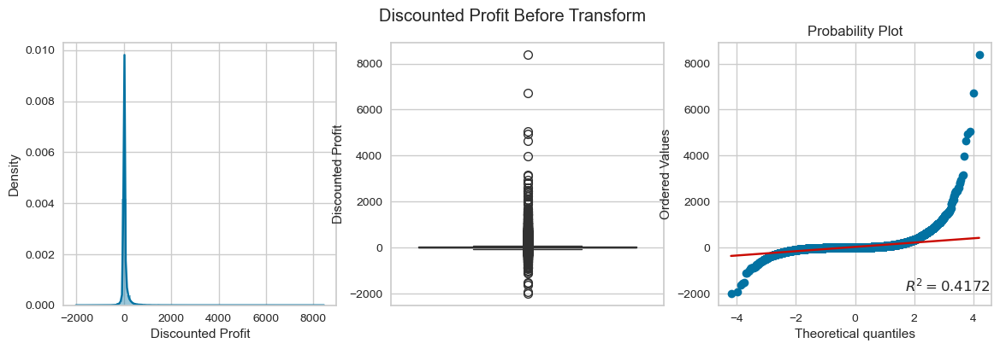

posx and posy should be finite values
posx and posy should be finite values


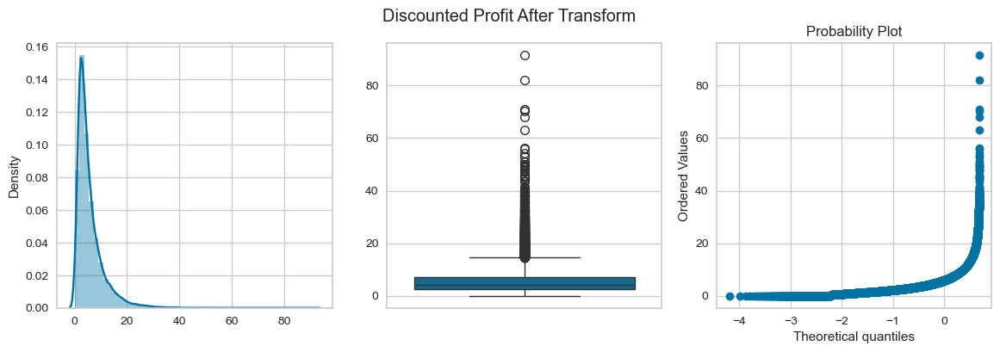

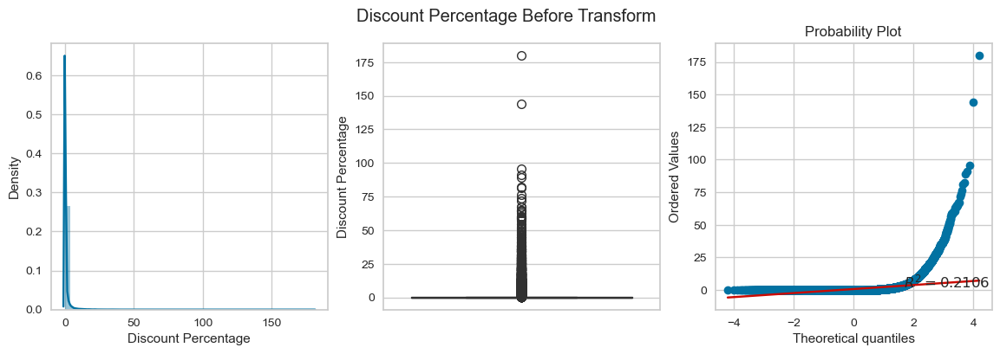

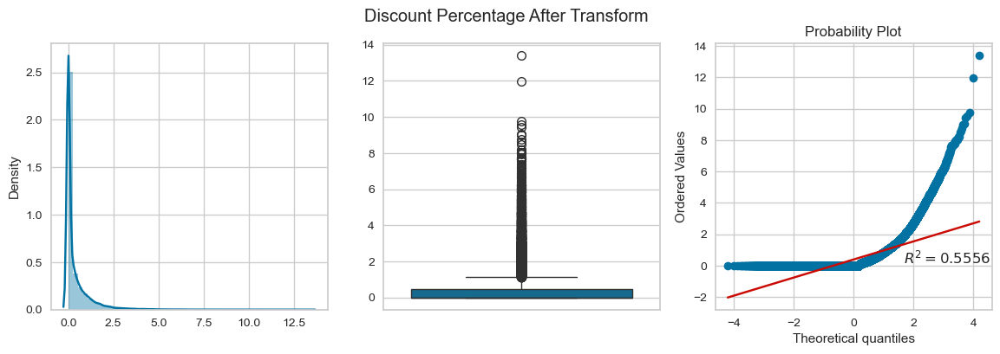

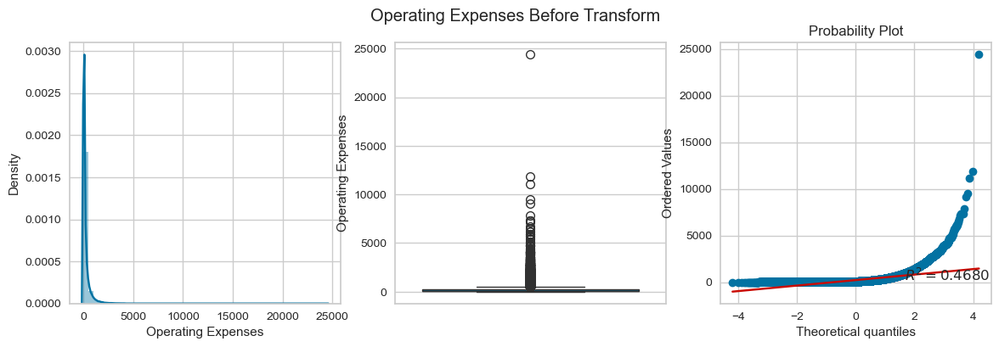

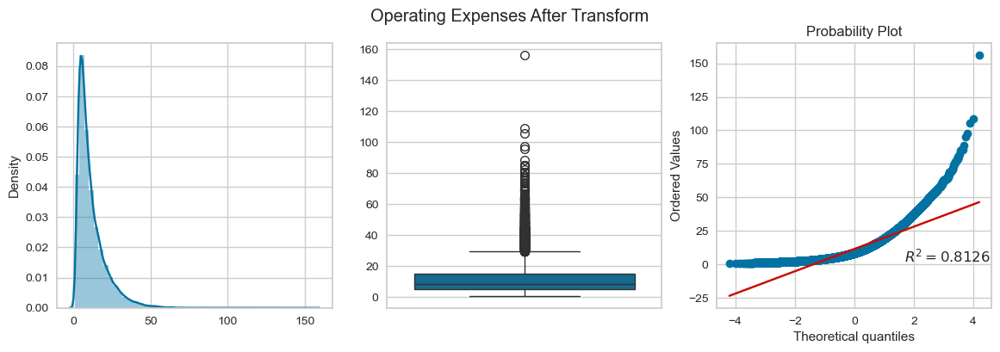

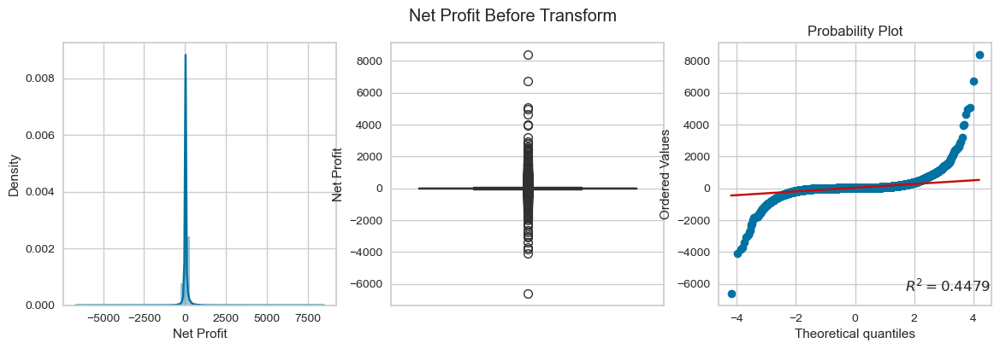

posx and posy should be finite values
posx and posy should be finite values


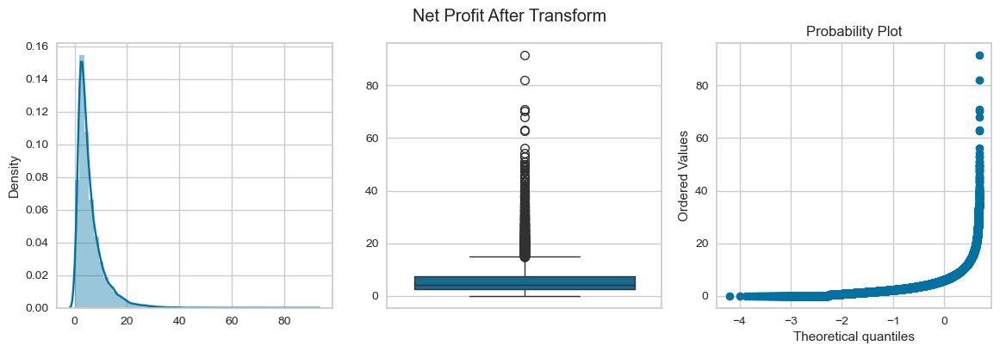

posx and posy should be finite values
posx and posy should be finite values


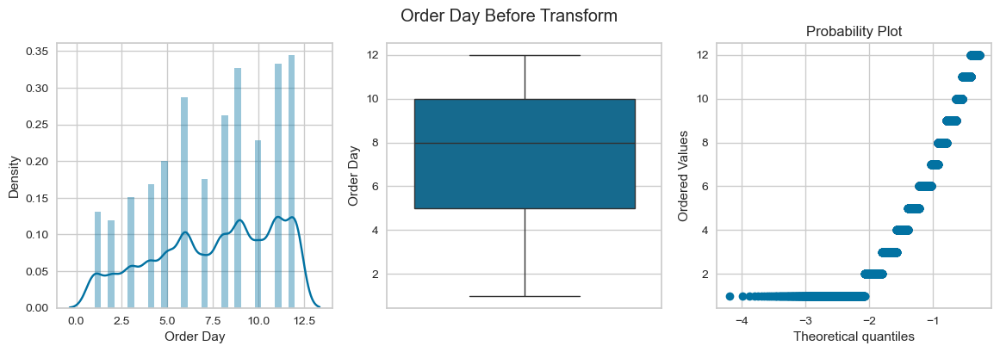

posx and posy should be finite values
posx and posy should be finite values


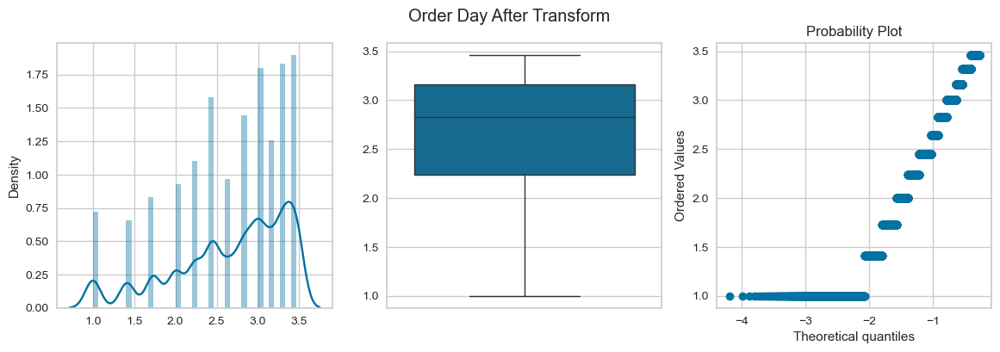

posx and posy should be finite values
posx and posy should be finite values


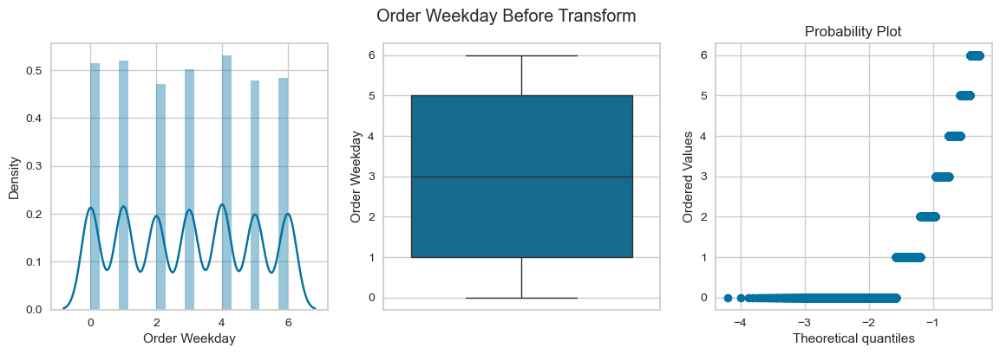

posx and posy should be finite values
posx and posy should be finite values


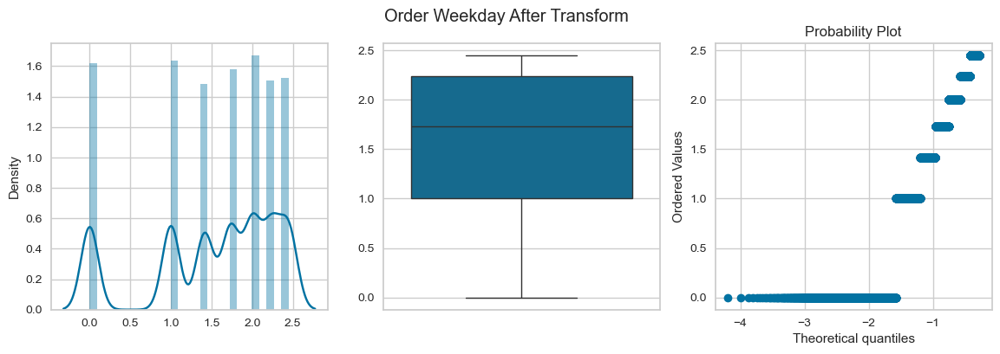

posx and posy should be finite values
posx and posy should be finite values


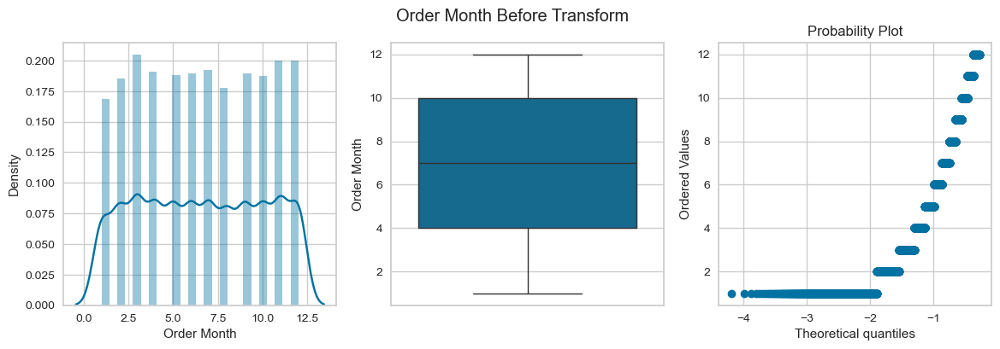

posx and posy should be finite values
posx and posy should be finite values


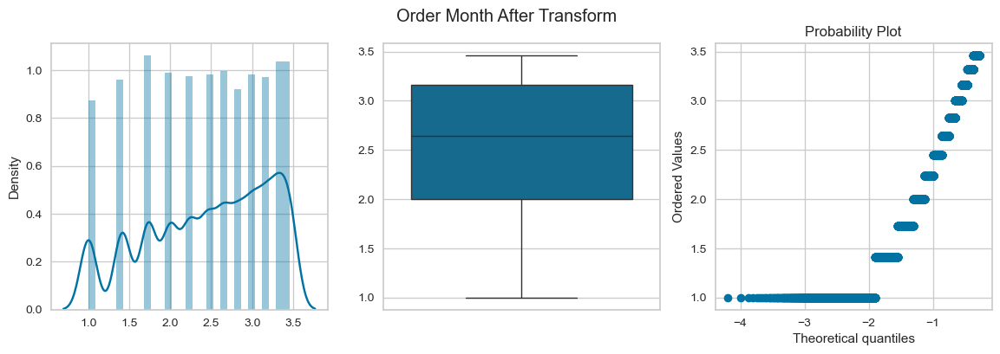

posx and posy should be finite values
posx and posy should be finite values


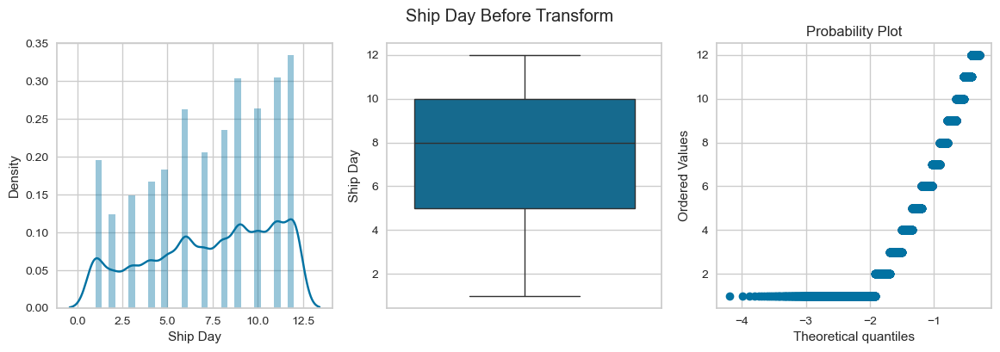

posx and posy should be finite values
posx and posy should be finite values


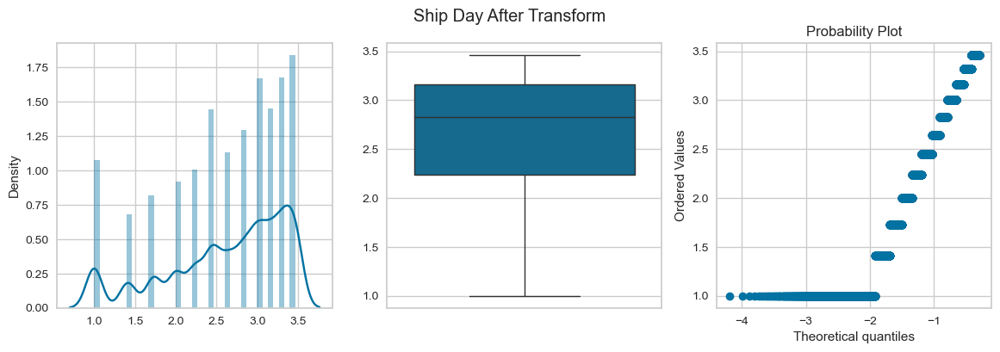

In [60]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

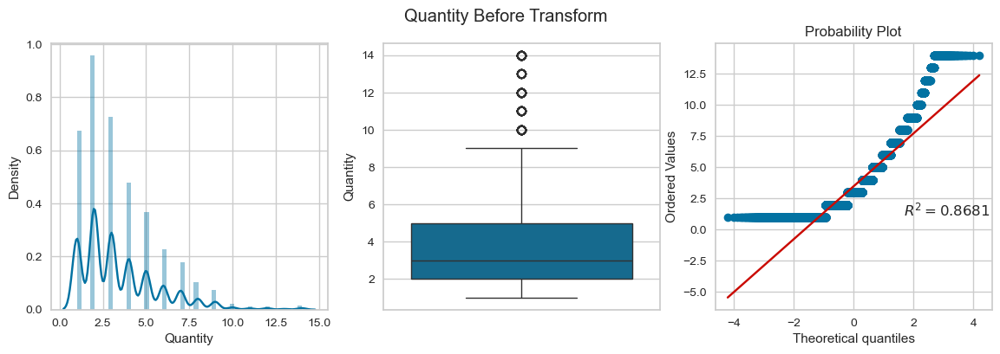

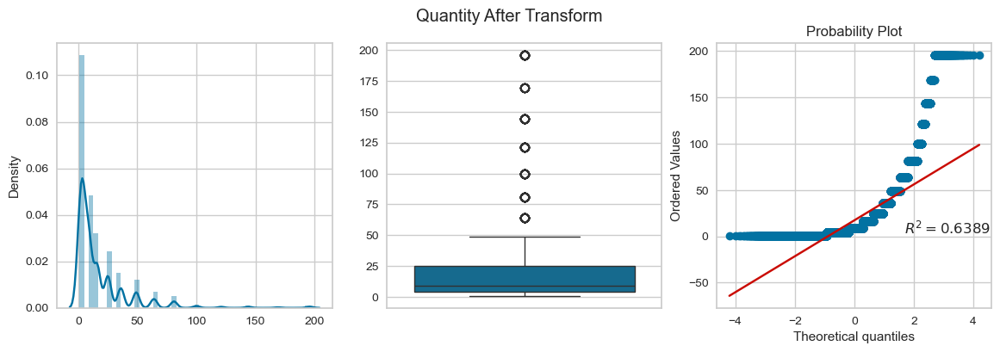

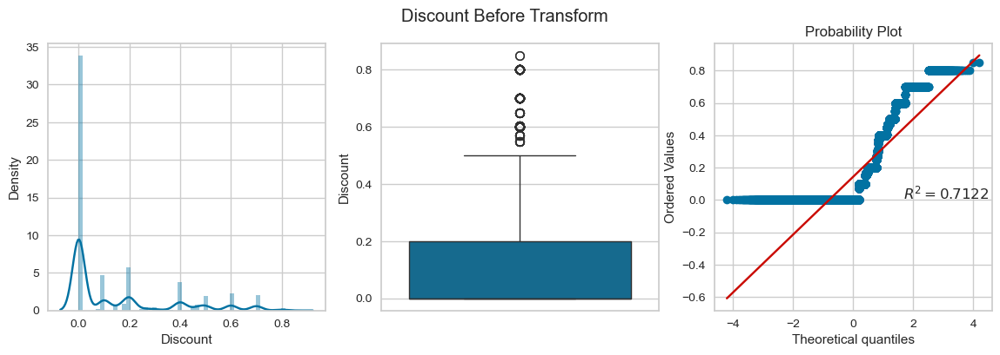

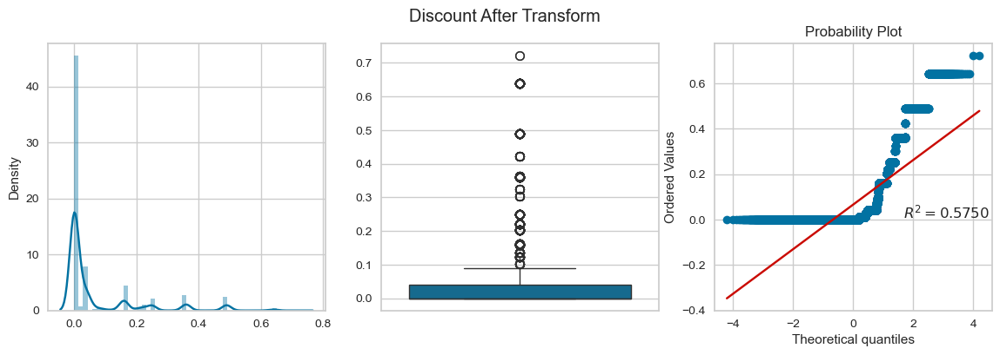

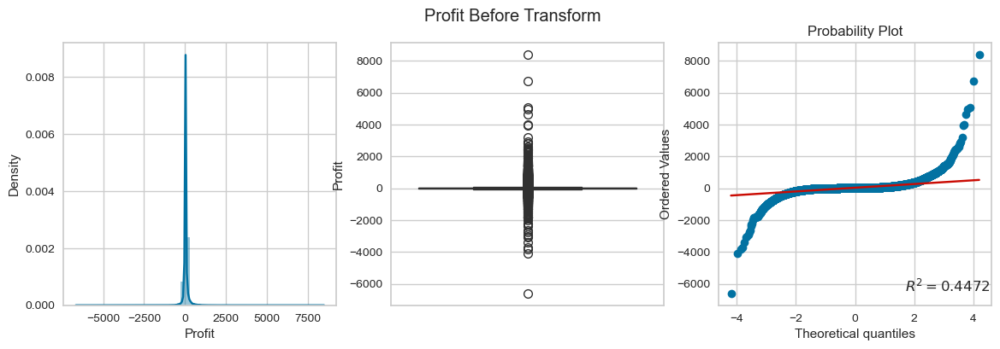

...

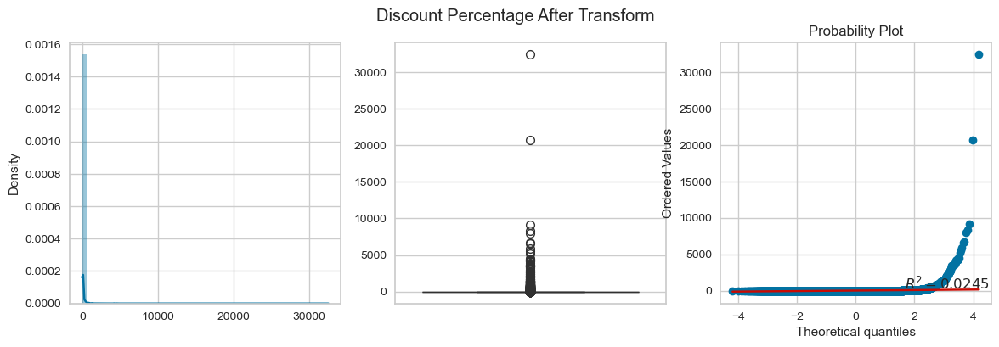

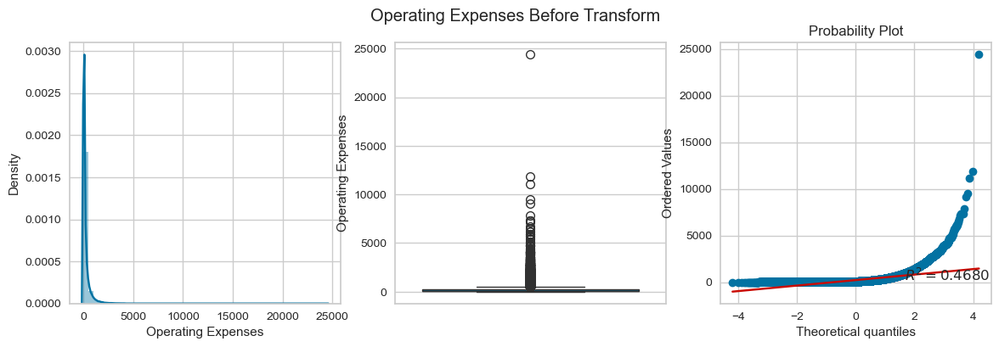

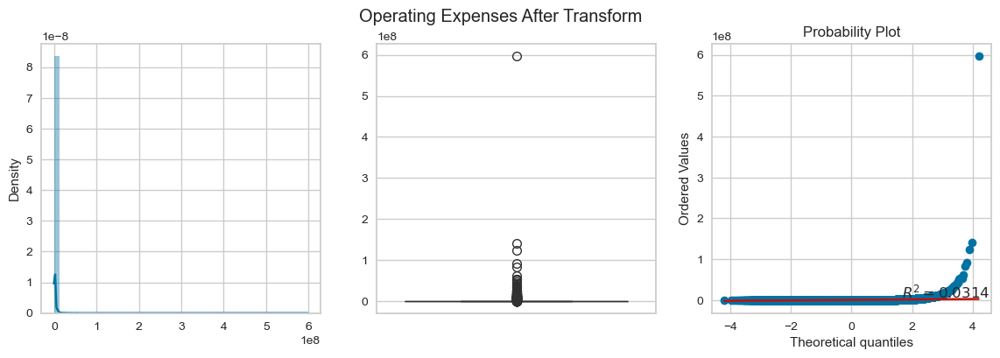

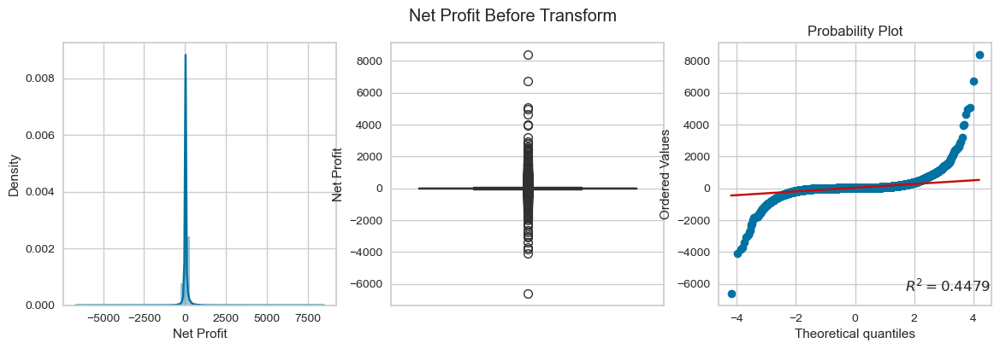

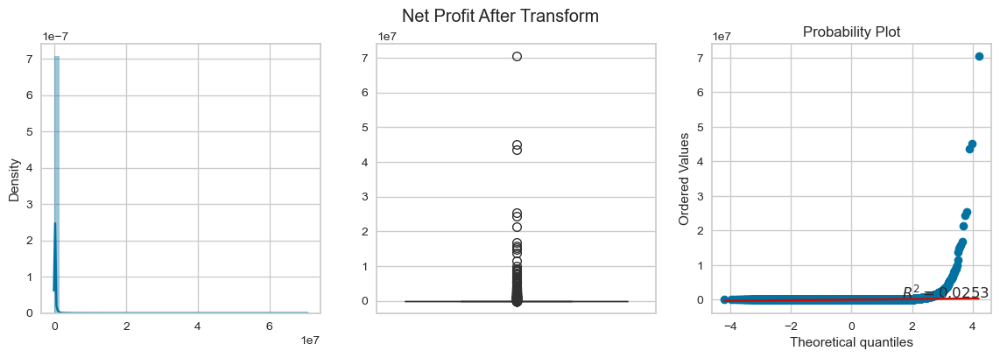

posx and posy should be finite values
posx and posy should be finite values


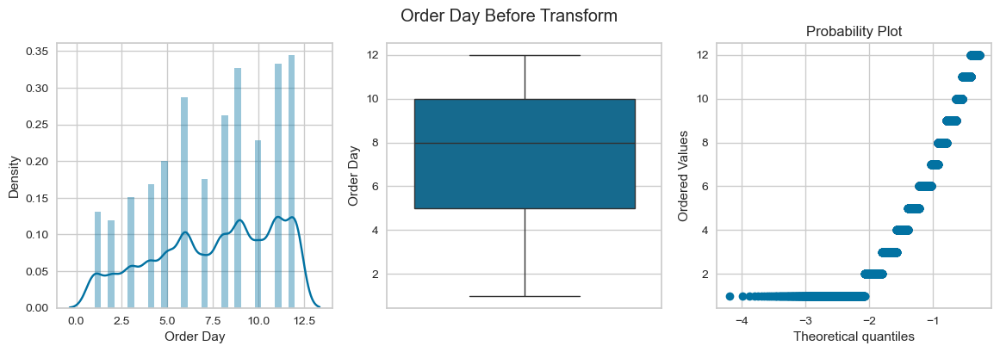

posx and posy should be finite values
posx and posy should be finite values


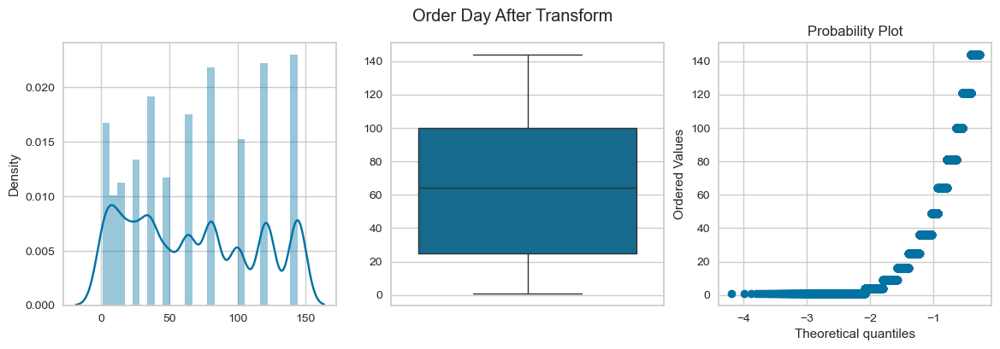

posx and posy should be finite values
posx and posy should be finite values


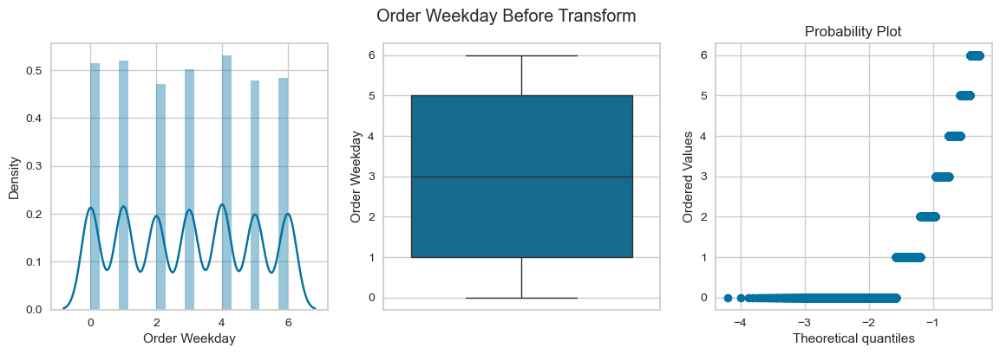

posx and posy should be finite values
posx and posy should be finite values


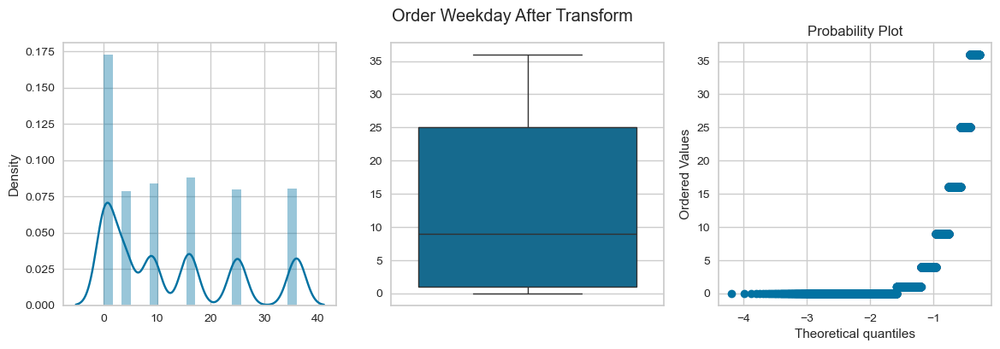

posx and posy should be finite values
posx and posy should be finite values


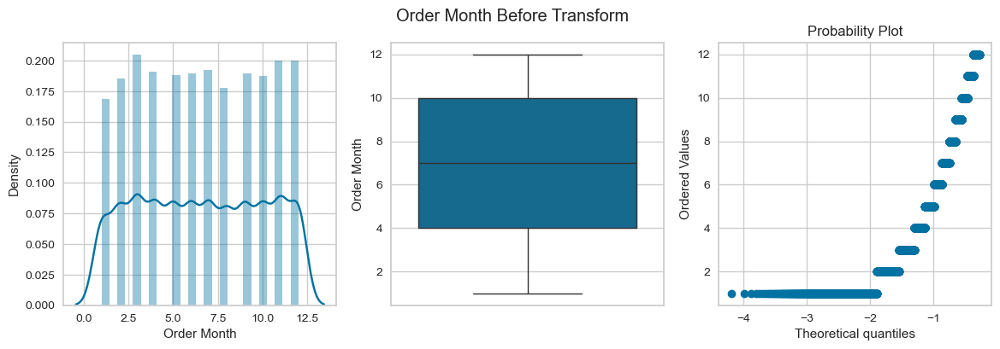

posx and posy should be finite values
posx and posy should be finite values


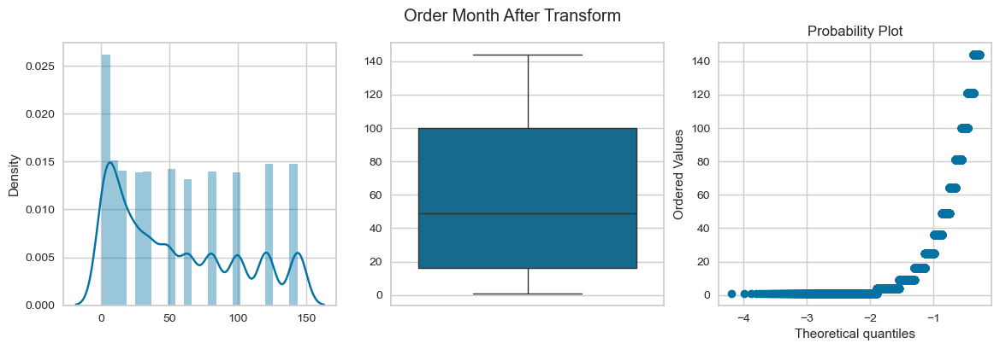

posx and posy should be finite values
posx and posy should be finite values


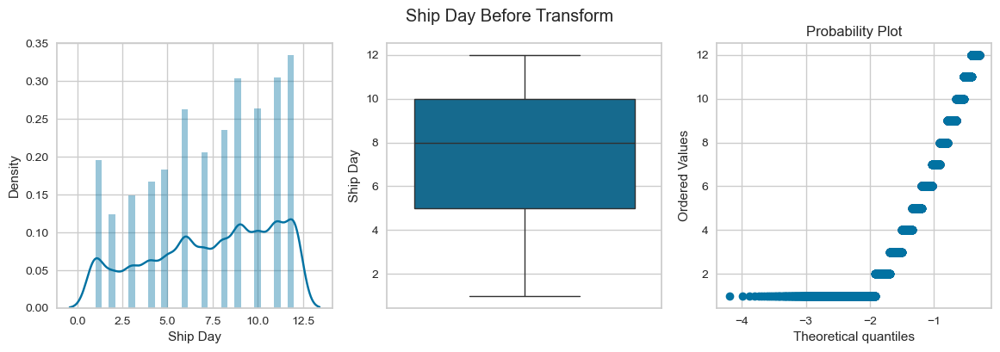

posx and posy should be finite values
posx and posy should be finite values


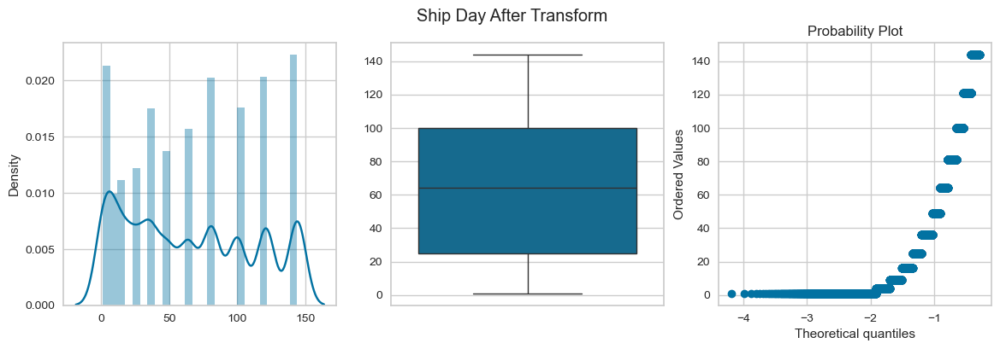

In [61]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

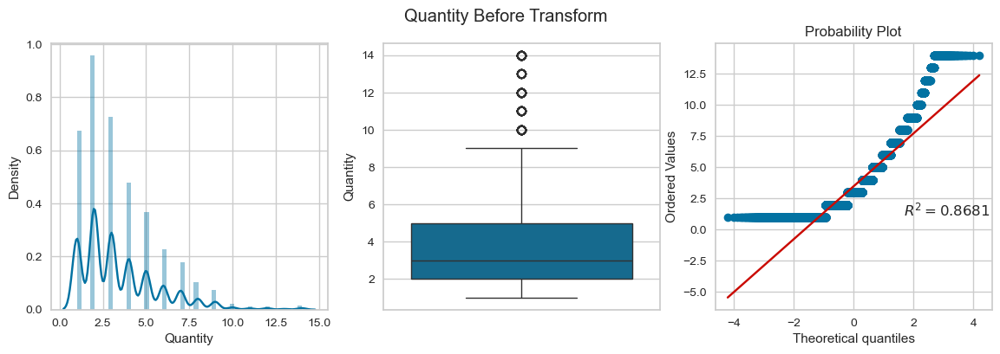

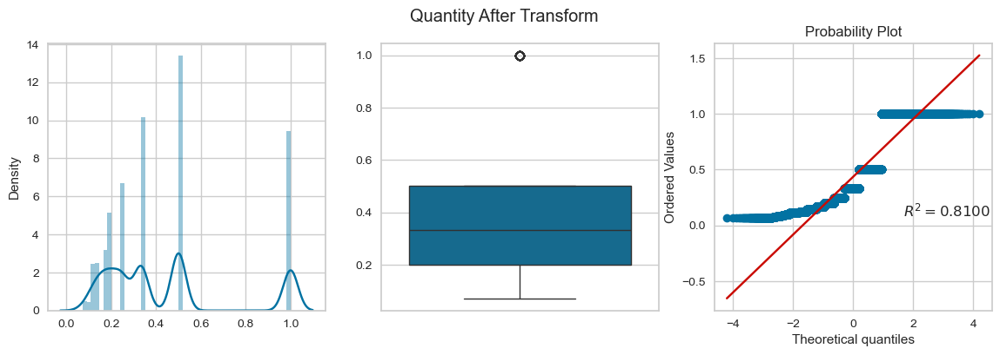

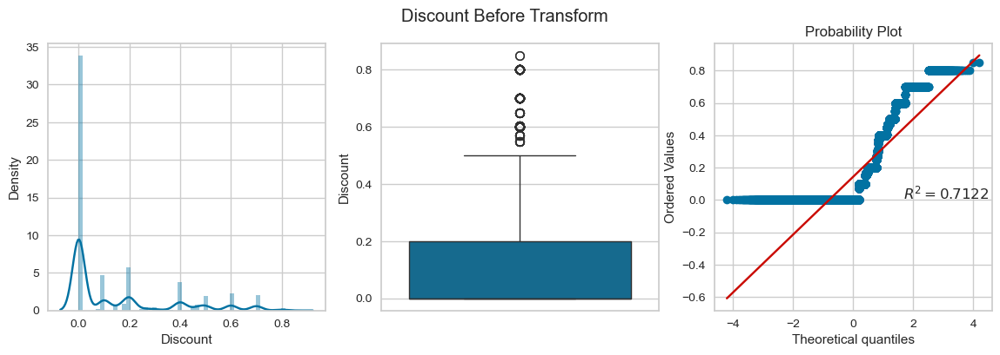

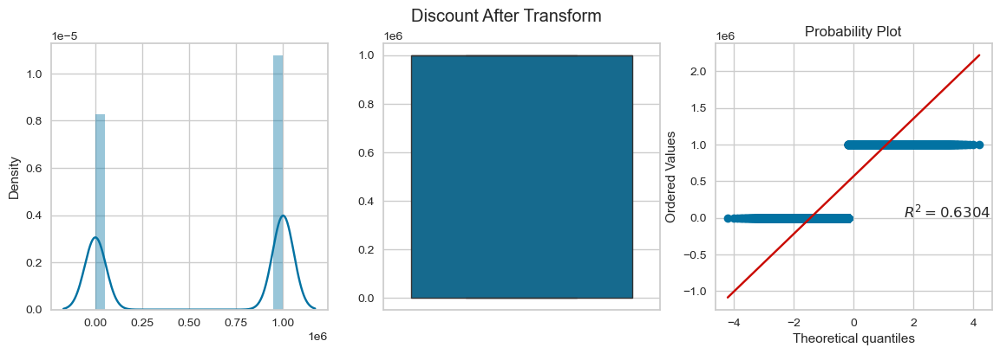

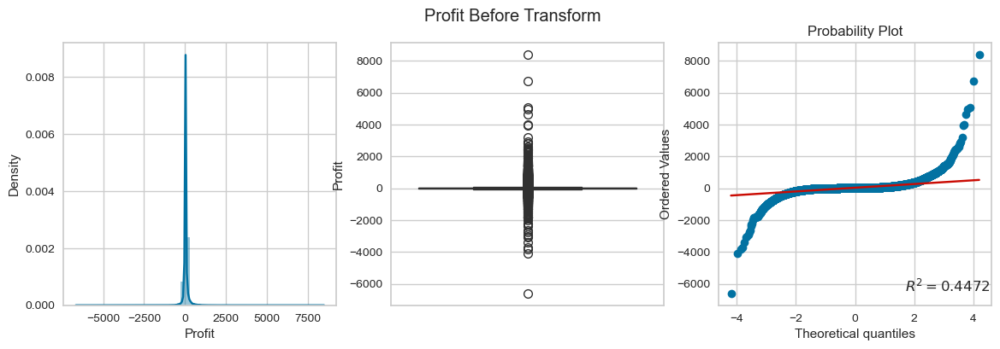

...

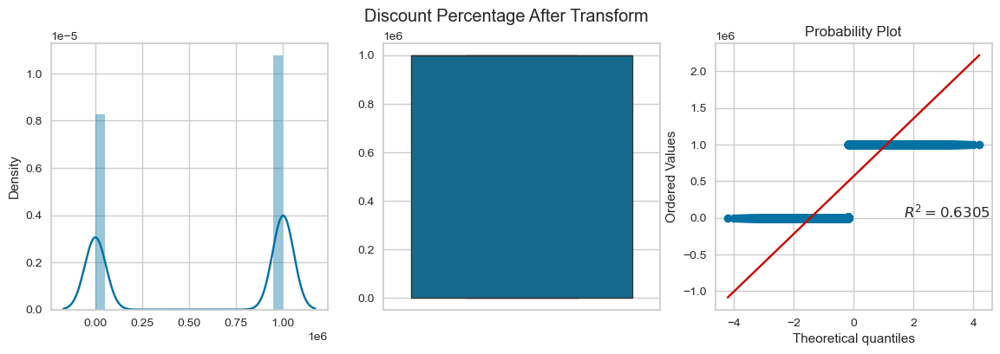

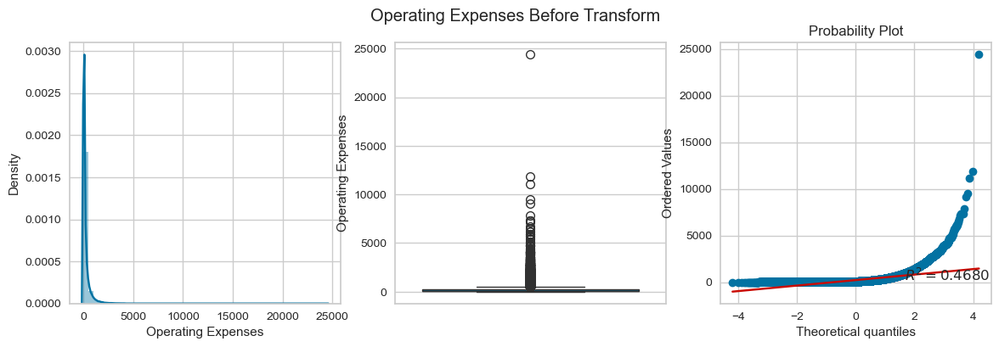

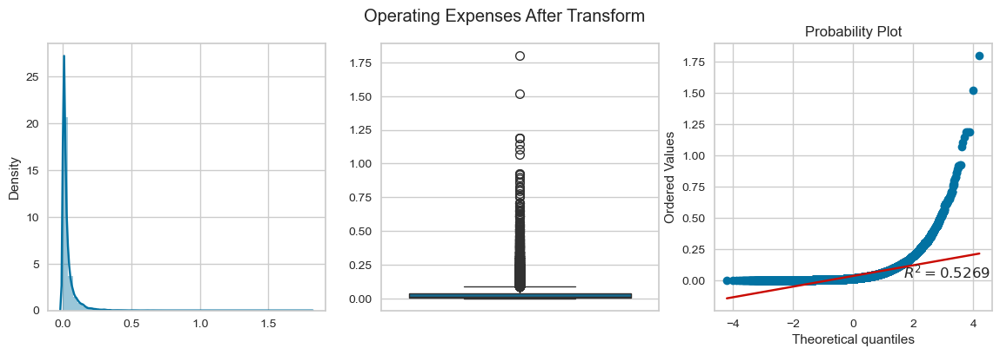

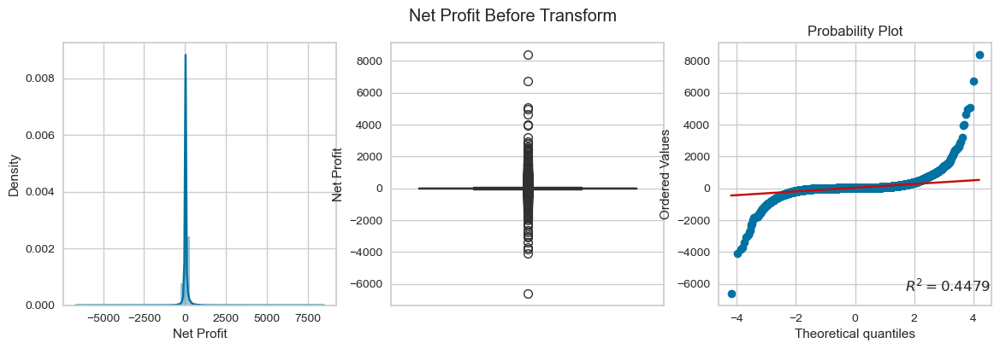

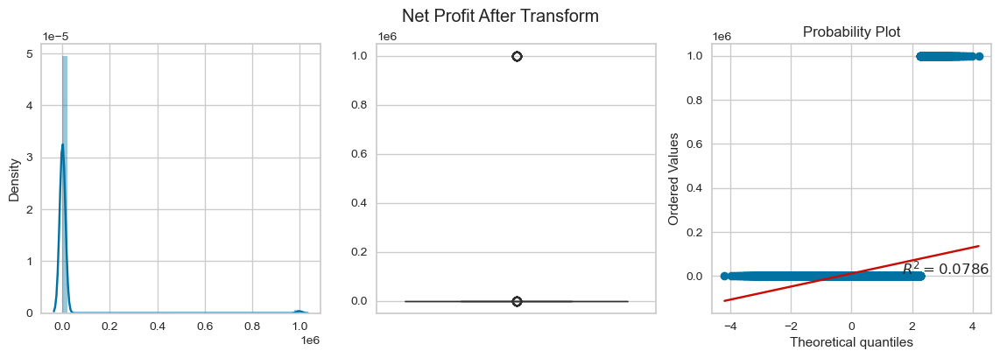

posx and posy should be finite values
posx and posy should be finite values


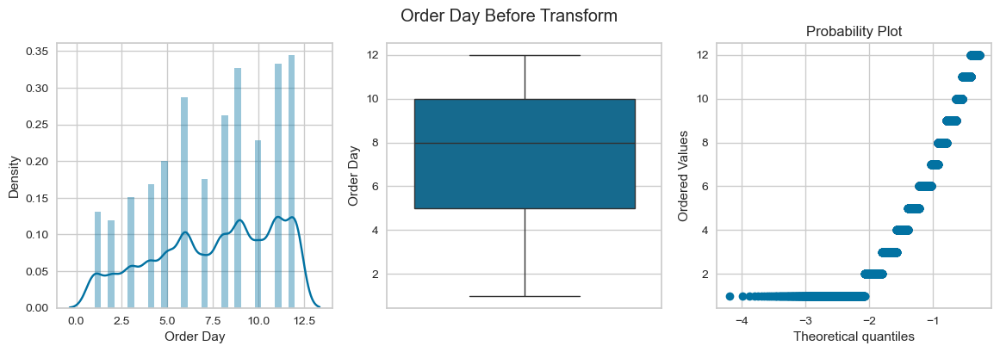

posx and posy should be finite values
posx and posy should be finite values


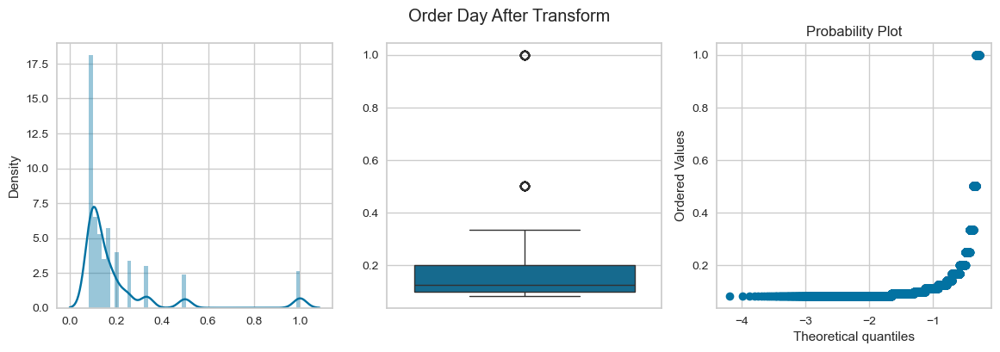

posx and posy should be finite values
posx and posy should be finite values


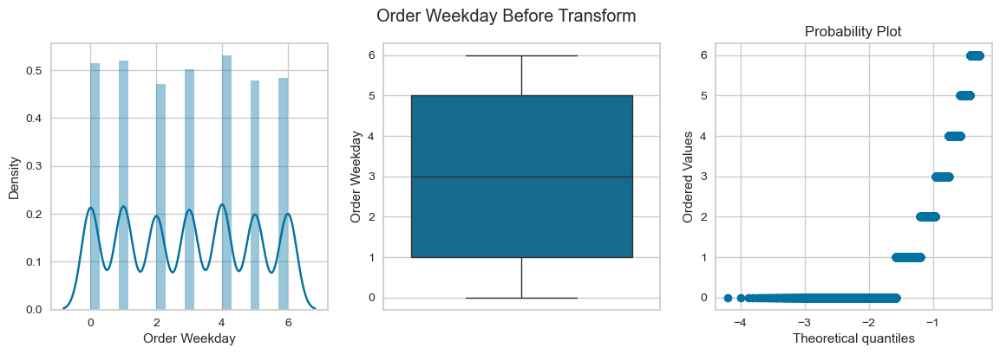

posx and posy should be finite values
posx and posy should be finite values


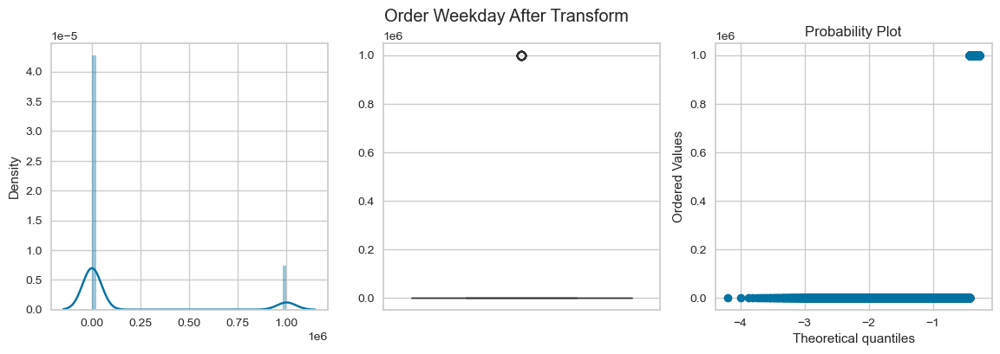

posx and posy should be finite values
posx and posy should be finite values


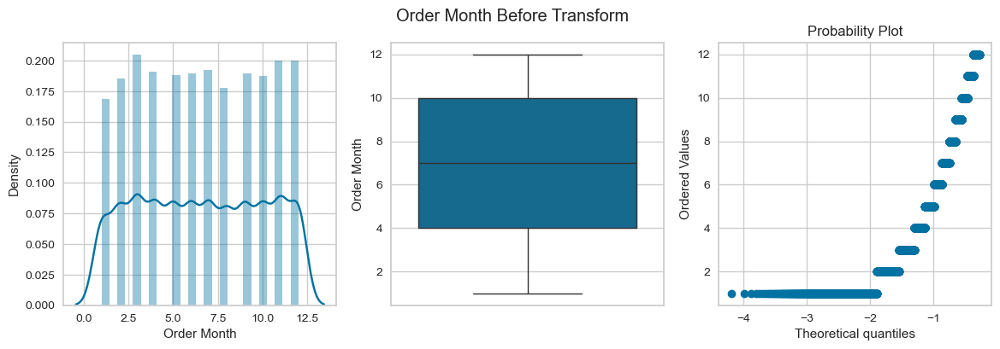

posx and posy should be finite values
posx and posy should be finite values


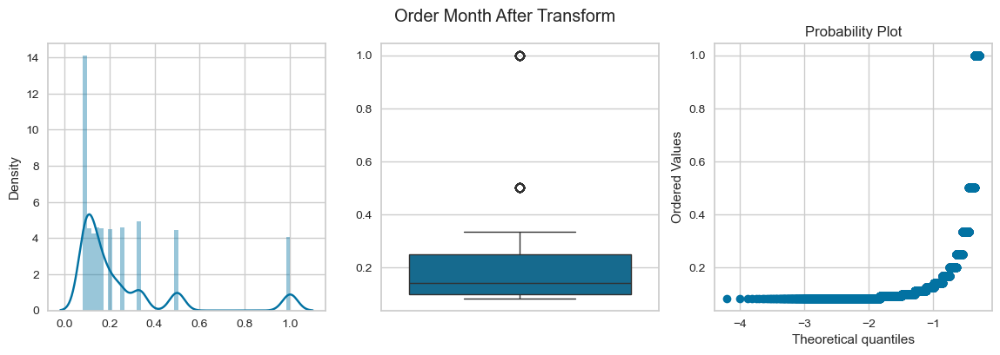

posx and posy should be finite values
posx and posy should be finite values


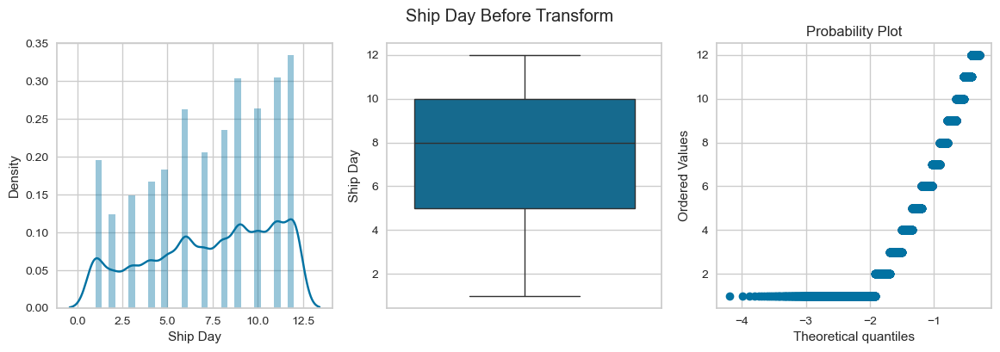

posx and posy should be finite values
posx and posy should be finite values


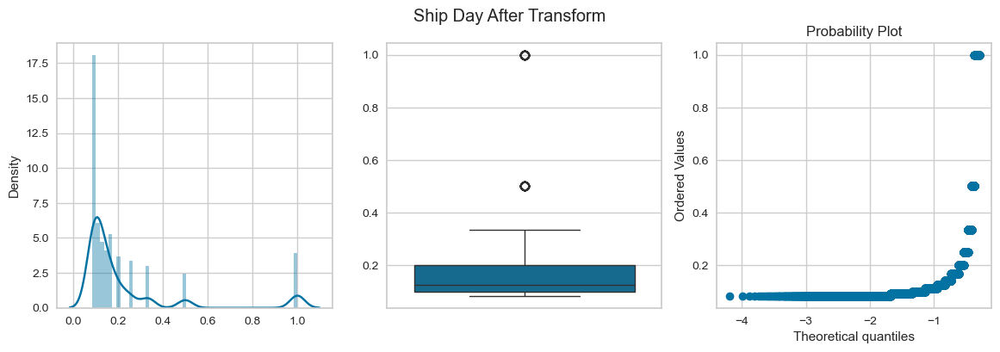

In [62]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

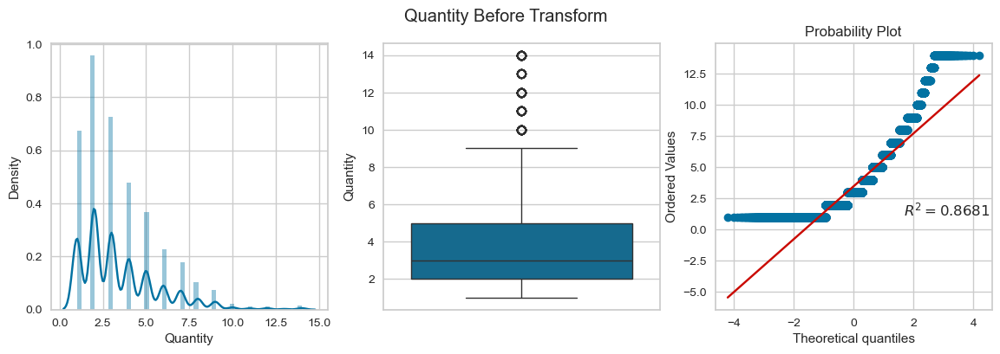

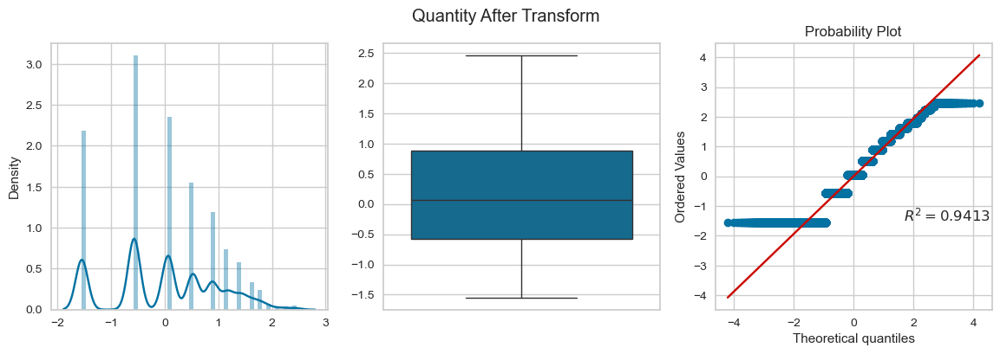

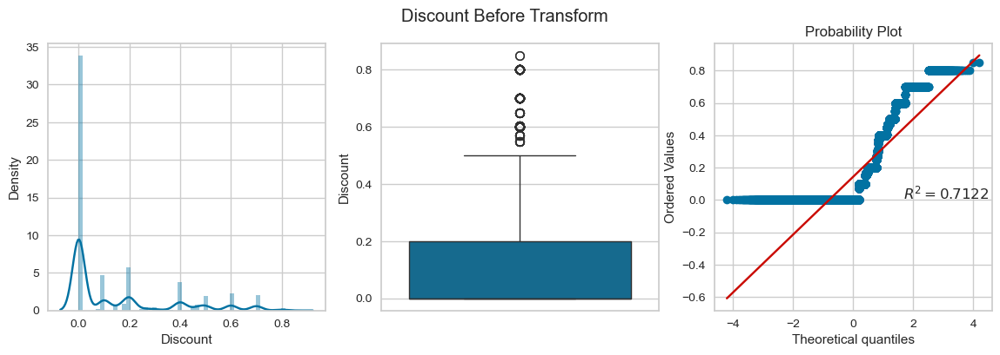

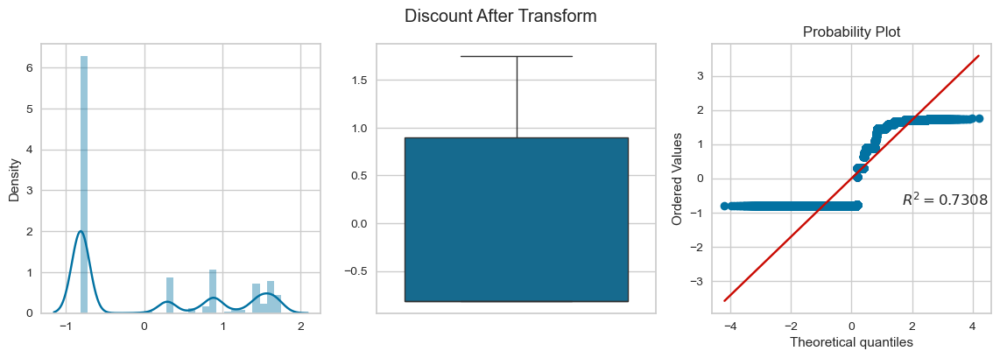

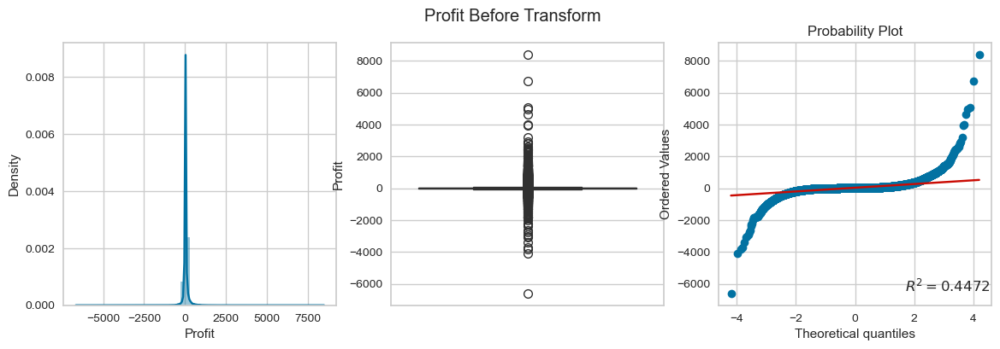

...

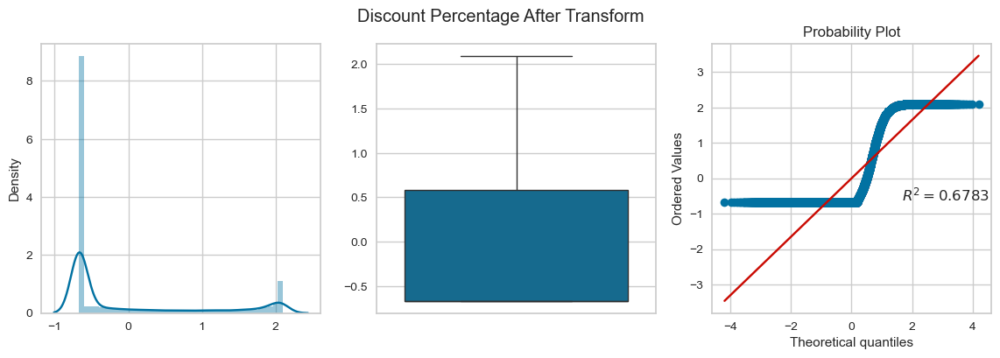

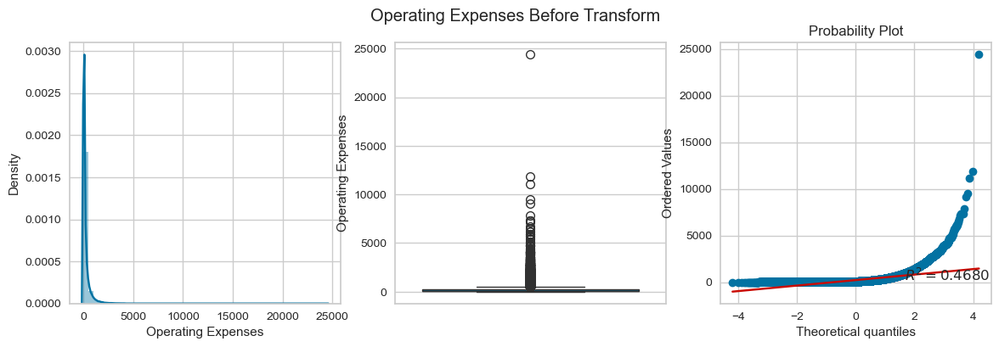

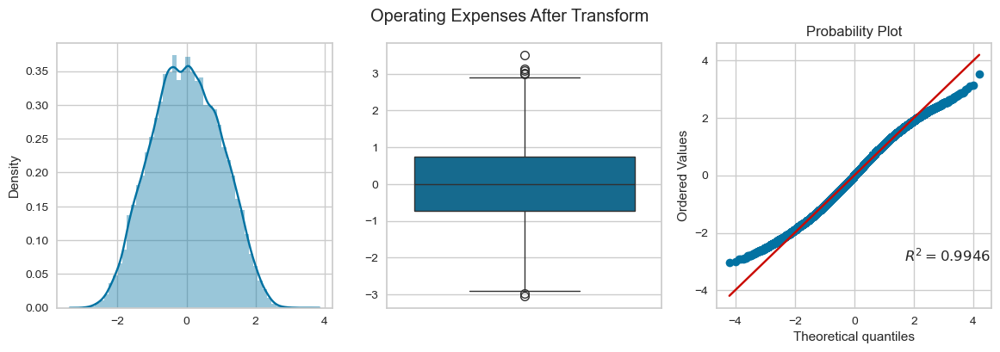

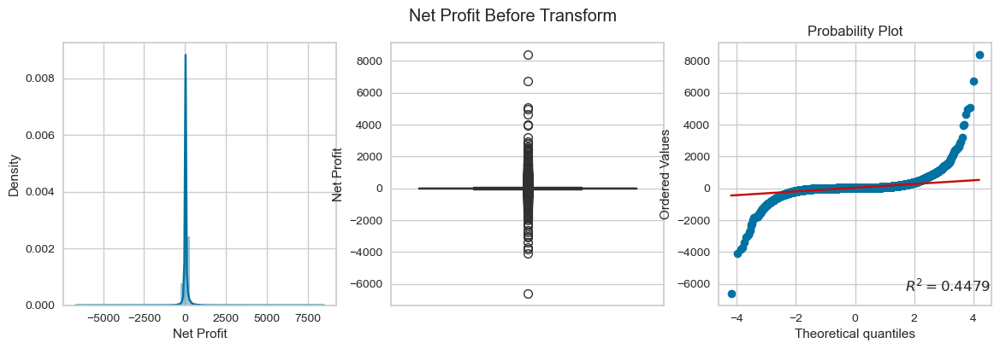

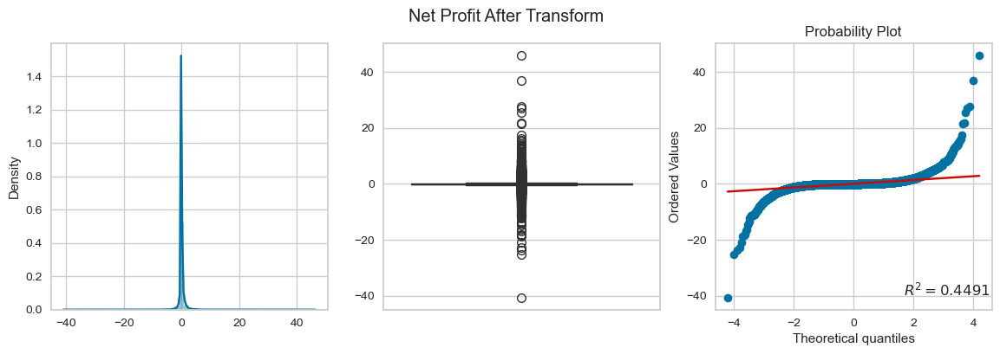

posx and posy should be finite values
posx and posy should be finite values


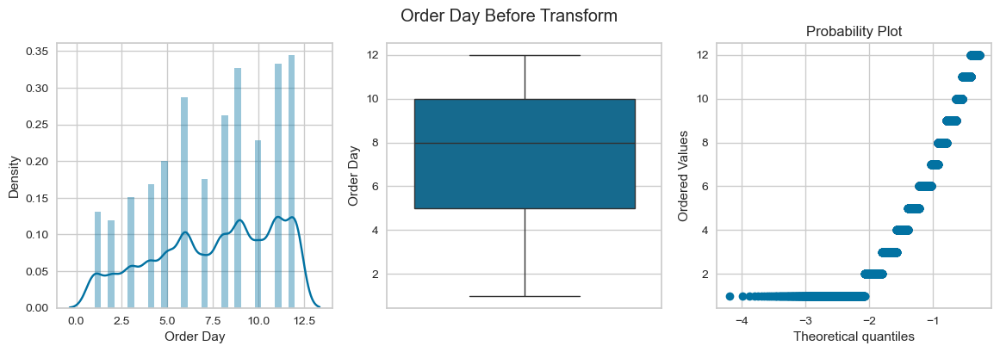

posx and posy should be finite values
posx and posy should be finite values


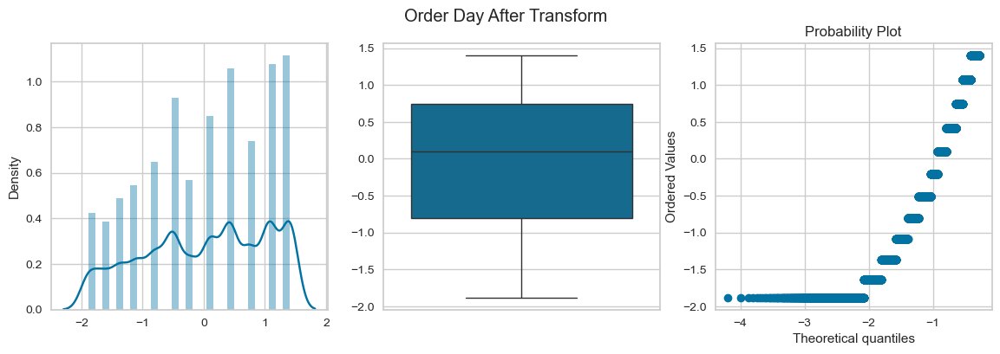

posx and posy should be finite values
posx and posy should be finite values


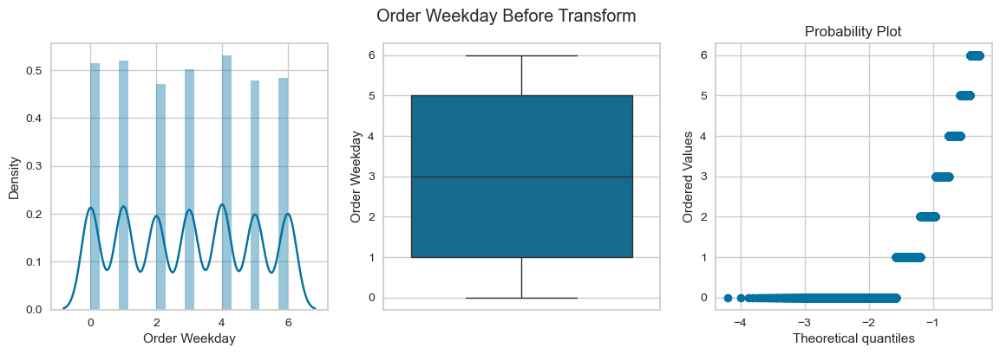

posx and posy should be finite values
posx and posy should be finite values


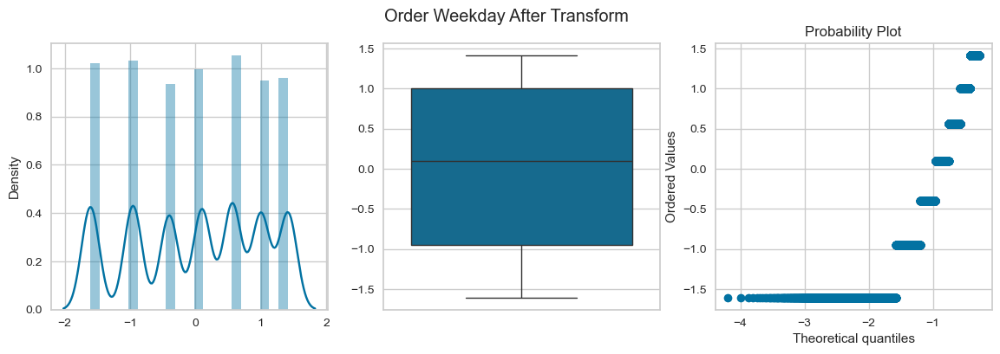

posx and posy should be finite values
posx and posy should be finite values


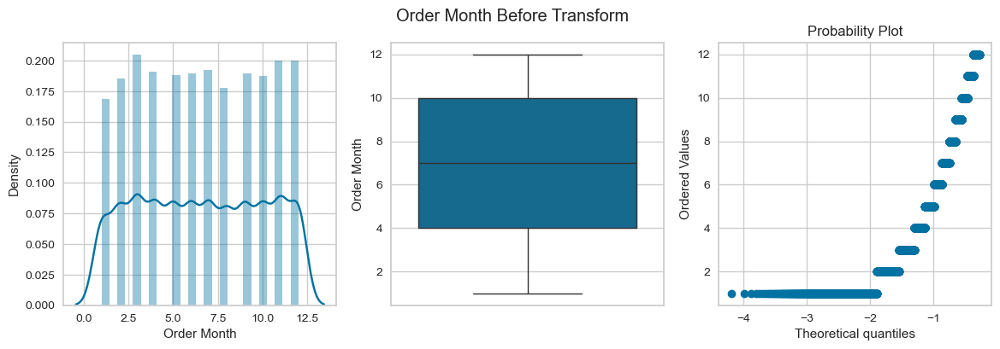

posx and posy should be finite values
posx and posy should be finite values


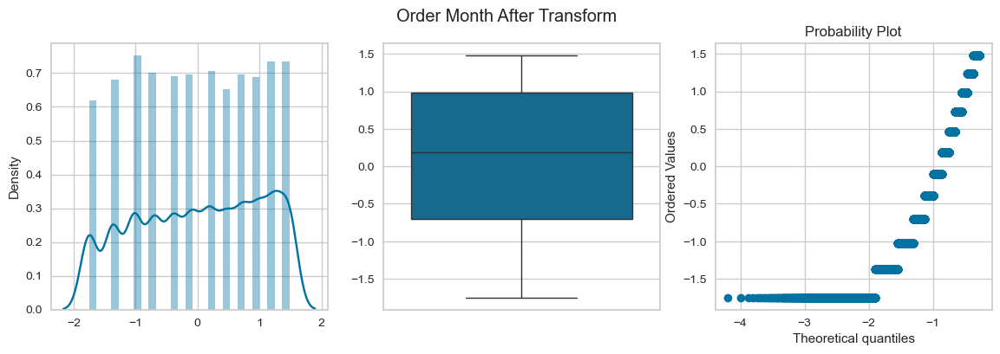

posx and posy should be finite values
posx and posy should be finite values


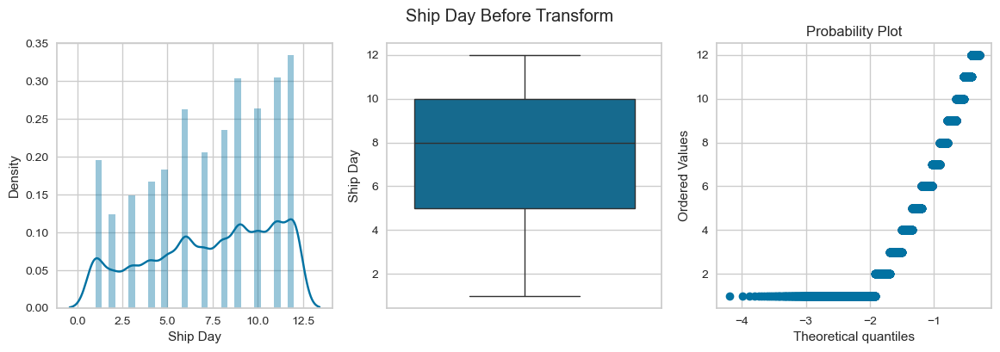

posx and posy should be finite values
posx and posy should be finite values


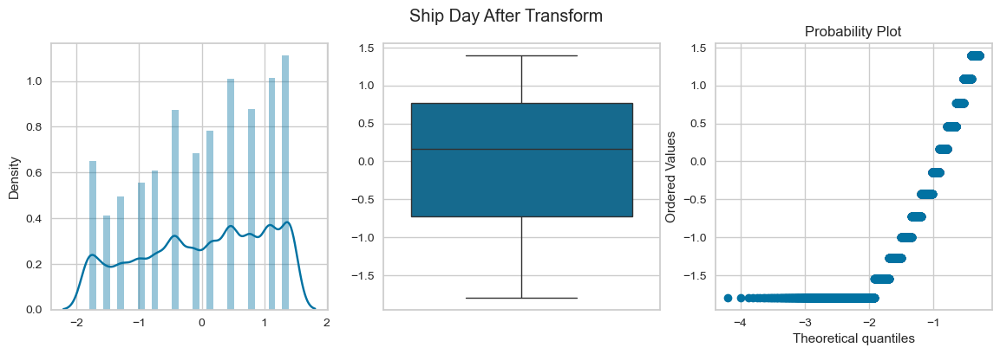

In [63]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br>
Operating Expenses: Power Transform <br>
Net Profit: Log Transform

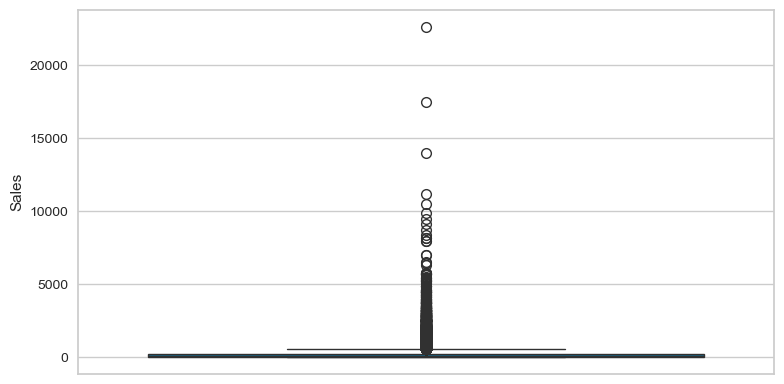

In [64]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [65]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

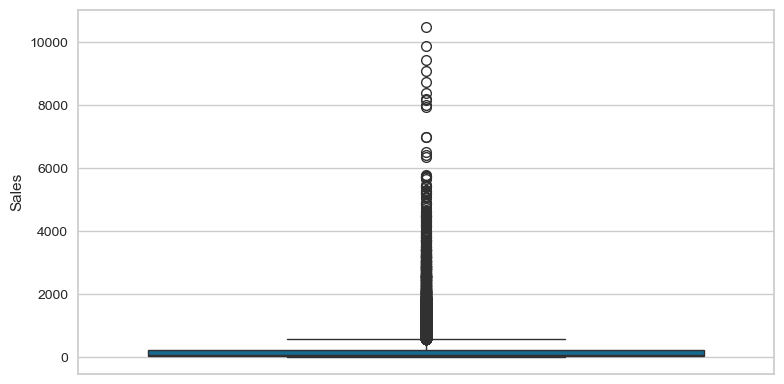

In [66]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [67]:
df.isnull().sum()

Market                                                0
Sales                                                 0
Quantity                                              0
Discount                                              0
Profit                                                0
                                                     ..
Product Name_Sanford Pencil Sharpener, Water Color    0
Product Name_Smead File Cart, Single Width            0
Product Name_Stanley Pencil Sharpener, Water Color    0
Product Name_Staples                                  0
Product Name_infrequent_sklearn                       0
Length: 72, dtype: int64

In [68]:
df = df.dropna()
df.shape

(13296, 72)

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13296 entries, 0 to 20055
Data columns (total 72 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Market                                              13296 non-null  object 
 1   Sales                                               13296 non-null  float64
 2   Quantity                                            13296 non-null  int64  
 3   Discount                                            13296 non-null  float64
 4   Profit                                              13296 non-null  float64
 5   Shipping Cost                                       13296 non-null  float64
 6   Order Priority                                      13296 non-null  object 
 7   Profit Margin                                       13296 non-null  float64
 8   Discounted Profit                                   13296 non-null  float64
 9   

In [70]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [71]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13296 entries, 0 to 20055
Data columns (total 71 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Market                                              13296 non-null  object 
 1   Quantity                                            13296 non-null  int64  
 2   Discount                                            13296 non-null  float64
 3   Profit                                              13296 non-null  float64
 4   Shipping Cost                                       13296 non-null  float64
 5   Order Priority                                      13296 non-null  object 
 6   Profit Margin                                       13296 non-null  float64
 7   Discounted Profit                                   13296 non-null  float64
 8   Discount Percentage                                 13296 non-null  float64
 9   

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [73]:
X_train.shape, X_test.shape

((9307, 71), (3989, 71))

In [74]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [75]:
X_train.shape, X_test.shape

((9307, 65), (3989, 65))

In [76]:
X_train = X_train.drop('Market', axis=1)
X_test = X_test.drop('Market', axis=1)
X_train=X_train.drop('Order Priority', axis=1)
X_test=X_test.drop('Order Priority', axis=1)

In [77]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3989 entries, 17138 to 10355
Data columns (total 63 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Quantity                                            3989 non-null   int64  
 1   Discount                                            3989 non-null   float64
 2   Shipping Cost                                       3989 non-null   float64
 3   Discounted Profit                                   3989 non-null   float64
 4   Discount Percentage                                 3989 non-null   float64
 5   Operating Expenses                                  3989 non-null   float64
 6   Order Year                                          3989 non-null   float64
 7   Order Month                                         3989 non-null   float64
 8   Order Day                                           3989 non-null   float64
 9

In [78]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x0000022679188860>)

In [79]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Shipping Cost', 'Discounted Profit',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Binders',
       'Sub-Category_Chairs', 'Sub-Category_Phones',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [80]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x0000022679188860>)

In [81]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Shipping Cost', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Art', 'Sub-Category_Binders', 'Sub-Category_Chairs',
       'Sub-Category_Labels', 'Sub-Category_Phones',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [82]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [83]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Discount', 'City_Los Angeles', 'City_New York City',
       'City_San Francisco', 'City_Seattle', 'City_infrequent_sklearn',
       'Region_North', 'Region_Oceania', 'Region_Southeast Asia',
       'Region_West'], dtype=object)

In [84]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [85]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Discounted Profit', 'Discount Percentage', 'Operating Expenses'],
      dtype=object)

In [86]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [87]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Quantity', 'Shipping Cost', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Order Day',
       'Ship Month', 'Region_East', 'Category_Technology',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [88]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [89]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'City_infrequent_sklearn', 'Region_Central',
       'Region_North', 'Region_Oceania', 'Region_Southeast Asia',
       'Sub-Category_Chairs'], dtype=object)

In [90]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=None,
             n_jobs=None, num_parallel_tree=None, ...)

In [91]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

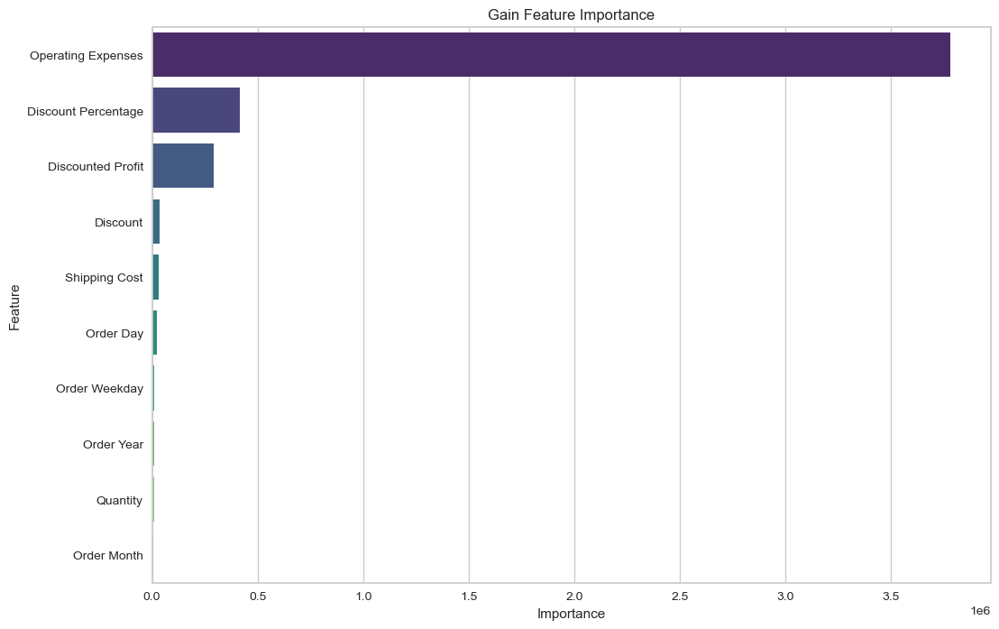

In [92]:
plot_feature_importances('gain')

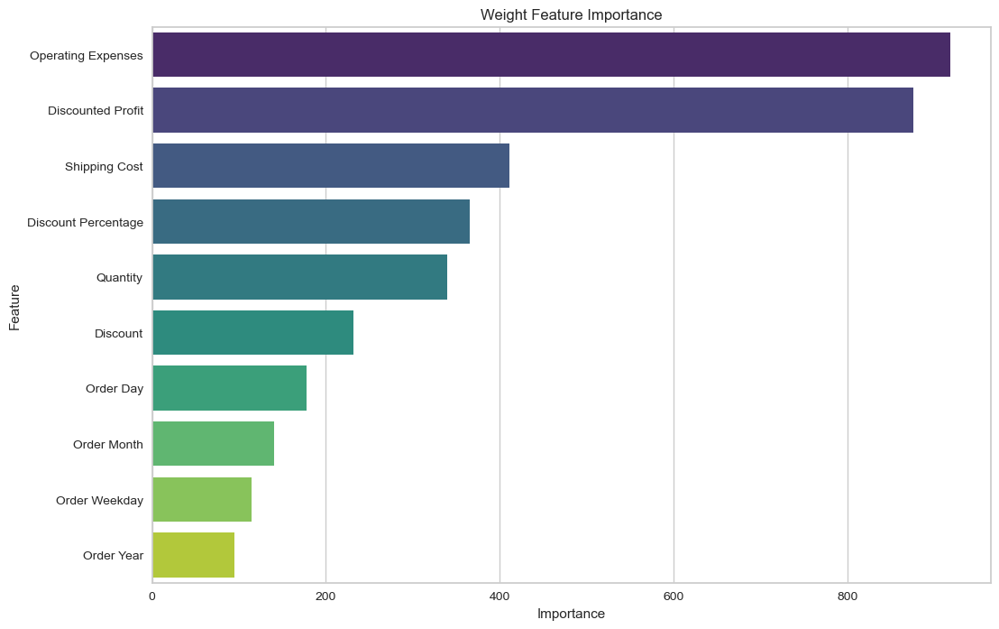

In [93]:
plot_feature_importances('weight')

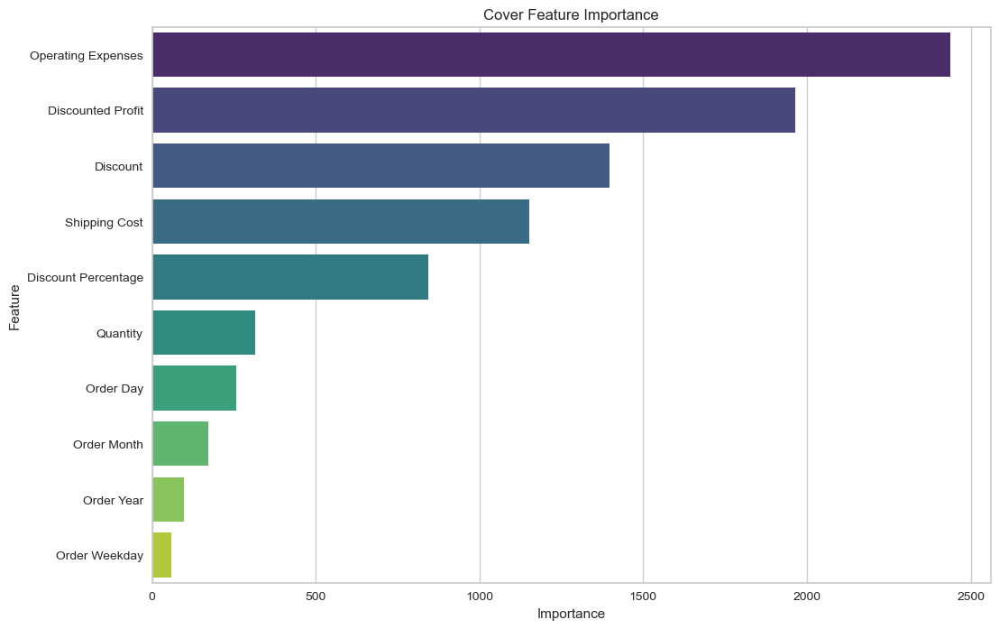

In [94]:
plot_feature_importances('cover')

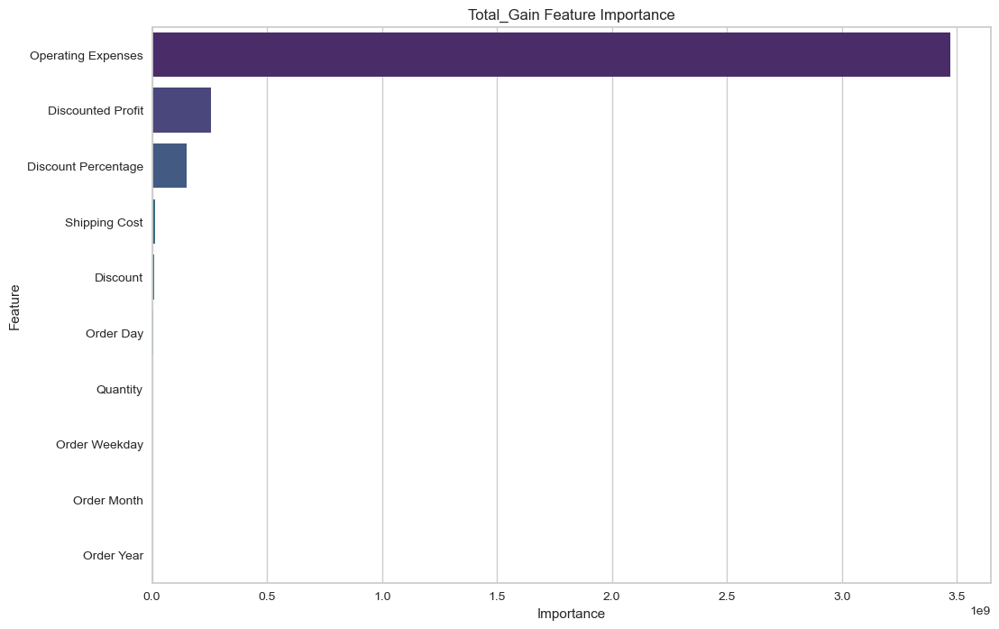

In [95]:
plot_feature_importances('total_gain')

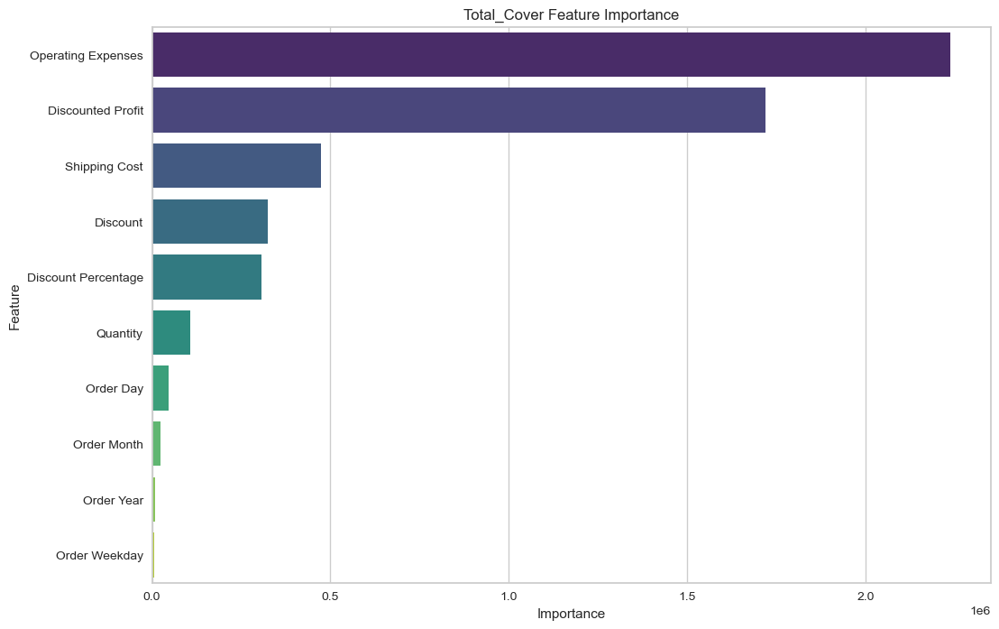

In [96]:
plot_feature_importances('total_cover')

In [97]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9307 entries, 11562 to 9843
Data columns (total 63 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Quantity                                            9307 non-null   int64  
 1   Discount                                            9307 non-null   float64
 2   Shipping Cost                                       9307 non-null   float64
 3   Discounted Profit                                   9307 non-null   float64
 4   Discount Percentage                                 9307 non-null   float64
 5   Operating Expenses                                  9307 non-null   float64
 6   Order Year                                          9307 non-null   float64
 7   Order Month                                         9307 non-null   float64
 8   Order Day                                           9307 non-null   float64
 9 

In [98]:
# Add the 'Profit' column from the original df based on X_train's index
X_train['Profit'] = df.loc[X_train.index, 'Profit']
X_train['Ship Day'] = df.loc[X_train.index, 'Ship Day']
X_test['Profit'] = df.loc[X_test.index, 'Profit']
X_test['Ship Day'] = df.loc[X_test.index, 'Ship Day']

In [99]:
final_selected_features = ['Profit',
                           'Discount Percentage',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [100]:
gc.collect()

4016

In [101]:
final_X_train.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
11562,19.44,0.000000,0.0,9.0,9.0,3,52.65,9.0,0.0
9647,26.10,0.000000,0.0,6.0,5.0,5,118.95,6.0,0.0
916,67.32,0.000000,0.0,11.0,3.0,6,225.48,11.0,4.0
8873,-43.17,1.216545,0.6,9.0,3.0,1,92.49,9.0,5.0
10585,2.34,0.000000,0.0,5.0,7.0,2,77.16,5.0,4.0


In [102]:
final_X_test.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
17138,3.5505,0.000000,0.0,1.0,8.0,1,4.3395,1.0,4.0
4486,9.5400,0.000000,0.0,10.0,3.0,3,11.2200,10.0,5.0
9027,4.5360,0.291937,0.4,1.0,4.0,2,132.4800,1.0,0.0
17516,-72.1760,0.203351,0.4,10.0,8.0,4,268.8800,10.0,6.0
9357,248.3400,0.000000,0.0,11.0,4.0,3,786.6000,11.0,3.0


In [103]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [104]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.386294,3.017494,0.000000,-0.671004,-0.239802,9.0,9.0,9.0,0.0
1,1.791759,3.299534,0.000000,-0.671004,0.329132,6.0,5.0,6.0,0.0
2,1.945910,4.224203,0.000000,-0.671004,0.760517,11.0,3.0,11.0,4.0
3,0.693147,NaN,0.774597,1.865296,0.155680,9.0,3.0,9.0,5.0
4,1.098612,1.205971,0.000000,-0.671004,0.029507,5.0,7.0,5.0,4.0


In [105]:
final_X_test.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.693147,1.515237,0.000000,-0.671004,-2.023365,1.0,8.0,1.0,4.0
1,1.386294,2.355178,0.000000,-0.671004,-1.356303,10.0,3.0,10.0,5.0
2,1.098612,1.711272,0.632456,0.856815,0.402767,1.0,4.0,1.0,0.0
3,1.609438,NaN,0.632456,0.547860,0.876794,10.0,8.0,10.0,6.0
4,1.386294,5.518817,0.000000,-0.671004,1.562496,11.0,4.0,11.0,3.0


### Missing Value Imputation

In [106]:
final_X_train.isna().sum()

Profit                    0
Discount Percentage    2187
Discount                  0
Order Day                 0
Order Month               0
Quantity                  0
Operating Expenses        0
Ship Day                  0
Order Weekday             0
dtype: int64

In [107]:
final_X_test.isnull().sum()

Profit                   0
Discount Percentage    932
Discount                 0
Order Day                0
Order Month              0
Quantity                 0
Operating Expenses       0
Ship Day                 0
Order Weekday            0
dtype: int64

In [108]:
def clean_and_impute(df, col, imputer=None):
    """Handle inf/-inf and impute missing values"""
    df = df.copy()
    df[col] = df[col].replace([np.inf, -np.inf], np.nan)
    
    if imputer is None:
        imputer = SimpleImputer(strategy='median')
        df[col] = imputer.fit_transform(df[[col]])
        return df, imputer
    else:
        df[col] = imputer.transform(df[[col]])
        return df  # Removed [0] indexing here

# First call returns (df, imputer)
final_X_train, imputer = clean_and_impute(final_X_train, 'Discount Percentage')

# Second call just returns df
final_X_test = clean_and_impute(final_X_test, 'Discount Percentage', imputer)

In [109]:
# Check for infinity or extremely large values
print(np.isinf(final_X_train['Discount Percentage']).sum())
print(np.isinf(final_X_test['Discount Percentage']).sum())

# Optional: Check for NaNs or very large numbers
print(final_X_train['Discount Percentage'].describe())


0
0
count    9307.000000
mean        2.965140
std         1.328321
min        -4.135167
25%         2.265667
50%         2.919628
75%         3.608076
max         7.937726
Name: Discount Percentage, dtype: float64


In [110]:
# Fit only on training, transform both
imputer = SimpleImputer(strategy='median')

final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.transform(final_X_test[['Discount Percentage']])


In [111]:
final_X_train['Discount Percentage'].replace([np.inf, -np.inf], np.nan, inplace=True)
final_X_test['Discount Percentage'].replace([np.inf, -np.inf], np.nan, inplace=True)


In [112]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [113]:
final_X_train.isna().sum()

Profit                 0
Discount Percentage    0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

In [114]:
final_X_test.isnull().sum()

Profit                 0
Discount Percentage    0
Discount               0
Order Day              0
Order Month            0
Quantity               0
Operating Expenses     0
Ship Day               0
Order Weekday          0
dtype: int64

### Outlier Treatment

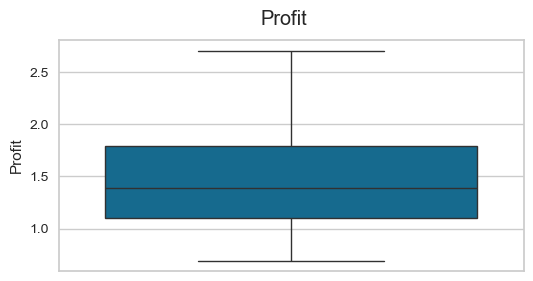

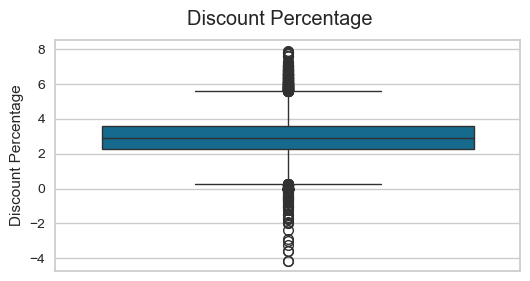

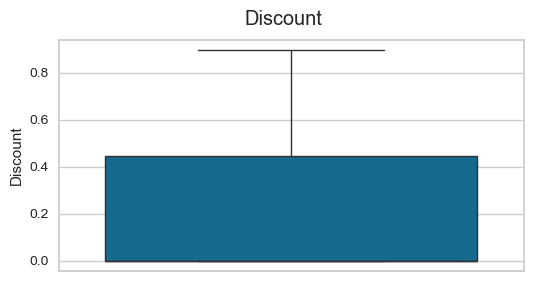

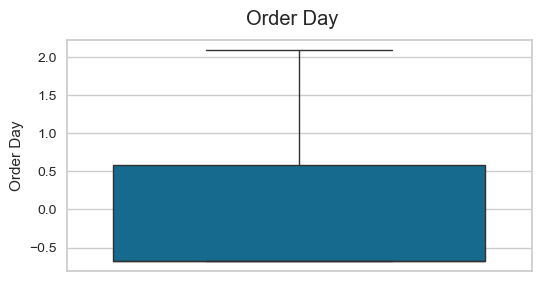

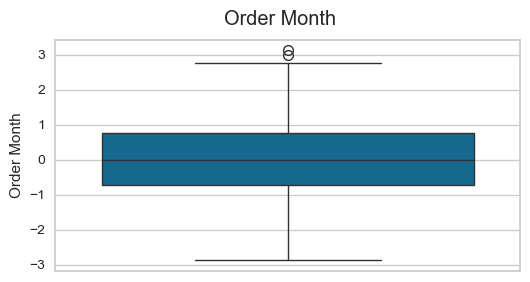

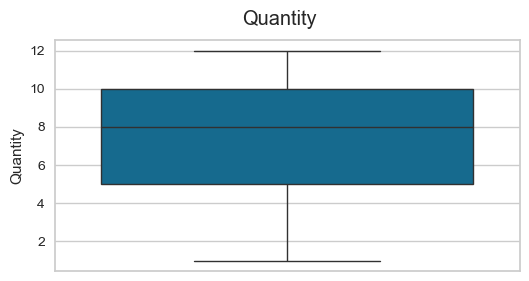

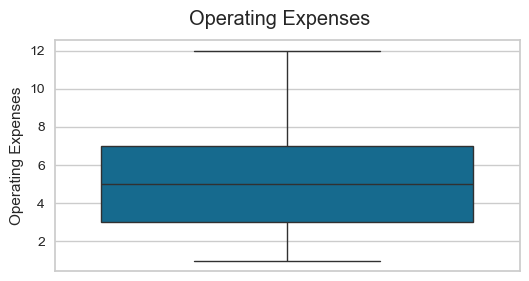

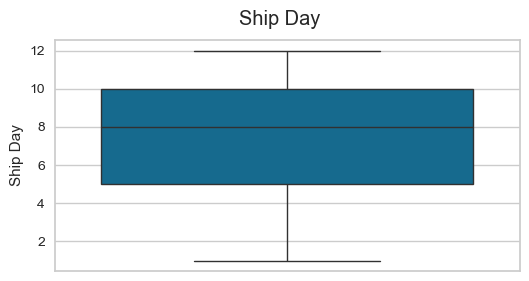

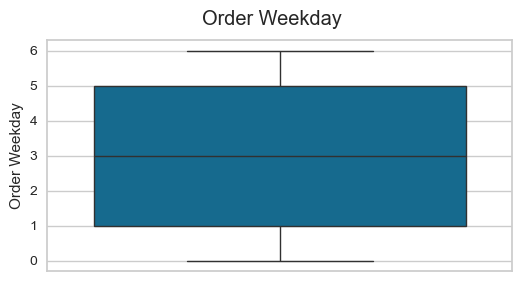

In [115]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

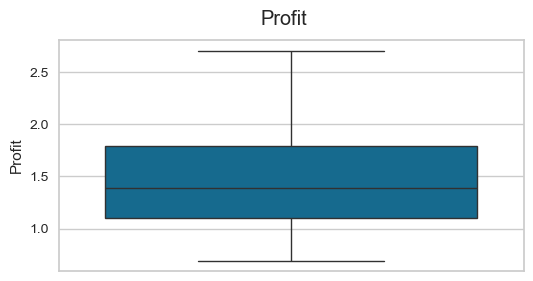

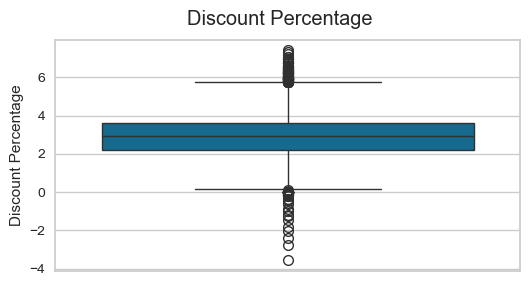

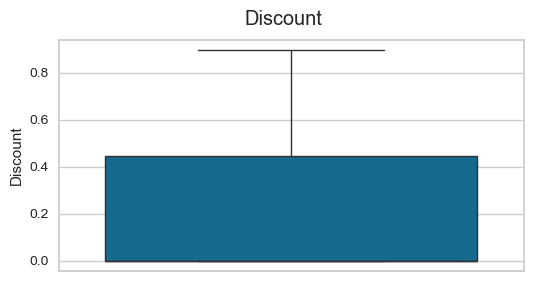

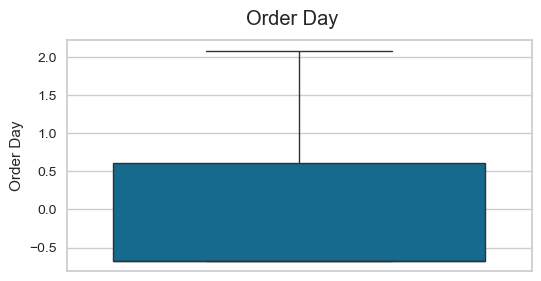

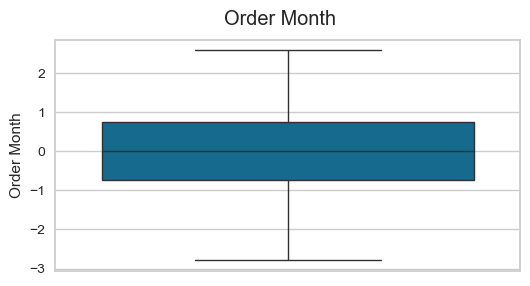

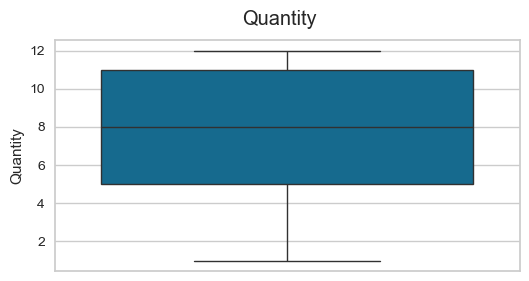

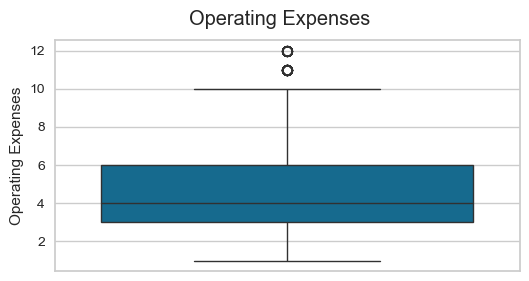

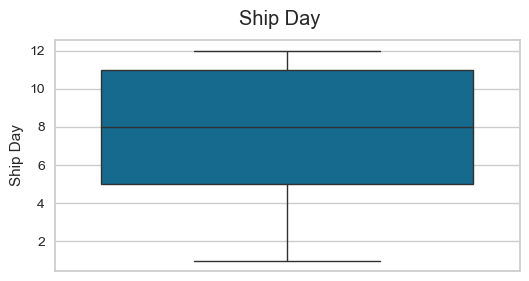

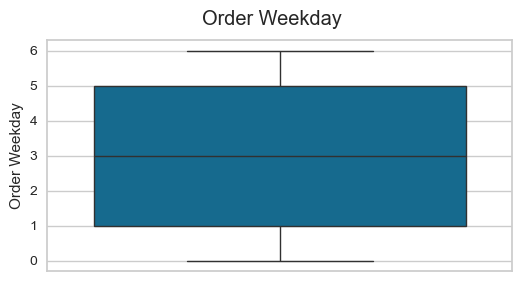

In [116]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [117]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

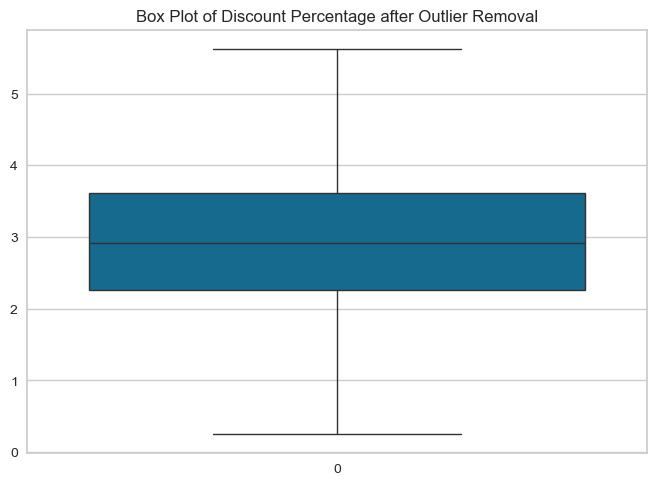

In [118]:
impute_outliers(final_X_train,'Discount Percentage')

In [119]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

In [120]:
# Example: Fill NaNs with median
final_X_train['Discount Percentage'].fillna(final_X_train['Discount Percentage'].median(), inplace=True)
final_X_test['Discount Percentage'].fillna(final_X_train['Discount Percentage'].median(), inplace=True)

# Apply Winsorizer
winsorizer = Winsorizer(capping_method='iqr', fold=1.5, tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])


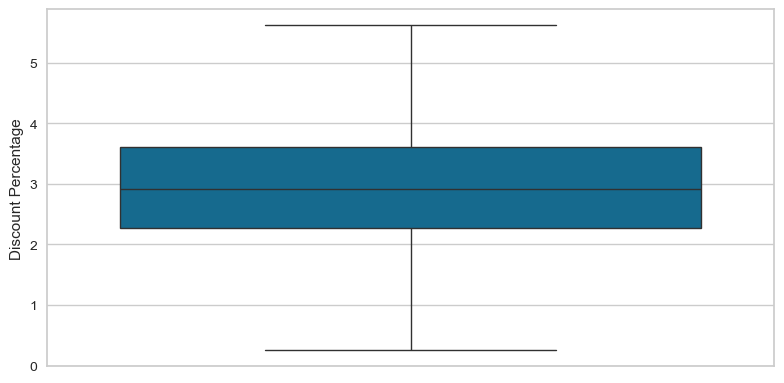

In [121]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

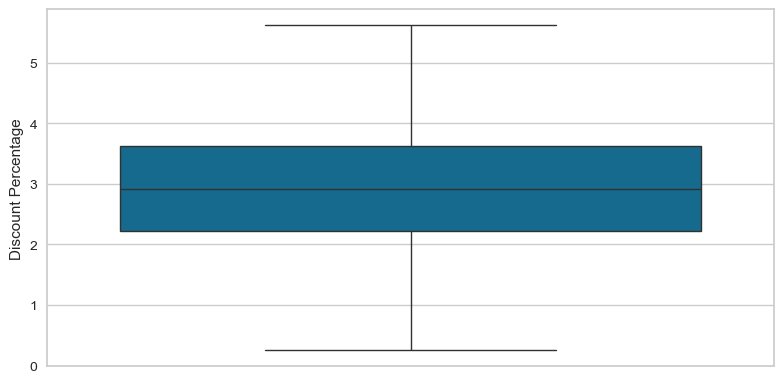

In [122]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [123]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.005199,0.047417,-0.795661,-0.671004,-0.239802,0.446622,1.642030,0.446622,-1.518410
1,0.858080,0.274854,-0.795661,-0.671004,0.329132,-0.476476,0.094291,-0.476476,-1.518410
2,1.182330,1.020506,-0.795661,-0.671004,0.760517,1.062020,-0.679578,1.062020,0.494386
3,-1.452811,-0.031501,1.824744,1.865296,0.155680,0.446622,-0.679578,0.446622,0.997585
4,-0.599930,-1.413393,-0.795661,-0.671004,0.029507,-0.784175,0.868161,-0.784175,0.494386


In [124]:
final_X_test.head()

,Profit,Discount Percentage,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-1.452811,-1.164001,-0.795661,-0.671004,-2.023365,-2.014971,1.255096,-2.014971,0.494386
1,0.005199,-0.486674,-0.795661,-0.671004,-1.356303,0.754321,-0.679578,0.754321,0.997585
2,-0.599930,-1.005919,1.343890,0.856815,0.402767,-2.014971,-0.292644,-2.014971,-1.518410
3,0.474573,-0.031501,1.343890,0.547860,0.876794,0.754321,1.255096,0.754321,1.500784
4,0.005199,2.064482,-0.795661,-0.671004,1.562496,1.062020,-0.292644,1.062020,-0.008813


In [125]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

# Milestone 3: Forecasting Model Development and Optimization 

## Model Training & Evaluation

In [126]:
models = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []
r2_scores = []
training_times = []

In [127]:
def train_and_evaluate_model(model):
    start_time = time.time()
    model.fit(final_X_train,y_train)
    duration = time.time() - start_time
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    mape = mean_absolute_percentage_error(y_test,y_pred)
    print("Mean Absolute Error:",mae)
    print("Mean Squared Error:",mse)
    print("Root Mean Squared Error:",rmse)
    print("Mean Absolute Percentage Error:",mape)
    print("R2 Score:",r2)
    print("Training Time:",duration)
    training_times.append(duration)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)
    r2_scores.append(r2)
    models.append(model)

    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse, duration, prediction_error, res_plot
    except Exception as e:
        pass

    gc.collect()

In [128]:
train_and_evaluate_model(LinearRegression())

Mean Absolute Error: 189.2492504213741
Mean Squared Error: 92930.93652722999
Root Mean Squared Error: 304.84575858494406
Mean Absolute Percentage Error: 6.2488919538025485
R2 Score: 0.4940367039191176
Training Time: 0.009389638900756836


In [129]:
train_and_evaluate_model(KNeighborsRegressor())

Mean Absolute Error: 59.129795187766355
Mean Squared Error: 34261.65185052155
Root Mean Squared Error: 185.09903254885356
Mean Absolute Percentage Error: 0.23167363191269005
R2 Score: 0.813462137074384
Training Time: 0.02538776397705078


Mean Absolute Error: 115.77223435510341
Mean Squared Error: 128478.92435452892
Root Mean Squared Error: 358.4395686228418
Mean Absolute Percentage Error: 0.5014362161256681
R2 Score: 0.3004953735261636
Training Time: 4.9262590408325195


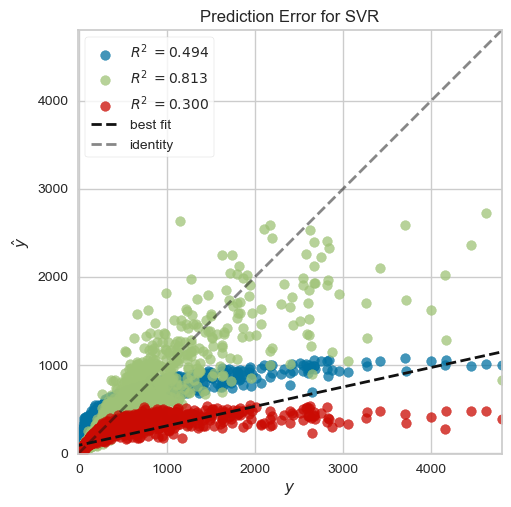

In [130]:
train_and_evaluate_model(SVR())

Mean Absolute Error: 15.371378751566809
Mean Squared Error: 5228.713050887445
Root Mean Squared Error: 72.30984062274958
Mean Absolute Percentage Error: 0.03469810494519453
R2 Score: 0.971532226098755
Training Time: 0.09080338478088379


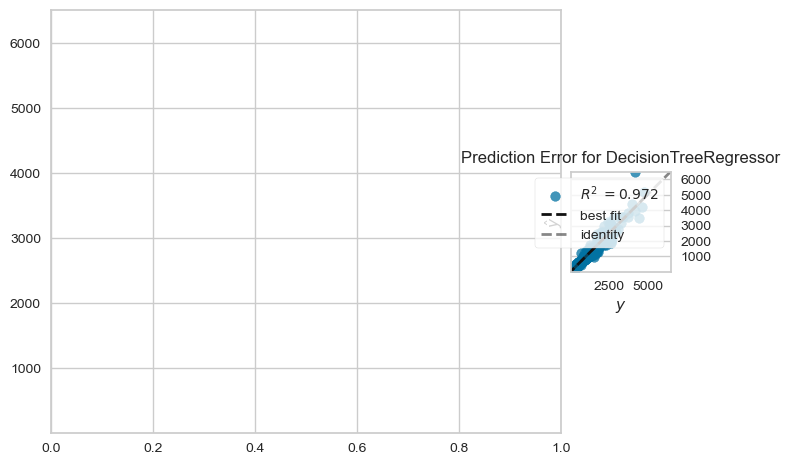

In [131]:
train_and_evaluate_model(DecisionTreeRegressor())

Mean Absolute Error: 10.274808346402601
Mean Squared Error: 2946.3188418750033
Root Mean Squared Error: 54.280004070329646
Mean Absolute Percentage Error: 0.016021690156819344
R2 Score: 0.9839587413164239
Training Time: 3.606374740600586


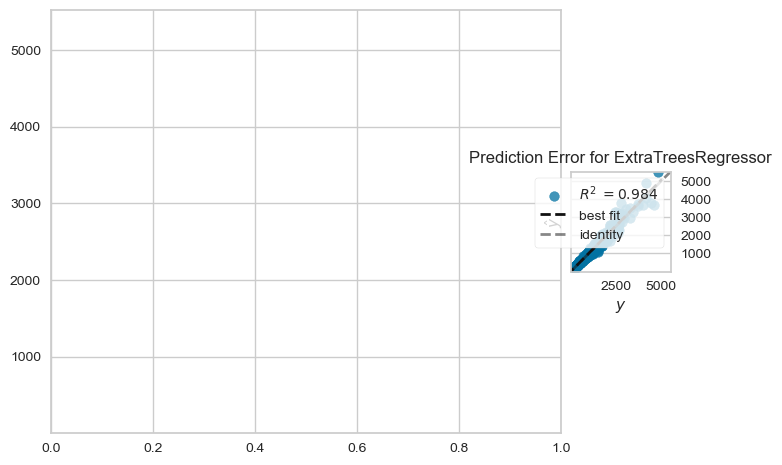

In [132]:
train_and_evaluate_model(ExtraTreesRegressor())

Mean Absolute Error: 11.600452073101023
Mean Squared Error: 3175.6469427420125
Root Mean Squared Error: 56.35287874405364
Mean Absolute Percentage Error: 0.023035221472424136
R2 Score: 0.982710162467069
Training Time: 5.755055904388428


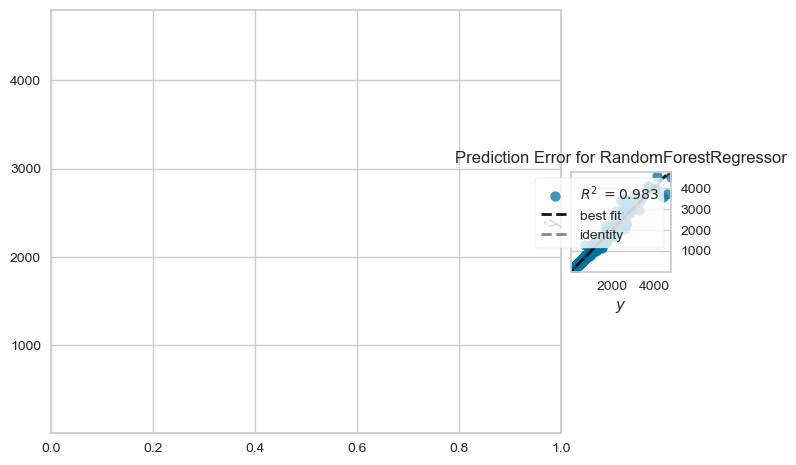

In [133]:
train_and_evaluate_model(RandomForestRegressor())

[iter 0] loss=7.5659 val_loss=0.0000 scale=1.0000 norm=257.0734
[iter 100] loss=6.2530 val_loss=0.0000 scale=2.0000 norm=95.2752
[iter 200] loss=5.3190 val_loss=0.0000 scale=2.0000 norm=41.3081
[iter 300] loss=4.4026 val_loss=0.0000 scale=2.0000 norm=32.6711
[iter 400] loss=3.8565 val_loss=0.0000 scale=2.0000 norm=29.9282
Mean Absolute Error: 17.10607550425657
Mean Squared Error: 2764.0073211417616
Root Mean Squared Error: 52.57382733967313
Mean Absolute Percentage Error: 0.1481247097368678
R2 Score: 0.984951337984345
Training Time: 24.413711309432983


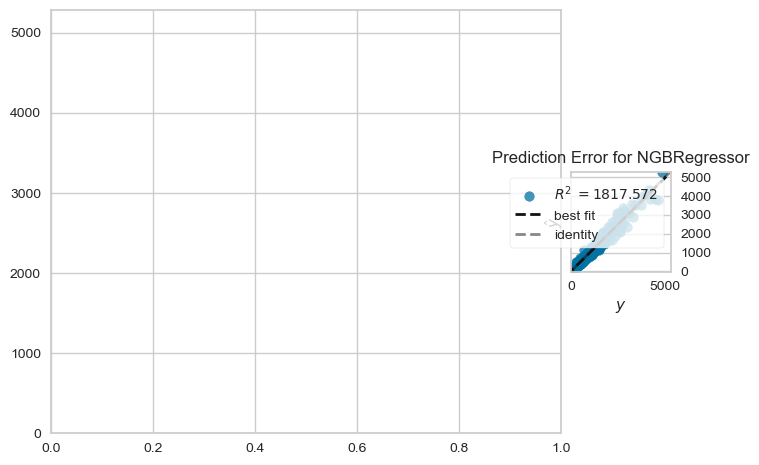

In [134]:
train_and_evaluate_model(NGBRegressor())

Mean Absolute Error: 19.932871008253958
Mean Squared Error: 3346.650043030326
Root Mean Squared Error: 57.85023805508778
Mean Absolute Percentage Error: 0.24698788601109423
R2 Score: 0.981779134593089
Training Time: 0.16201281547546387


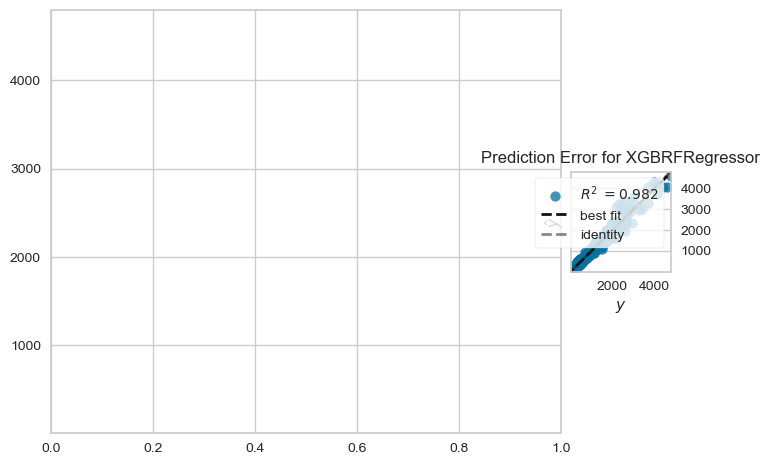

In [135]:
train_and_evaluate_model(XGBRFRegressor())

Mean Absolute Error: 16.13944014918188
Mean Squared Error: 7544.234333623092
Root Mean Squared Error: 86.85755196655667
Mean Absolute Percentage Error: 0.04725517399647974
R2 Score: 0.9589253502386901
Training Time: 0.15481185913085938


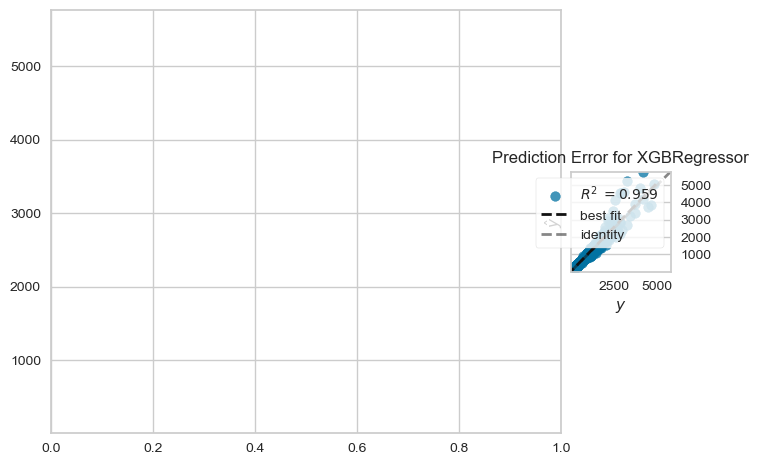

In [136]:
train_and_evaluate_model(XGBRegressor())

## Baseline Models Performance Comparison

In [137]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'MAE': mape_scores,
                            'MSE': mse_scores,
                            'RMSE': rmse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,Training Time
0,NGBRegressor(random_state=RandomState(MT19937)...,0.984951,0.148125,2764.007321,52.573827,24.413711
1,"(ExtraTreeRegressor(random_state=1737012333), ...",0.983959,0.016022,2946.318842,54.280004,3.606375
2,"(DecisionTreeRegressor(max_features=1.0, rando...",0.982710,0.023035,3175.646943,56.352879,5.755056
3,"XGBRFRegressor(base_score=None, booster=None, ...",0.981779,0.246988,3346.650043,57.850238,0.162013
4,DecisionTreeRegressor(),0.971532,0.034698,5228.713051,72.309841,0.090803
5,"XGBRegressor(base_score=None, booster=None, ca...",0.958925,0.047255,7544.234334,86.857552,0.154812
6,KNeighborsRegressor(),0.813462,0.231674,34261.651851,185.099033,0.025388
7,LinearRegression(),0.494037,6.248892,92930.936527,304.845759,0.009390
8,SVR(),0.300495,0.501436,128478.924355,358.439569,4.926259


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [138]:
print(f"Mean cross validation training R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_train,y_train,cv=5,scoring='r2',verbose=0))*100,2)}%")

[iter 0] loss=7.5334 val_loss=0.0000 scale=1.0000 norm=254.1811
[iter 100] loss=6.2299 val_loss=0.0000 scale=2.0000 norm=93.9324
[iter 200] loss=5.2835 val_loss=0.0000 scale=2.0000 norm=39.4772
[iter 300] loss=4.3597 val_loss=0.0000 scale=2.0000 norm=31.5476
[iter 400] loss=3.8442 val_loss=0.0000 scale=2.0000 norm=28.8646
[iter 0] loss=7.5813 val_loss=0.0000 scale=1.0000 norm=259.0356
[iter 100] loss=6.2658 val_loss=0.0000 scale=2.0000 norm=95.9924
[iter 200] loss=5.3317 val_loss=0.0000 scale=2.0000 norm=41.2278
[iter 300] loss=4.3687 val_loss=0.0000 scale=2.0000 norm=32.3535
[iter 400] loss=3.8610 val_loss=0.0000 scale=2.0000 norm=29.7988
[iter 0] loss=7.5494 val_loss=0.0000 scale=1.0000 norm=255.2883
[iter 100] loss=6.2385 val_loss=0.0000 scale=2.0000 norm=93.4611
[iter 200] loss=5.3078 val_loss=0.0000 scale=2.0000 norm=40.8674
[iter 300] loss=4.4058 val_loss=0.0000 scale=2.0000 norm=31.5087
[iter 400] loss=3.8596 val_loss=0.0000 scale=2.0000 norm=28.8637
[iter 0] loss=7.5928 val_los

In [139]:
print(f"Mean cross validation test R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_test,y_test,cv=5,scoring='r2',verbose=0))*100,2)}%")

[iter 0] loss=7.4919 val_loss=0.0000 scale=1.0000 norm=249.6668
[iter 100] loss=6.1931 val_loss=0.0000 scale=2.0000 norm=90.3741
[iter 200] loss=5.2476 val_loss=0.0000 scale=2.0000 norm=33.7759
[iter 300] loss=4.3529 val_loss=0.0000 scale=2.0000 norm=26.0051
[iter 400] loss=3.7703 val_loss=0.0000 scale=2.0000 norm=23.1138
[iter 0] loss=7.4882 val_loss=0.0000 scale=1.0000 norm=250.8416
[iter 100] loss=6.1869 val_loss=0.0000 scale=2.0000 norm=90.3672
[iter 200] loss=5.2444 val_loss=0.0000 scale=2.0000 norm=34.4344
[iter 300] loss=4.3337 val_loss=0.0000 scale=2.0000 norm=26.6806
[iter 400] loss=3.7811 val_loss=0.0000 scale=2.0000 norm=24.0751
[iter 0] loss=7.4509 val_loss=0.0000 scale=1.0000 norm=247.1678
[iter 100] loss=6.1610 val_loss=0.0000 scale=2.0000 norm=89.4567
[iter 200] loss=5.2197 val_loss=0.0000 scale=2.0000 norm=33.8974
[iter 300] loss=4.3769 val_loss=0.0000 scale=2.0000 norm=27.0726
[iter 400] loss=3.7924 val_loss=0.0000 scale=2.0000 norm=23.7296
[iter 0] loss=7.4565 val_los

The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

In [140]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.2s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=12, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=12, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=12, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=ball_tree, metric=manhattan, n_neighbors=12, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=absolute_error, max_features=sqrt, splitter=random; total time=   0.4s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=random; total time=   0.5s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=random; total time=   0.6s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=random; total time=   0.6s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=random; total time=   0.4s
[CV] END criterion=poisson, max_features=log2, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=best; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=best; total time=   0.0s
[CV] END criterion=absolute_error, max_features=sqrt, splitter=best; total time=   0

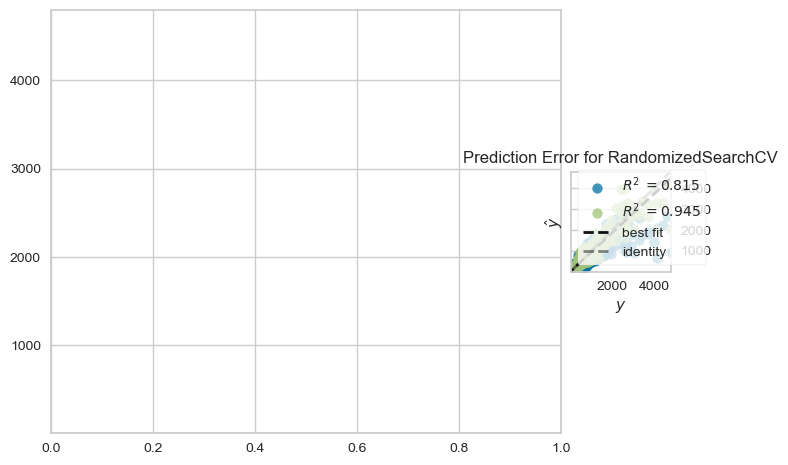

In [141]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=dart, grow_policy=depthwise, importance_type=gain, learning_rate=0.1, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, grow_policy=depthwise, importance_type=gain, learning_rate=0.1, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, grow_policy=depthwise, importance_type=gain, learning_rate=0.1, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, grow_policy=depthwise, importance_type=gain, learning_rate=0.1, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, grow_policy=depthwise, importance_type=gain, learning_rate=0.1, n_estimators=100, sampling_method=gradient_based;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, grow_policy=lossguide, importance_type=total_cover, lea

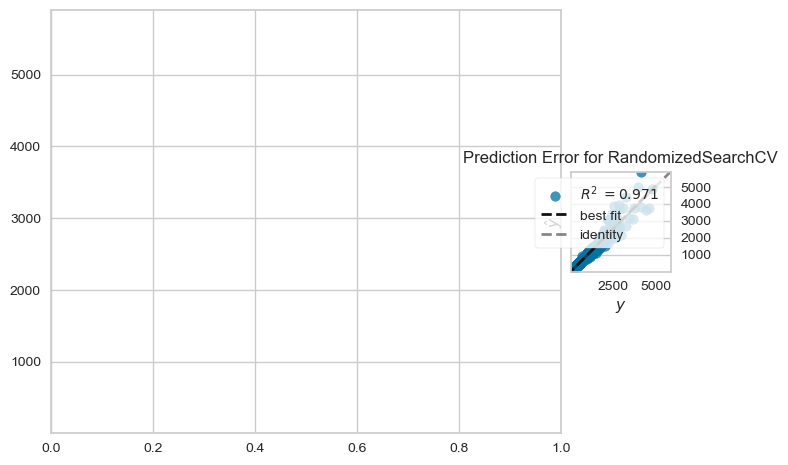

In [143]:
import xgboost as xgb

param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': ['depthwise','lossguide'],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(xgb.XGBRegressor(), param_grid, verbose=3, cv=5)
train_and_evaluate_model(grid_xgb)

In [144]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   5.6s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   5.7s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   5.4s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   5.4s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   5.2s
[CV] END C=10, degree=1, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   6.4s
[CV] END C=10, degree=1, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   6.5s
[CV] END C=10, degree=1, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   6.3s
[CV] END C=10, degree=1, epsilon=0.001, gamma=auto, kernel=rbf, shrinking=False; total time=   6.5s
[CV] END C=10, degree=1, epsilon=0.001, gamm

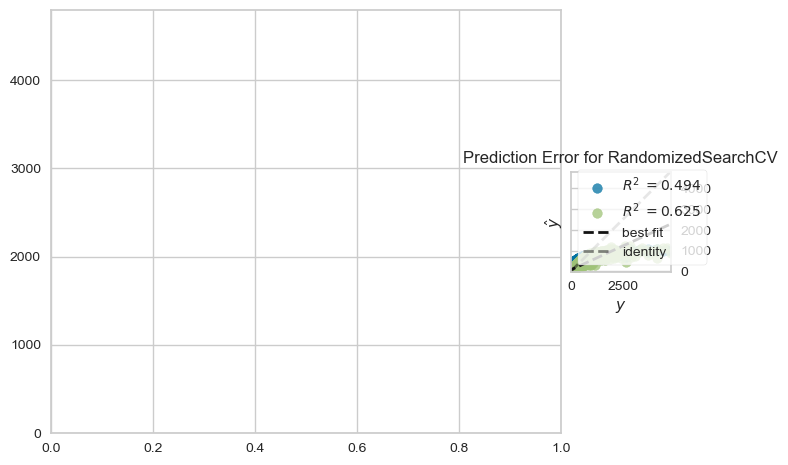

In [145]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.8s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.7s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.5s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.7s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=log2, max_samples=0.5, n_estimators=1000, oob_score=True; total time=   9.7s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.75, n_estimators=500, oob_score=False; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.75, n_estimators=5

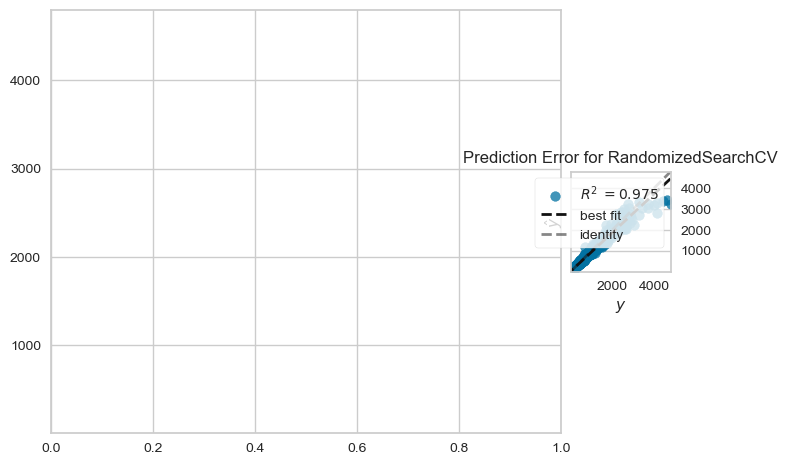

In [146]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END booster=dart, importance_type=weight, learning_rate=0.01, n_estimators=1000; total time=   1.4s
[CV] END booster=dart, importance_type=weight, learning_rate=0.01, n_estimators=1000; total time=   1.5s
[CV] END booster=dart, importance_type=weight, learning_rate=0.01, n_estimators=1000; total time=   1.6s
[CV] END booster=dart, importance_type=weight, learning_rate=0.01, n_estimators=1000; total time=   1.4s
[CV] END booster=dart, importance_type=weight, learning_rate=0.01, n_estimators=1000; total time=   1.6s
[CV] END booster=gblinear, importance_type=weight, learning_rate=1, n_estimators=200; total time=   0.0s
[CV] END booster=gblinear, importance_type=weight, learning_rate=1, n_estimators=200; total time=   0.0s
[CV] END booster=gblinear, importance_type=weight, learning_rate=1, n_estimators=200; total time=   0.0s
[CV] END booster=gblinear, importance_type=weight, learning_rate=1, n_estimators=200; total time=  

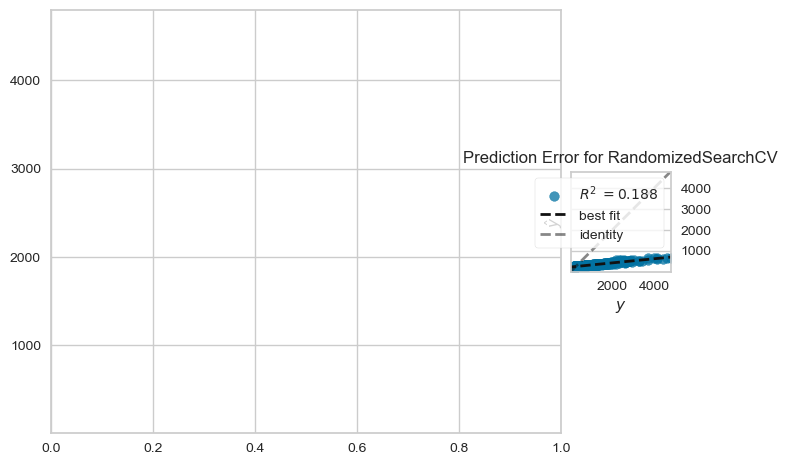

In [147]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

## Optimized Models Performance Comparison

In [148]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'RMSE': rmse_scores,
                            'MAPE': mape_scores,
                            'MSE': mse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs[:20]

,Model,R2,RMSE,MAPE,MSE,Training Time
0,NGBRegressor(random_state=RandomState(MT19937)...,0.984951,52.573827,0.148125,2764.007321,24.413711
1,"(ExtraTreeRegressor(random_state=1737012333), ...",0.983959,54.280004,0.016022,2946.318842,3.606375
2,"(DecisionTreeRegressor(max_features=1.0, rando...",0.982710,56.352879,0.023035,3175.646943,5.755056
3,"XGBRFRegressor(base_score=None, booster=None, ...",0.981779,57.850238,0.246988,3346.650043,0.162013
4,"RandomizedSearchCV(cv=5, estimator=ExtraTreesR...",0.975103,67.622348,0.080674,4572.781931,180.343001
5,DecisionTreeRegressor(),0.971532,72.309841,0.034698,5228.713051,0.090803
6,"RandomizedSearchCV(cv=5,\n e...",0.970519,73.584814,0.052765,5414.724842,26.552840
7,"XGBRegressor(base_score=None, booster=None, ca...",0.958925,86.857552,0.047255,7544.234334,0.154812
8,"RandomizedSearchCV(cv=5, estimator=DecisionTre...",0.944673,100.806228,0.093786,10161.895599,8.816177
9,"RandomizedSearchCV(cv=5, estimator=KNeighborsR...",0.815193,184.238157,0.254475,33943.698641,5.854637


Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 97.6%.

## Saving the best performing model for deployment into production

In [149]:
best_model = model_perfs['Model'].iloc[0]
best_model

NGBRegressor(random_state=RandomState(MT19937) at 0x22670AF1C40)

In [150]:
pipeline = Pipeline(steps=[
        ('transformer',transformer),
        ('scaler',scaler),
        ('model',best_model)
])
pipeline

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity', 'Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model',
                 NGBRegressor(random_state=RandomState(MT19937) at 0x22670AF1C40))])

In [158]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [152]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity', 'Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model',
                 NGBRegressor(random_state=RandomState(MT19937) at 0x226461BFB40))])

In [153]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

Min value of Profit: -3839.9904
Max value of Profit: 2799.984
Min value of Discount Percentage: 0.0
Max value of Discount Percentage: 143.88489208633092
Min value of Discount: 0.0
Max value of Discount: 0.8
Min value of Order Day: 1.0
Max value of Order Day: 12.0
Min value of Order Month: 1.0
Max value of Order Month: 12.0
Min value of Quantity: 1
Max value of Quantity: 14
Min value of Operating Expenses: 0.9359999999999999
Max value of Operating Expenses: 11839.9704
Min value of Ship Day: 1.0
Max value of Ship Day: 12.0
Min value of Order Weekday: 0.0
Max value of Order Weekday: 6.0


In [154]:
list(final_X_train.columns)

['Profit',
 'Discount Percentage',
 'Discount',
 'Order Day',
 'Order Month',
 'Quantity',
 'Operating Expenses',
 'Ship Day',
 'Order Weekday']

### Making a test prediction

In [155]:
pipeline.predict(pd.DataFrame([[3846.91,79.42479138,0.5,8.0,5.0,9.0,6293.46,29.0,3.0]],columns=list(final_X_train.columns)))

array([5605.39140786])

In [156]:
gc.collect()

5331

In [157]:
import sklearn
print(sklearn.__version__)

1.6.1
